<a href="https://colab.research.google.com/github/mostynw/e-commerce_classifier/blob/main/code.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# G26 Stock Price Prediction

# Descriptive analysis of the dataset + result analysis





In [ ]:
!pip install yfinance

     |████████████████████████████████| 63 kB 1.1 MB/s 
     |████████████████████████████████| 6.4 MB 35.9 MB/s 
  Attempting uninstall: requests
    Found existing installation: requests 2.23.0
    Uninstalling requests-2.23.0:
      Successfully uninstalled requests-2.23.0
  Attempting uninstall: lxml
    Found existing installation: lxml 4.2.6
    Uninstalling lxml-4.2.6:
      Successfully uninstalled lxml-4.2.6
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires requests~=2.23.0, but you have requests 2.27.1 which is incompatible.
datascience 0.10.6 requires folium==0.2.1, but you have folium 0.8.3 which is incompatible.


In [ ]:
import yfinance as yf
import numpy as np
import pandas as pd
from keras.models import Sequential
from matplotlib import pyplot as plt
from torch.utils.data import Dataset,DataLoader,Subset
from sklearn import preprocessing
import torch
from collections import deque
import os
from sklearn.model_selection import train_test_split
import random
import sys
from matplotlib.pyplot import figure
import tensorflow as tf
import plotly.express as px
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from keras.layers import SimpleRNN, Embedding, Dense, LSTM, Flatten, Dropout, Bidirectional
from keras.layers.core.activation import Activation
import matplotlib.pyplot as plt
from keras.preprocessing.sequence import TimeseriesGenerator
from sklearn.metrics import mean_squared_error
import math
import keras.backend as K
from keras.callbacks import LearningRateScheduler

# Descriptive Analysis and Exploration of Data

In [ ]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
import yfinance as yf
import datetime as dt

In [ ]:
tsla = yf.Ticker("TSLA")
apple = yf.Ticker("AAPL")
msft = yf.Ticker("MSFT")
amazon = yf.Ticker("AMZN")
google = yf.Ticker("GOOGL")
gold = yf.Ticker('GOLD')
tsla_hist = tsla.history(period="10y")
apple_hist = apple.history(period="10y")
msft_hist = msft.history(period="10y")
amazon_hist = amazon.history(period="10y")
google_hist = google.history(period="10y")
gold_hist = gold.history(period="10y")
tsla_hist=tsla_hist.reset_index()
apple_hist=apple_hist.reset_index()
msft_hist=msft_hist.reset_index()
amazon_hist=amazon_hist.reset_index()
google_hist=google_hist.reset_index()
gold_hist=gold_hist.reset_index()
stocks = [tsla_hist, apple_hist, msft_hist, amazon_hist, google_hist, gold_hist]
stock_names = ["TESLA", "APPLE", "MICROSOFT", "AMAZON", "GOOGLE", 'GOLD']
tsla_hist.head()

,Date,Open,High,Low,Close,Volume,Dividends,Stock Splits
0,2012-04-23,6.572,6.594,6.342,6.388,4454000,0,0.0
1,2012-04-24,6.364,6.440,6.200,6.364,3372500,0,0.0
2,2012-04-25,6.414,6.598,6.414,6.582,3561000,0,0.0
3,2012-04-26,6.592,6.704,6.582,6.698,2126500,0,0.0
4,2012-04-27,6.720,6.726,6.582,6.668,2955000,0,0.0


In [ ]:
gold_hist.head()

,Date,Open,High,Low,Close,Volume,Dividends,Stock Splits
0,2012-04-23,33.992352,34.052273,32.922333,33.975231,9194000,0.0,0
1,2012-04-24,34.266259,34.317621,33.658489,33.906734,4557700,0.0,0
2,2012-04-25,34.197788,34.334750,33.709860,34.214909,9113800,0.0,0
3,2012-04-26,34.206356,34.420360,33.889632,34.189236,8732900,0.0,0
4,2012-04-27,34.574429,34.831233,34.351867,34.805553,6361900,0.0,0


#### Preliminary Exploration

In [ ]:
apple_hist.head()

,Date,Open,High,Low,Close,Volume,Dividends,Stock Splits
0,2012-04-16,18.656378,18.663106,17.683591,17.741083,1050786800,0.0,0.0
1,2012-04-17,17.704688,18.654539,17.489702,18.645365,1025528000,0.0,0.0
2,2012-04-18,18.768304,18.968000,18.431604,18.603777,954531200,0.0,0.0
3,2012-04-19,18.355456,18.493378,17.875331,17.964628,834719200,0.0,0.0
4,2012-04-20,18.085121,18.184205,17.444139,17.522427,1030985200,0.0,0.0


In [ ]:
msft_hist.head()

,Open,High,Low,Close,Volume,Dividends,Stock Splits
Date,,,,,,,
2012-04-09,25.383576,25.529927,25.180313,25.286011,31056400,0.0,0
2012-04-10,25.253491,25.359189,24.635569,24.773788,54131300,0.0,0
2012-04-11,24.741266,24.822572,24.578655,24.676222,43014000,0.0,0
2012-04-12,24.781917,25.237229,24.733134,25.188444,38304000,0.0,0
2012-04-13,25.115267,25.334792,24.977047,25.050222,39749200,0.0,0


In [ ]:
amazon_hist.head()

,Open,High,Low,Close,Volume,Dividends,Stock Splits
Date,,,,,,,
2012-04-09,192.020004,194.199997,190.500000,191.869995,3135900,0,0
2012-04-10,192.750000,193.520004,186.570007,186.979996,4455000,0,0
2012-04-11,189.630005,191.970001,186.789993,187.970001,4337800,0,0
2012-04-12,188.059998,192.259995,185.610001,190.690002,4027900,0,0
2012-04-13,189.899994,189.940002,186.259995,188.460007,3431800,0,0


In [ ]:
google_hist.head()

,Open,High,Low,Close,Volume,Dividends,Stock Splits
Date,,,,,,,
2012-04-09,314.554565,317.982971,312.957947,315.735748,4361035,0,0.0
2012-04-10,317.077087,317.567566,312.587585,313.743744,4959036,0,0.0
2012-04-11,317.302307,318.318329,315.965973,318.298309,4393602,0,0.0
2012-04-12,321.496490,326.896912,320.450439,325.830841,11501687,0,0.0
2012-04-13,324.099091,324.819824,312.082092,312.612610,16302281,0,0.0


In [ ]:
gold_hist.head()

,Date,Open,High,Low,Close,Volume,High - Low,Close - Open
0,2012-04-23,33.992344,34.052265,32.922326,33.975224,9194000,1.129939,-0.017121
1,2012-04-24,34.266251,34.317613,33.658482,33.906727,4557700,0.659131,-0.359524
2,2012-04-25,34.197796,34.334758,33.709867,34.214916,9113800,0.624890,0.017121
3,2012-04-26,34.206341,34.420345,33.889617,34.189220,8732900,0.530728,-0.017121
4,2012-04-27,34.574433,34.831237,34.351871,34.805557,6361900,0.479366,0.231124


In [ ]:
tsla_hist.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2518 entries, 0 to 2517
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   Date          2518 non-null   datetime64[ns]
 1   Open          2518 non-null   float64       
 2   High          2518 non-null   float64       
 3   Low           2518 non-null   float64       
 4   Close         2518 non-null   float64       
 5   Volume        2518 non-null   int64         
 6   Dividends     2518 non-null   int64         
 7   Stock Splits  2518 non-null   float64       
dtypes: datetime64[ns](1), float64(5), int64(2)
memory usage: 157.5 KB


In [ ]:
apple_hist.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2518 entries, 0 to 2517
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   Date          2518 non-null   datetime64[ns]
 1   Open          2518 non-null   float64       
 2   High          2518 non-null   float64       
 3   Low           2518 non-null   float64       
 4   Close         2518 non-null   float64       
 5   Volume        2518 non-null   int64         
 6   Dividends     2518 non-null   float64       
 7   Stock Splits  2518 non-null   float64       
dtypes: datetime64[ns](1), float64(6), int64(1)
memory usage: 157.5 KB


In [ ]:
msft_hist.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2519 entries, 2012-04-09 to 2022-04-08
Data columns (total 7 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Open          2519 non-null   float64
 1   High          2519 non-null   float64
 2   Low           2519 non-null   float64
 3   Close         2519 non-null   float64
 4   Volume        2519 non-null   int64  
 5   Dividends     2519 non-null   float64
 6   Stock Splits  2519 non-null   int64  
dtypes: float64(5), int64(2)
memory usage: 157.4 KB


In [ ]:
amazon_hist.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2519 entries, 2012-04-09 to 2022-04-08
Data columns (total 7 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Open          2519 non-null   float64
 1   High          2519 non-null   float64
 2   Low           2519 non-null   float64
 3   Close         2519 non-null   float64
 4   Volume        2519 non-null   int64  
 5   Dividends     2519 non-null   int64  
 6   Stock Splits  2519 non-null   int64  
dtypes: float64(4), int64(3)
memory usage: 157.4 KB


In [ ]:
google_hist.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2519 entries, 2012-04-09 to 2022-04-08
Data columns (total 7 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Open          2519 non-null   float64
 1   High          2519 non-null   float64
 2   Low           2519 non-null   float64
 3   Close         2519 non-null   float64
 4   Volume        2519 non-null   int64  
 5   Dividends     2519 non-null   int64  
 6   Stock Splits  2519 non-null   float64
dtypes: float64(5), int64(2)
memory usage: 157.4 KB


In [ ]:
gold_hist.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2518 entries, 0 to 2517
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   Date          2518 non-null   datetime64[ns]
 1   Open          2518 non-null   float64       
 2   High          2518 non-null   float64       
 3   Low           2518 non-null   float64       
 4   Close         2518 non-null   float64       
 5   Volume        2518 non-null   int64         
 6   Dividends     2518 non-null   float64       
 7   Stock Splits  2518 non-null   int64         
dtypes: datetime64[ns](1), float64(5), int64(2)
memory usage: 157.5 KB


For these 6 stocks, all of the entries have non-null values so we don't need to worry about dealing with missing values

In [ ]:
tsla_hist.describe()

,Open,High,Low,Close,Volume,Dividends,Stock Splits
count,2518.000000,2518.000000,2518.000000,2518.000000,2.518000e+03,2518.0,2518.000000
mean,168.131049,171.852965,164.198235,168.212406,3.567426e+07,0.0,0.001986
std,272.643872,278.943910,265.883958,272.709724,2.794122e+07,0.0,0.099642
min,5.368000,5.370000,5.104000,5.220000,1.879000e+06,0.0,0.000000
25%,40.562501,41.280499,39.966499,40.705999,1.882168e+07,0.0,0.000000
50%,51.077000,51.799999,50.164000,51.000000,2.831325e+07,0.0,0.000000
75%,72.221998,73.344999,70.733000,71.930000,4.300550e+07,0.0,0.000000
max,1234.410034,1243.489990,1217.000000,1229.910034,3.046940e+08,0.0,5.000000


In [ ]:
apple_hist.describe()

,Open,High,Low,Close,Volume,Dividends,Stock Splits
count,2519.000000,2519.000000,2519.000000,2519.000000,2.519000e+03,2519.000000,2519.000000
mean,51.297847,51.847568,50.761658,51.328213,2.029760e+08,0.002425,0.004367
std,43.554784,44.086894,43.042031,43.596517,1.617601e+08,0.019987,0.160608
min,12.039723,12.400632,11.950658,12.119166,4.100000e+07,0.000000,0.000000
25%,22.069615,22.311401,21.851627,22.127606,9.974080e+07,0.000000,0.000000
50%,33.812723,33.977949,33.703424,33.793846,1.446492e+08,0.000000,0.000000
75%,55.826202,56.396361,55.449095,55.875290,2.480816e+08,0.000000,0.000000
max,182.397624,182.707227,178.892080,181.778397,1.460852e+09,0.220000,7.000000


In [ ]:
msft_hist.describe()

,Open,High,Low,Close,Volume,Dividends,Stock Splits
count,2519.000000,2519.000000,2519.000000,2519.000000,2.519000e+03,2519.000000,2519.0
mean,101.133102,102.088907,100.127005,101.166740,3.352199e+07,0.006241,0.0
std,85.369008,86.222608,84.442837,85.388674,1.750061e+07,0.051328,0.0
min,21.910736,22.118372,21.811067,21.902422,7.425600e+06,0.000000,0.0
25%,37.944779,38.282135,37.576318,38.028013,2.281545e+07,0.000000,0.0
50%,61.236591,61.441968,60.853886,61.171257,2.938760e+07,0.000000,0.0
75%,136.395609,137.067856,134.924559,136.134727,3.893020e+07,0.000000,0.0
max,343.908878,348.948476,341.493913,342.402008,2.484285e+08,0.620000,0.0


In [ ]:
amazon_hist.describe()

,Open,High,Low,Close,Volume,Dividends,Stock Splits
count,2519.000000,2519.000000,2519.000000,2519.000000,2.519000e+03,2519.0,2519.0
mean,1325.035011,1339.022392,1309.284284,1324.430449,3.997210e+06,0.0,0.0
std,1080.847304,1093.086470,1067.004991,1079.837361,2.141607e+06,0.0,0.0
min,187.210007,188.990005,183.649994,185.500000,8.813000e+05,0.0,0.0
25%,359.014999,362.880005,355.800003,359.770004,2.676600e+06,0.0,0.0
50%,899.650024,904.090027,894.489990,898.530029,3.427400e+06,0.0,0.0
75%,1889.539978,1903.795044,1868.414978,1886.520020,4.615600e+06,0.0,0.0
max,3744.000000,3773.080078,3696.790039,3731.409912,2.385610e+07,0.0,0.0


In [ ]:
google_hist.describe()

,Open,High,Low,Close,Volume,Dividends,Stock Splits
count,2519.000000,2519.000000,2519.000000,2519.000000,2.519000e+03,2519.0,2519.000000
mean,1058.393214,1068.236058,1048.030829,1058.466079,2.395249e+06,0.0,0.000793
std,669.742928,676.447065,662.398975,669.581215,1.728649e+06,0.0,0.039809
min,280.450439,282.542542,278.538544,279.804810,4.656000e+05,0.0,0.000000
25%,559.319977,562.500000,554.289978,558.350006,1.378000e+06,0.0,0.000000
50%,860.619995,864.229980,857.500000,858.950012,1.800700e+06,0.0,0.000000
75%,1240.659973,1247.575012,1225.994995,1238.455017,2.866716e+06,0.0,0.000000
max,3025.000000,3030.929932,2977.979980,2996.770020,2.485992e+07,0.0,1.998000


In [ ]:
gold_hist.describe()

,Open,High,Low,Close,Volume,Dividends,Stock Splits
count,2518.000000,2518.000000,2518.000000,2518.000000,2.518000e+03,2518.000000,2518.0
mean,17.199451,17.447192,16.925852,17.180504,1.550556e+07,0.001251,0.0
std,6.446446,6.502021,6.349761,6.429198,7.654879e+06,0.013182,0.0
min,5.538568,5.675211,5.383707,5.411036,3.337700e+06,0.000000,0.0
25%,12.446929,12.617957,12.251027,12.432802,1.019838e+07,0.000000,0.0
50%,16.146155,16.390306,15.922578,16.134130,1.387340e+07,0.000000,0.0
75%,19.916429,20.182673,19.613565,19.913824,1.911512e+07,0.000000,0.0
max,37.147505,37.355080,36.628563,37.069664,7.445820e+07,0.230000,0.0


Thought maybe it might be helpful to make two new columns for the range in the prices for the day (high - low) and the change in prices for the day (close - open).
If these two don't work out we can just drop the two columns from the data frame

In [ ]:
for stock in stocks:
  closeminusopen = stock["Close"]-stock["Open"]
  closeminusopen = list(closeminusopen)
  highminuslow = stock["High"]-stock["Low"]
  highminuslow = list(highminuslow)
  stock["High - Low"] = highminuslow
  stock["Close - Open"] = closeminusopen

tsla_hist = stocks[0]
apple_hist = stocks[1]
msft_hist = stocks[2]
amazon_hist = stocks[3]
google_hist = stocks[4]
gold_hist = stocks[5]

In [ ]:
tsla_hist.describe()

,Open,High,Low,Close,Volume,Dividends,Stock Splits
count,2518.000000,2518.000000,2518.000000,2518.000000,2.518000e+03,2518.0,2518.000000
mean,168.131049,171.852965,164.198235,168.212406,3.567426e+07,0.0,0.001986
std,272.643872,278.943910,265.883958,272.709724,2.794122e+07,0.0,0.099642
min,5.368000,5.370000,5.104000,5.220000,1.879000e+06,0.0,0.000000
25%,40.562501,41.280499,39.966499,40.705999,1.882168e+07,0.0,0.000000
50%,51.077000,51.799999,50.164000,51.000000,2.831325e+07,0.0,0.000000
75%,72.221998,73.344999,70.733000,71.930000,4.300550e+07,0.0,0.000000
max,1234.410034,1243.489990,1217.000000,1229.910034,3.046940e+08,0.0,5.000000


In [ ]:
for stock in stocks:
  for column in stock.columns:
      print('Number of zeroes in', column, 'is: ', str((stock[column]==0).sum()))
  print()

Number of zeroes in Date is:  0
Number of zeroes in Open is:  0
Number of zeroes in High is:  0
Number of zeroes in Low is:  0
Number of zeroes in Close is:  0
Number of zeroes in Volume is:  0
Number of zeroes in Dividends is:  2518
Number of zeroes in Stock Splits is:  2517
Number of zeroes in High - Low is:  0
Number of zeroes in Close - Open is:  3

Number of zeroes in Date is:  0
Number of zeroes in Open is:  0
Number of zeroes in High is:  0
Number of zeroes in Low is:  0
Number of zeroes in Close is:  0
Number of zeroes in Volume is:  0
Number of zeroes in Dividends is:  2479
Number of zeroes in Stock Splits is:  2516
Number of zeroes in High - Low is:  0
Number of zeroes in Close - Open is:  2

Number of zeroes in Date is:  0
Number of zeroes in Open is:  0
Number of zeroes in High is:  0
Number of zeroes in Low is:  0
Number of zeroes in Close is:  0
Number of zeroes in Volume is:  0
Number of zeroes in Dividends is:  2478
Number of zeroes in Stock Splits is:  2518
Number of z

We don't need to keep dividends or stock splits since the vast majority of the values for these two columns are 0 so they won't add much value to the machine learning model.

In [ ]:
for i in range(len(stocks)):
  stocks[i] = stocks[i].drop("Dividends", axis=1)
  stocks[i] = stocks[i].drop("Stock Splits", axis=1)

tsla_hist = stocks[0]
apple_hist = stocks[1]
msft_hist = stocks[2]
amazon_hist = stocks[3]
google_hist = stocks[4]
gold_hist = stocks[5]

In [ ]:
tsla_hist.describe()

,Open,High,Low,Close,Volume,High - Low,Close - Open
count,2518.000000,2518.000000,2518.000000,2518.000000,2.518000e+03,2518.000000,2518.000000
mean,168.131049,171.852965,164.198235,168.212406,3.567426e+07,7.654730,0.081357
std,272.643872,278.943910,265.883958,272.709724,2.794122e+07,15.217252,10.695030
min,5.368000,5.370000,5.104000,5.220000,1.879000e+06,0.070000,-150.099976
25%,40.562501,41.280499,39.966499,40.705999,1.882168e+07,1.051999,-0.783500
50%,51.077000,51.799999,50.164000,51.000000,2.831325e+07,1.716000,0.002000
75%,72.221998,73.344999,70.733000,71.930000,4.300550e+07,3.676498,0.785501
max,1234.410034,1243.489990,1217.000000,1229.910034,3.046940e+08,162.979980,100.380005


In [ ]:
apple_hist.describe()

,Open,High,Low,Close,Volume,High - Low,Close - Open
count,2518.000000,2518.000000,2518.000000,2518.000000,2.518000e+03,2518.000000,2518.000000
mean,51.547912,52.100113,51.007865,51.576445,2.017221e+08,1.092248,0.028533
std,43.790115,44.323528,43.271033,43.825269,1.600527e+08,1.323767,1.024911
min,12.039721,12.400630,11.950656,12.119164,4.100000e+07,0.093978,-7.011072
25%,22.160756,22.367431,21.931111,22.169868,9.932835e+07,0.317739,-0.223659
50%,33.906000,34.029886,33.754633,33.908316,1.439753e+08,0.535539,0.016236
75%,57.467993,58.188537,57.147275,57.656255,2.473856e+08,1.286224,0.266616
max,182.397624,182.707227,178.892080,181.778397,1.460852e+09,12.693410,10.160004


In [ ]:
msft_hist.describe()

,Open,High,Low,Close,Volume,High - Low,Close - Open
count,2518.000000,2518.000000,2518.000000,2518.000000,2.518000e+03,2518.000000,2518.000000
mean,101.580960,102.540077,100.564706,101.607948,3.349928e+07,1.975371,0.026988
std,85.642006,86.495766,84.701062,85.646721,1.749941e+07,2.370494,1.834857
min,21.910729,22.118377,21.811060,21.902428,7.425600e+06,0.123571,-15.637679
25%,38.072277,38.397869,37.801187,38.143051,2.280215e+07,0.531667,-0.356223
50%,61.292609,61.628664,61.087242,61.348619,2.938360e+07,0.947966,0.027381
75%,136.645629,137.627938,135.278345,136.355335,3.878628e+07,2.557799,0.453975
max,343.908878,348.948476,341.493913,342.402008,2.484285e+08,23.640015,22.079987


In [ ]:
amazon_hist.describe()

,Open,High,Low,Close,Volume,High - Low,Close - Open
count,2518.000000,2518.000000,2518.000000,2518.000000,2.518000e+03,2518.000000,2518.000000
mean,1330.042539,1344.105904,1314.214127,1329.419170,3.995311e+06,29.891777,-0.623368
std,1082.078454,1094.365579,1068.186740,1081.035690,2.142576e+06,33.981962,27.620196
min,187.210007,188.990005,183.649994,185.500000,8.813000e+05,1.930008,-159.810059
25%,360.007507,364.887505,356.644997,360.847496,2.671150e+06,7.159992,-6.127502
50%,905.065002,909.544983,897.434998,903.070007,3.420900e+06,14.619995,-0.089996
75%,1891.355011,1908.785004,1872.675018,1889.897491,4.615800e+06,41.952484,6.324966
max,3744.000000,3773.080078,3696.790039,3731.409912,2.385610e+07,275.900146,230.409912


In [ ]:
google_hist.describe()

,Open,High,Low,Close,Volume,High - Low,Close - Open
count,2518.000000,2518.000000,2518.000000,2518.000000,2.518000e+03,2518.000000,2518.000000
mean,1062.325670,1072.188707,1051.871169,1062.332435,2.382274e+06,20.317538,0.006765
std,671.905529,678.584929,664.413060,671.582019,1.695506e+06,19.350382,16.811192
min,280.450439,282.542542,278.538544,279.804810,4.656000e+05,1.951935,-132.899902
25%,559.865005,563.765961,554.927429,559.289474,1.377600e+06,7.732483,-5.016266
50%,868.190002,870.110016,861.059998,866.909973,1.798750e+06,13.420013,0.135010
75%,1242.102509,1251.484985,1229.200043,1241.182465,2.849110e+06,25.769974,5.664993
max,3025.000000,3030.929932,2977.979980,2996.770020,2.485992e+07,184.899902,154.750000


In [ ]:
gold_hist.describe()

,Open,High,Low,Close,Volume,High - Low,Close - Open
count,2518.000000,2518.000000,2518.000000,2518.000000,2.518000e+03,2518.000000,2518.000000
mean,17.199451,17.447192,16.925852,17.180504,1.550556e+07,0.521341,-0.018947
std,6.446446,6.502021,6.349761,6.429198,7.654879e+06,0.329596,0.368834
min,5.538568,5.675211,5.383707,5.411036,3.337700e+06,0.074160,-2.167997
25%,12.446929,12.617957,12.251027,12.432802,1.019838e+07,0.305991,-0.200013
50%,16.146155,16.390306,15.922578,16.134130,1.387340e+07,0.442941,-0.017121
75%,19.916429,20.182673,19.613565,19.913824,1.911512e+07,0.632557,0.162276
max,37.147505,37.355080,36.628563,37.069664,7.445820e+07,4.273959,2.963278


In [ ]:
tsla_years = {}
for i in range(2012,2023):
  tsla_years["tsla_"+str(i)] = tsla_hist[tsla_hist["Date"].dt.year == i]

apple_years = {}
for i in range(2012,2023):
  apple_years["apple_"+str(i)] = apple_hist[apple_hist["Date"].dt.year == i]

msft_years = {}
for i in range(2012,2023):
  msft_years["msft_"+str(i)] = msft_hist[msft_hist["Date"].dt.year == i]

amazon_years = {}
for i in range(2012,2023):
  amazon_years["amazon_"+str(i)] = amazon_hist[amazon_hist["Date"].dt.year == i]

google_years = {}
for i in range(2012,2023):
  google_years["google_"+str(i)] = google_hist[google_hist["Date"].dt.year == i]

gold_years = {}
for i in range(2012,2023):
  gold_years["gold_"+str(i)] = gold_hist[gold_hist["Date"].dt.year == i]

#### Analysis (Tesla)

/usr/local/lib/python3.7/dist-packages/pandas/plotting/_matplotlib/core.py:345: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


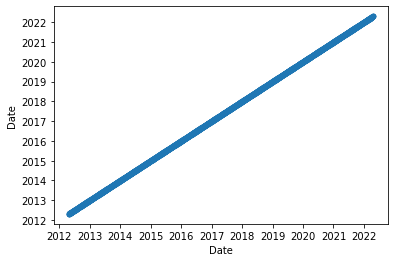

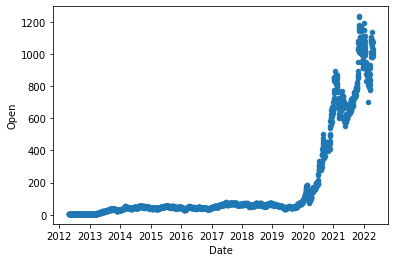

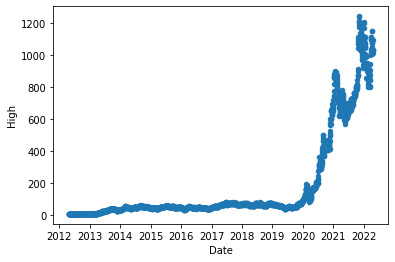

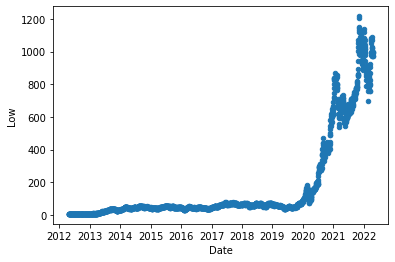

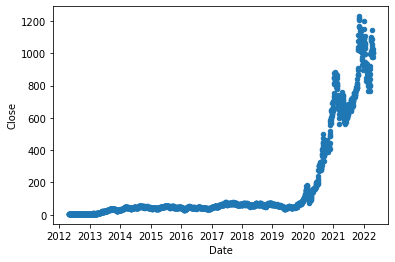

...

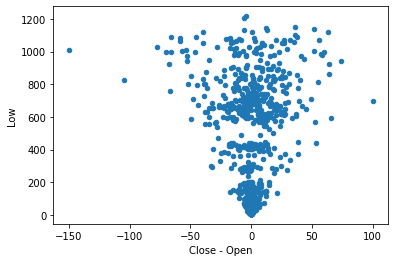

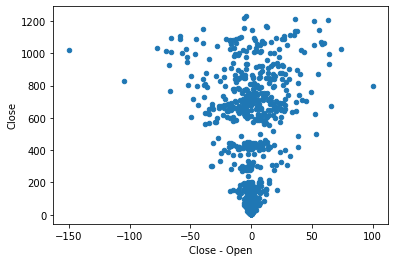

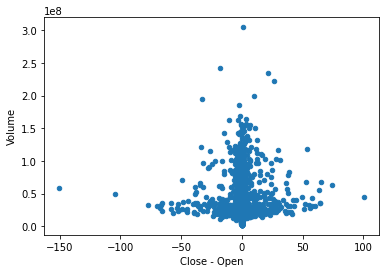

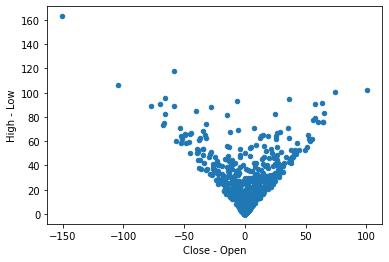

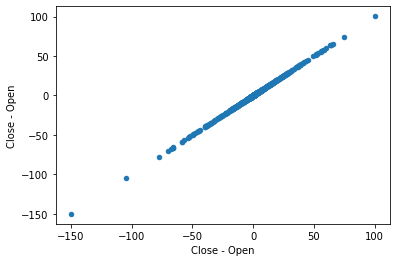

In [ ]:
tslascatterplots = {}
for i in range(len(tsla_hist.columns)):
  for j in range(len(tsla_hist.columns)):
    tslascatterplots[tsla_hist.columns[i]+","+tsla_hist.columns[j]] = tsla_hist.plot.scatter(x=i,y=j)

Open:


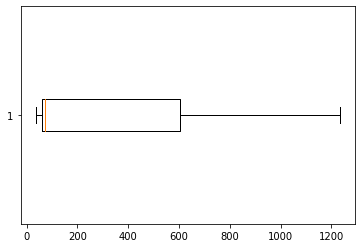

High:


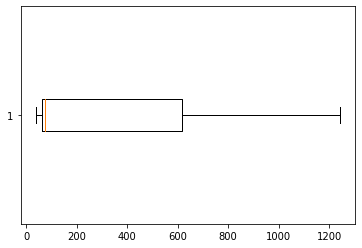

Low:


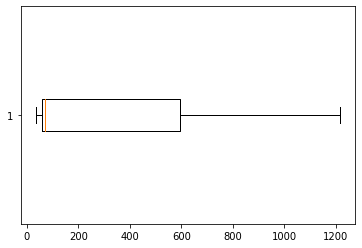

Close:


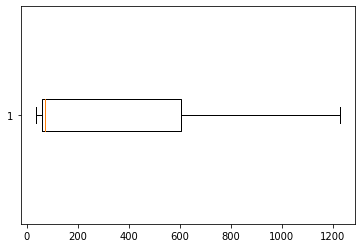

Volume:


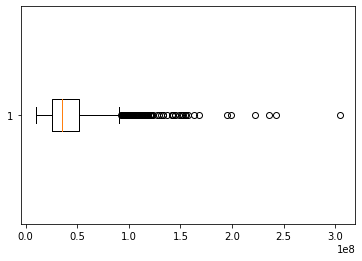

High - Low:


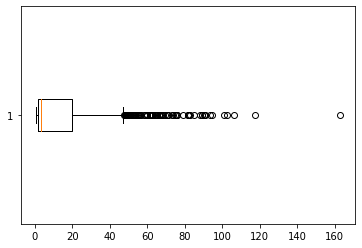

Close - Open:


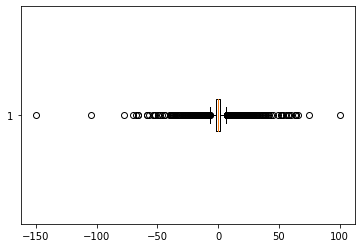

In [ ]:
tslaboxplots = {}
for column in tsla_hist.columns[1:]:
  print(column+":")
  tslaboxplots[column] = plt.boxplot(x=tsla_hist[column], vert=False)
  plt.show()

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f02d97c96d0>,
      dtype=object)

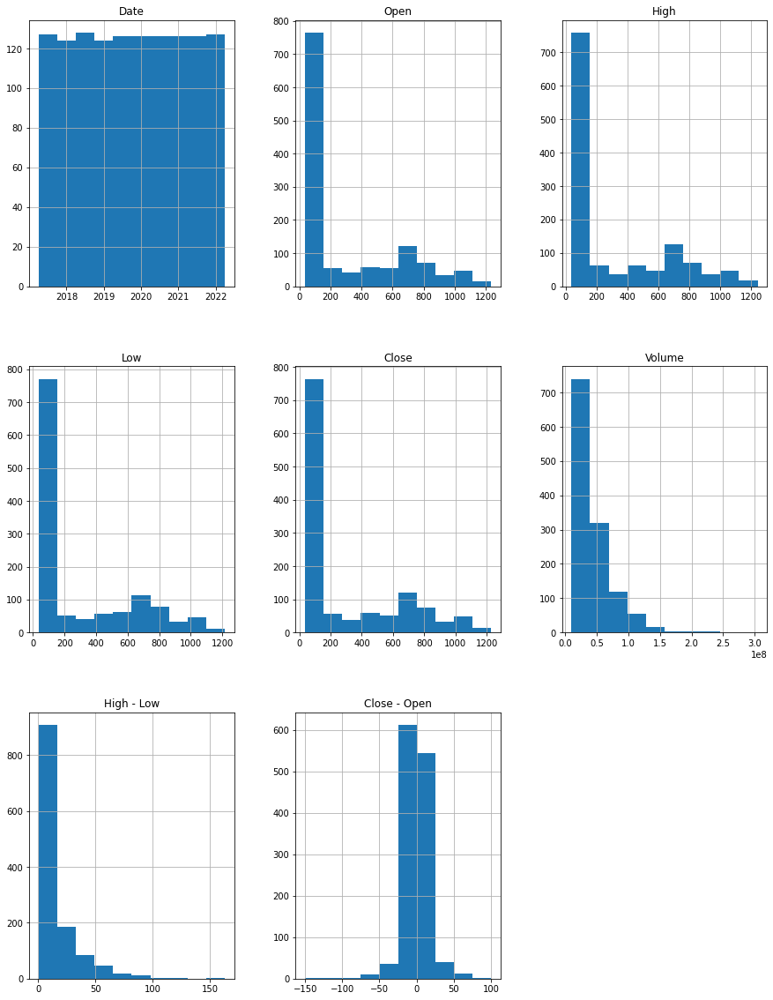

In [ ]:
tsla_hist.hist(figsize=(15,20))

In [ ]:
tsla_hist.corr()

,Open,High,Low,Close,Volume,High - Low,Close - Open
Open,1.000000,0.999631,0.999484,0.998987,-0.239423,0.824330,-0.017350
High,0.999631,1.000000,0.999449,0.999550,-0.233293,0.831395,0.003359
Low,0.999484,0.999449,1.000000,0.999553,-0.245622,0.812499,0.006695
Close,0.998987,0.999550,0.999553,1.000000,-0.238098,0.821748,0.027668
Volume,-0.239423,-0.233293,-0.245622,-0.238098,1.000000,0.014670,0.028204
High - Low,0.824330,0.831395,0.812499,0.821748,0.014670,1.000000,-0.053095
Close - Open,-0.017350,0.003359,0.006695,0.027668,0.028204,-0.053095,1.000000


In [ ]:
tsla_hist.corr(method="spearman")

,Open,High,Low,Close,Volume,High - Low,Close - Open
Open,1.000000,0.998473,0.998406,0.996351,-0.205948,0.839921,-0.007795
High,0.998473,1.000000,0.998298,0.998564,-0.193210,0.849552,0.018167
Low,0.998406,0.998298,1.000000,0.998382,-0.219842,0.828235,0.018880
Close,0.996351,0.998564,0.998382,1.000000,-0.203918,0.839969,0.043664
Volume,-0.205948,-0.193210,-0.219842,-0.203918,1.000000,0.113133,0.028151
High - Low,0.839921,0.849552,0.828235,0.839969,0.113133,1.000000,0.010155
Close - Open,-0.007795,0.018167,0.018880,0.043664,0.028151,0.010155,1.000000


2012:
Open:


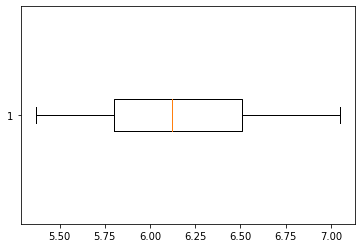

High:


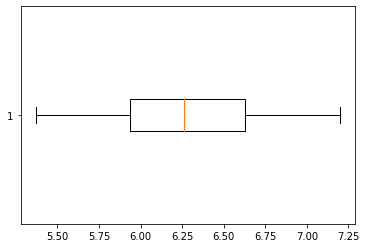

Low:


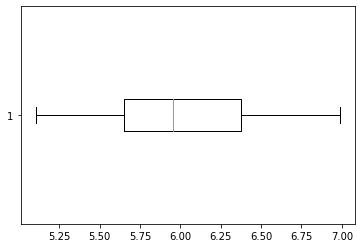

Close:


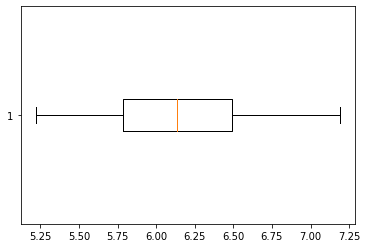

Volume:


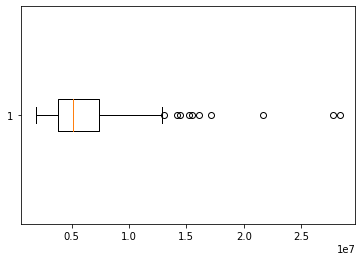

High - Low:


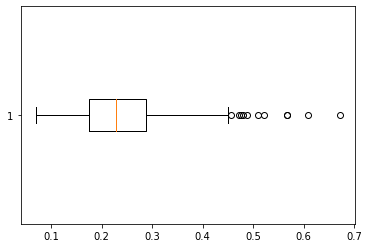

Close - Open:


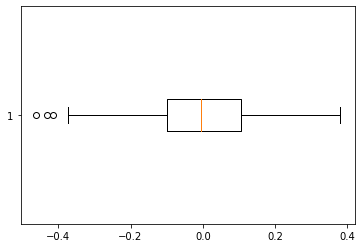

2013:
Open:


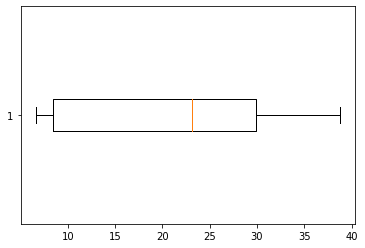

High:


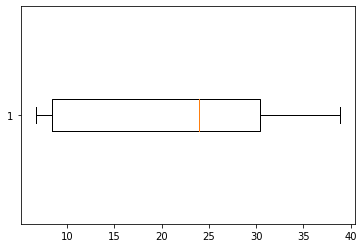

Low:


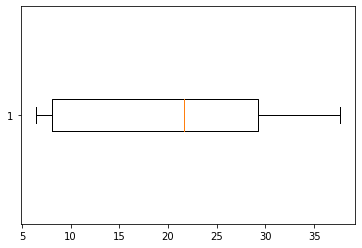

Close:


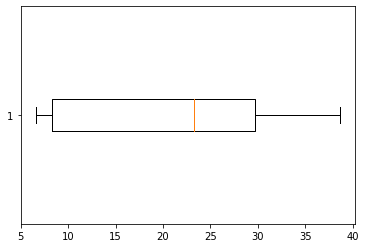

Volume:


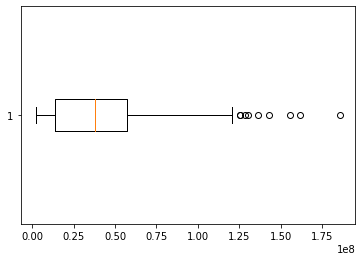

High - Low:


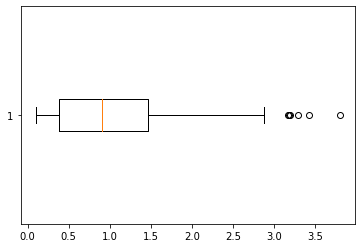

Close - Open:


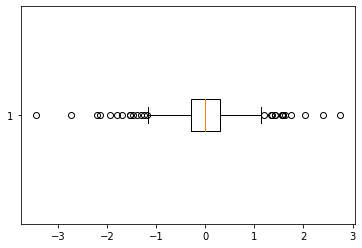

2014:
Open:


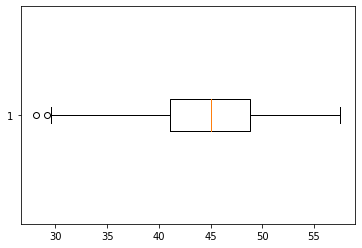

High:


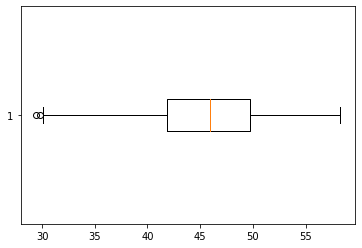

Low:


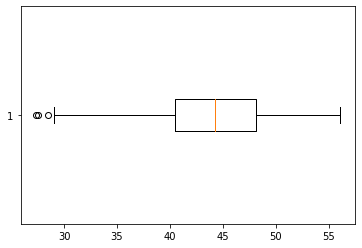

Close:


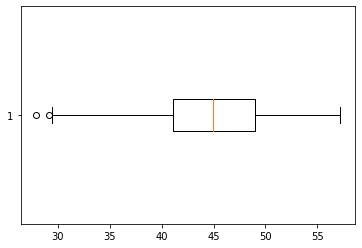

Volume:


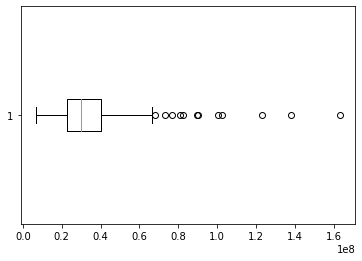

High - Low:


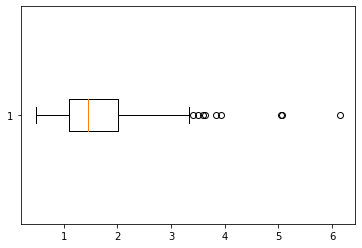

Close - Open:


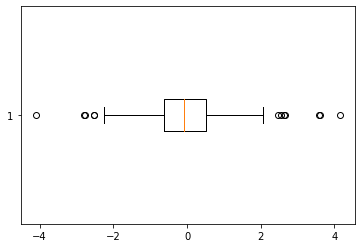

2015:
Open:


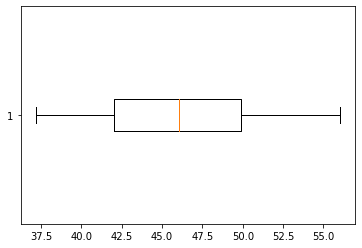

High:


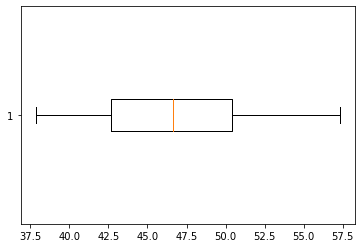

Low:


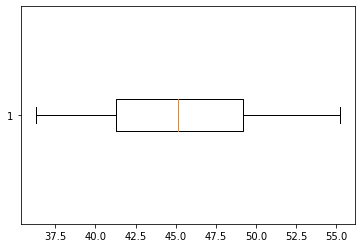

Close:


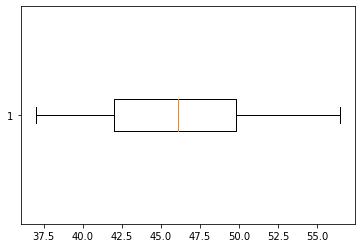

Volume:


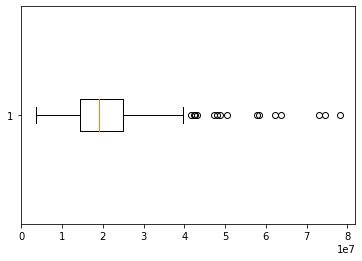

High - Low:


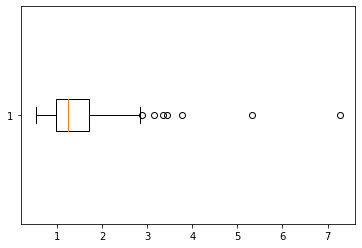

Close - Open:


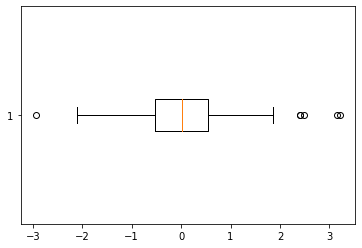

2016:
Open:


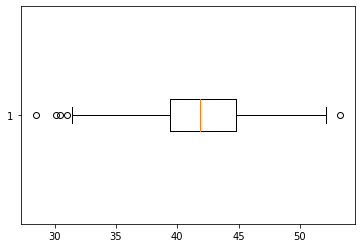

High:


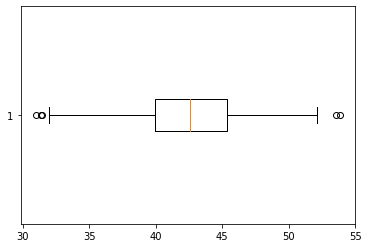

Low:


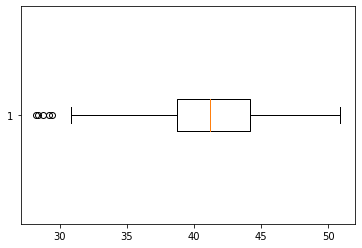

Close:


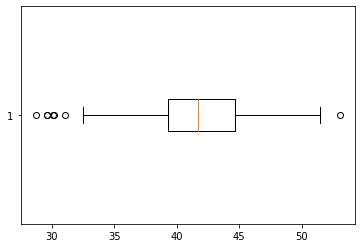

Volume:


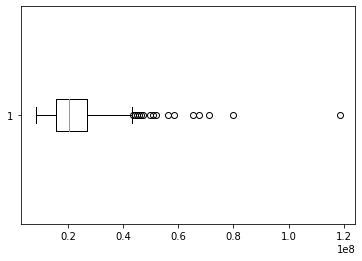

High - Low:


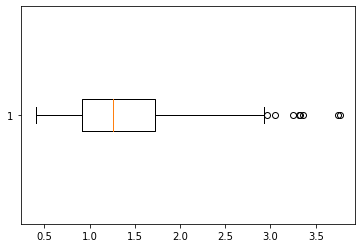

Close - Open:


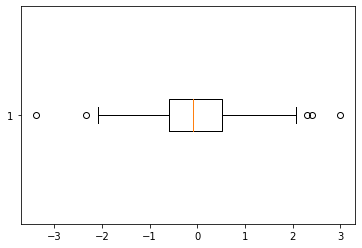

2017:
Open:


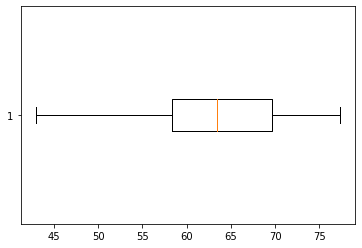

High:


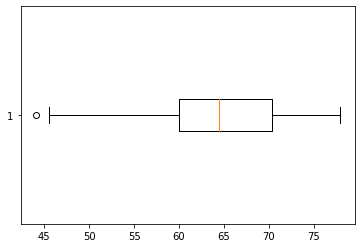

Low:


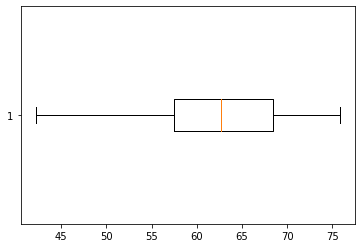

Close:


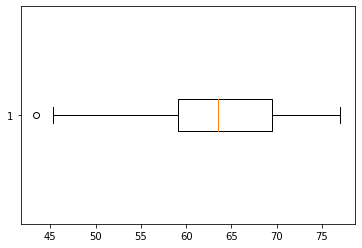

Volume:


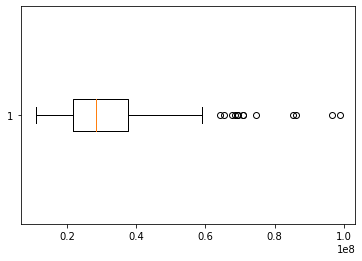

High - Low:


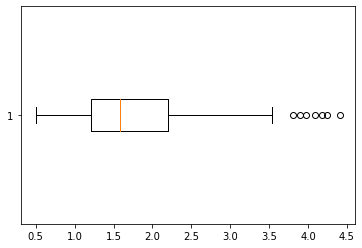

Close - Open:


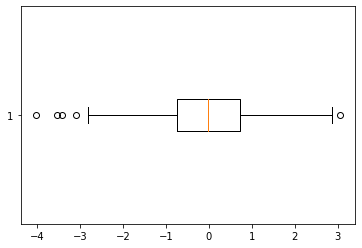

2018:
Open:


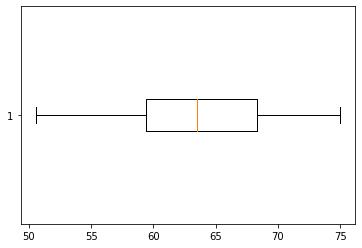

High:


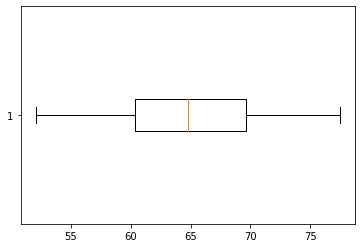

Low:


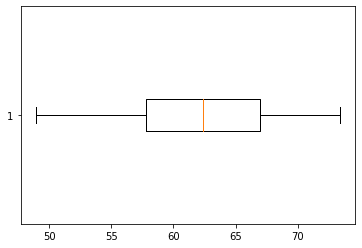

Close:


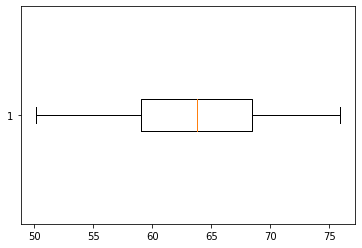

Volume:


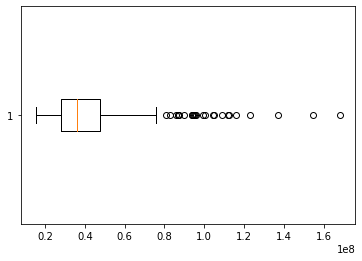

High - Low:


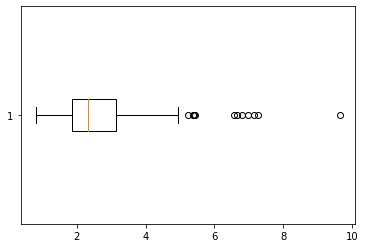

Close - Open:


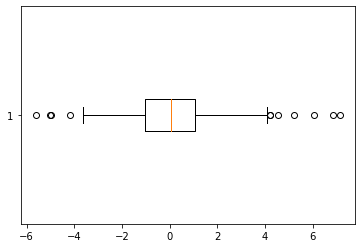

2019:
Open:


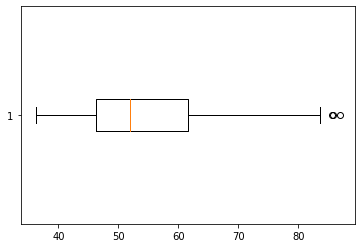

High:


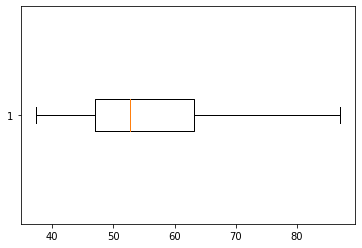

Low:


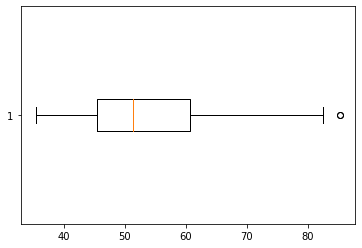

Close:


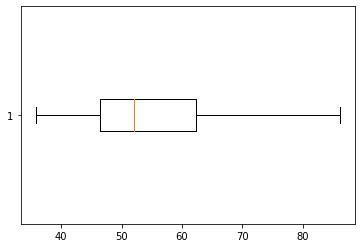

Volume:


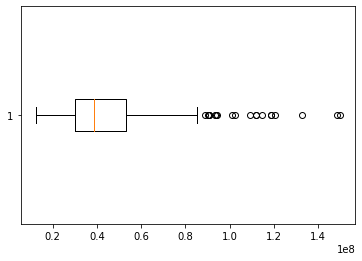

High - Low:


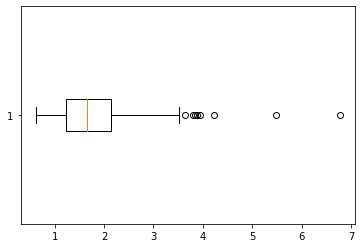

Close - Open:


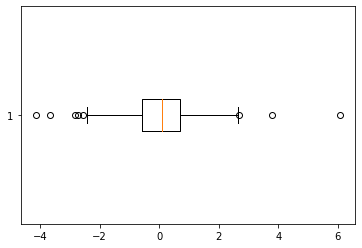

2020:
Open:


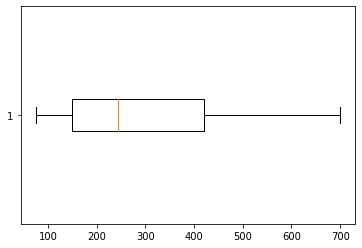

High:


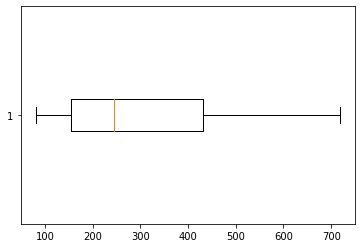

Low:


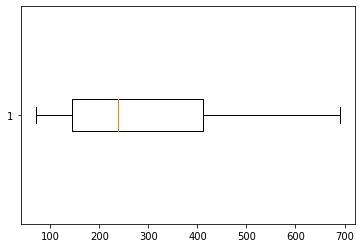

Close:


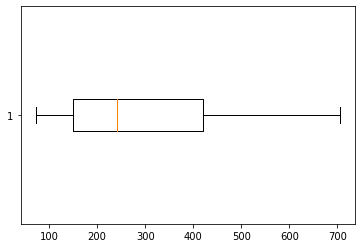

Volume:


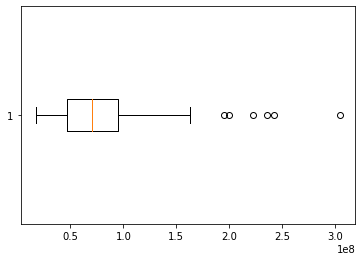

High - Low:


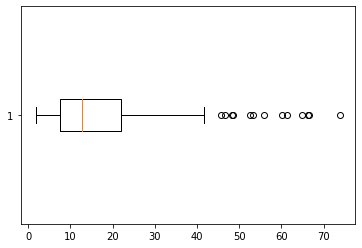

Close - Open:


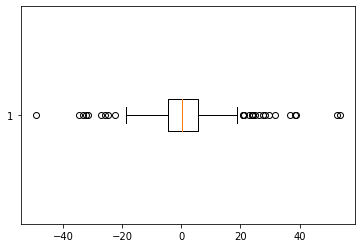

2021:
Open:


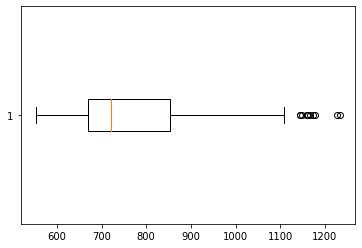

High:


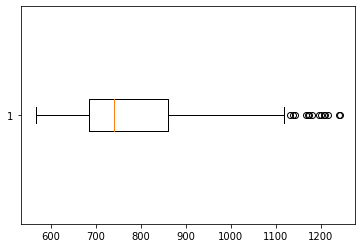

Low:


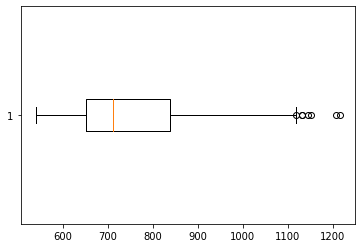

Close:


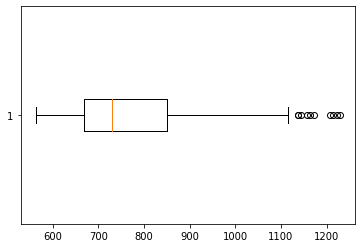

Volume:


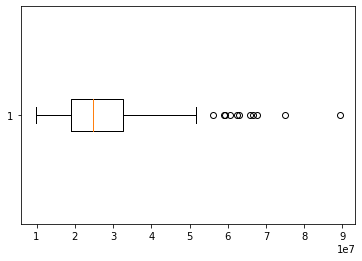

High - Low:


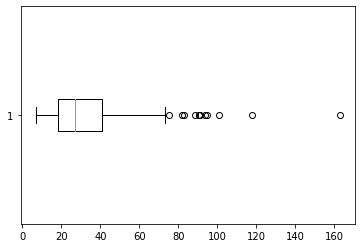

Close - Open:


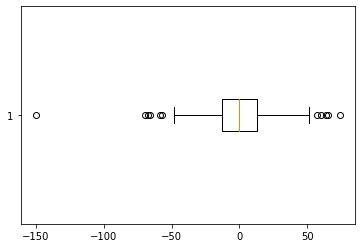

2022:
Open:


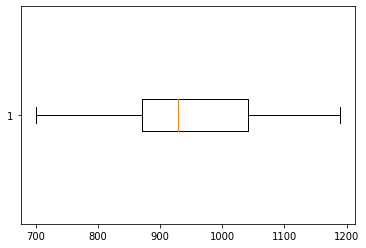

High:


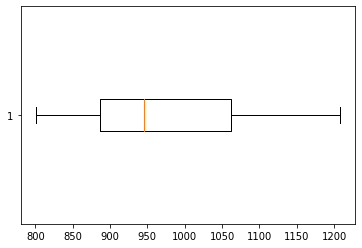

Low:


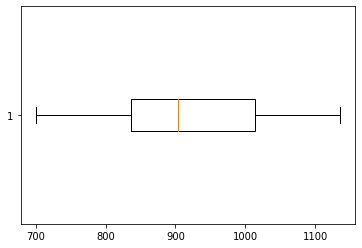

Close:


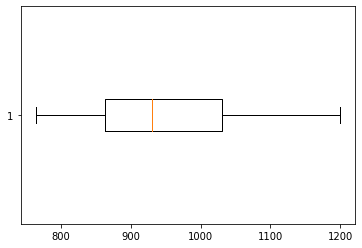

Volume:


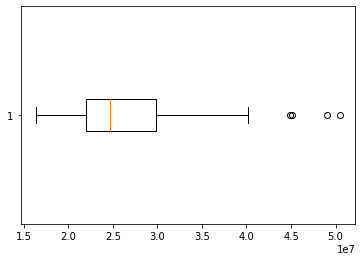

High - Low:


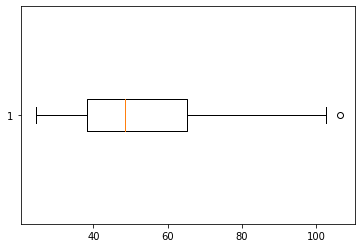

Close - Open:


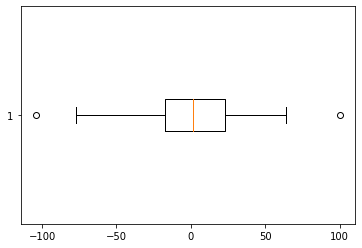

In [ ]:
for tsla_year in tsla_years.values():
  print(str(tsla_year['Date'].max().year)+":")
  for column in tsla_year.columns[1:]:
    print(column+":")
    plt.boxplot(x=tsla_year[column], vert=False)
    plt.show()

#### Analysis (Apple)

/usr/local/lib/python3.7/dist-packages/pandas/plotting/_matplotlib/core.py:345: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


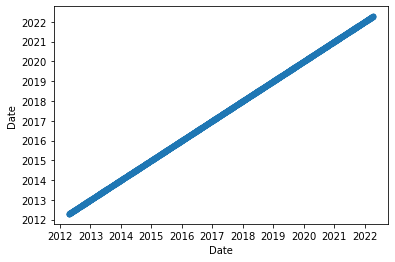

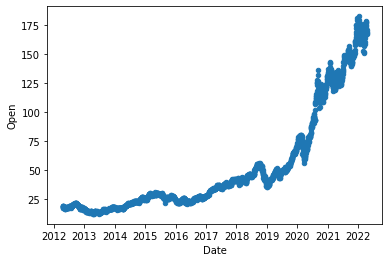

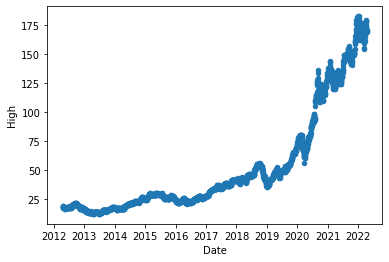

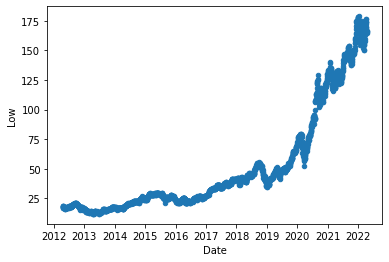

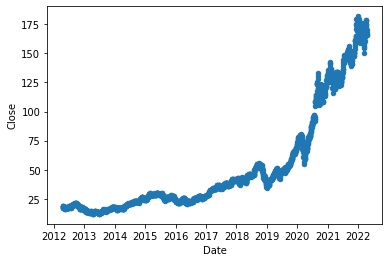

...

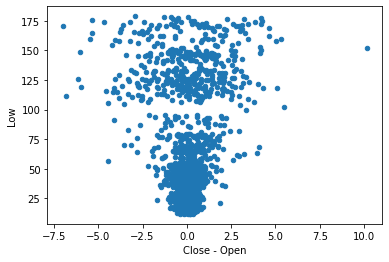

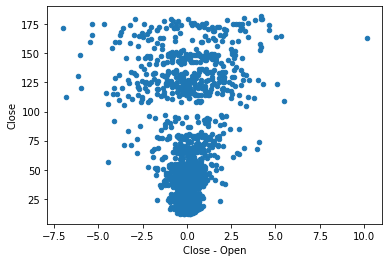

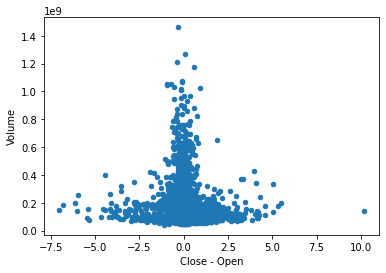

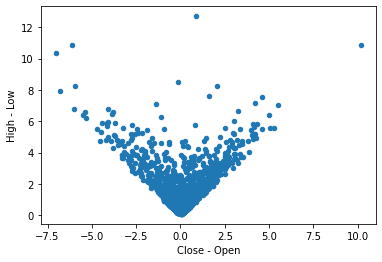

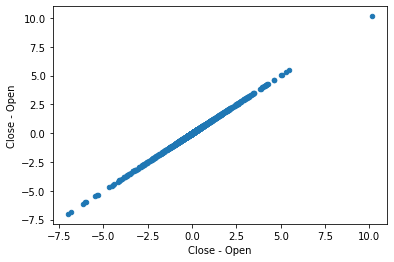

In [ ]:
applescatterplots = {}
for i in range(len(apple_hist.columns)):
  for j in range(len(apple_hist.columns)):
    applescatterplots[apple_hist.columns[i]+","+apple_hist.columns[j]] = apple_hist.plot.scatter(x=i,y=j)

Open:


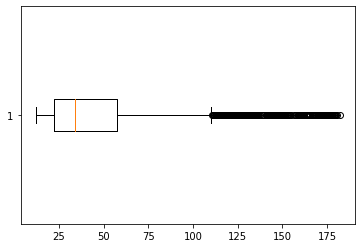

High:


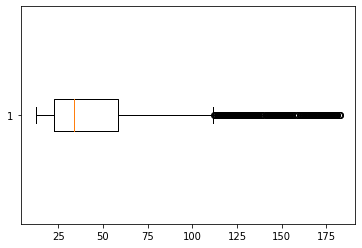

Low:


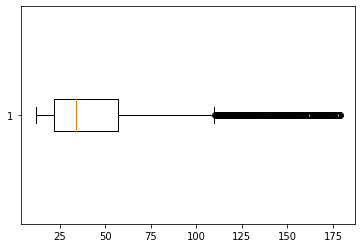

Close:


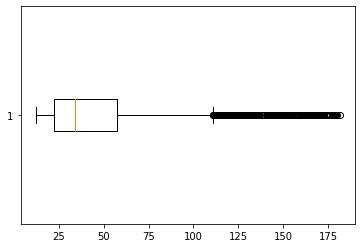

Volume:


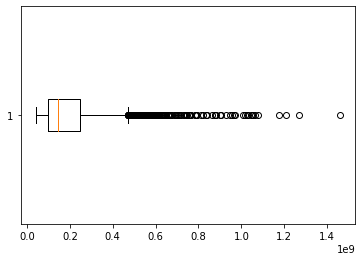

High - Low:


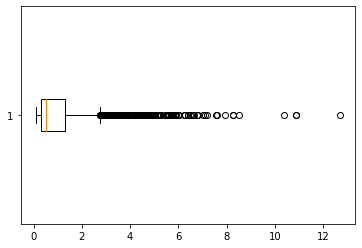

Close - Open:


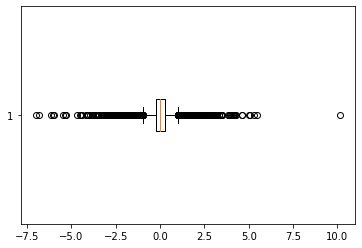

In [ ]:
appleboxplots = {}
for column in apple_hist.columns[1:]:
  print(column+":")
  appleboxplots[column] = plt.boxplot(x=apple_hist[column], vert=False)
  plt.show()

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fa950d93710>,
      dtype=object)

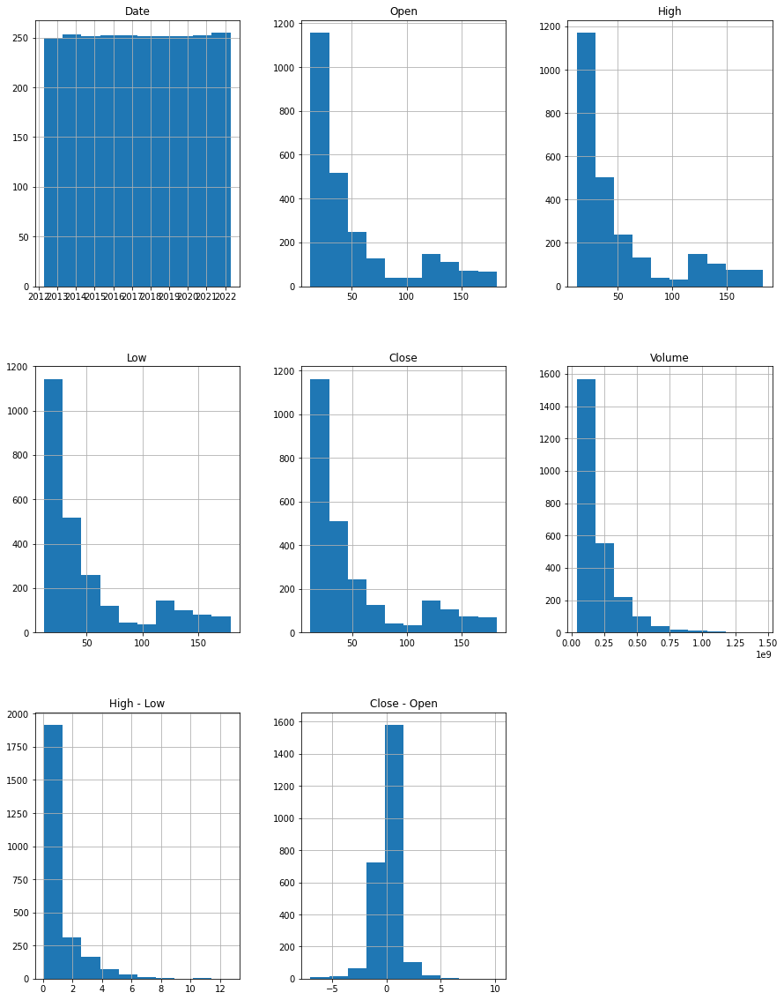

In [ ]:
apple_hist.hist(figsize=(15,20))

In [ ]:
apple_hist.corr()

,Open,High,Low,Close,Volume,High - Low,Close - Open
Open,1.000000,0.999894,0.999862,0.999727,-0.423301,0.796033,0.022611
High,0.999894,1.000000,0.999832,0.999865,-0.421453,0.800569,0.033082
Low,0.999862,0.999832,1.000000,0.999864,-0.426094,0.789449,0.034385
Close,0.999727,0.999865,0.999864,1.000000,-0.423964,0.795014,0.045979
Volume,-0.423301,-0.421453,-0.426094,-0.423964,1.000000,-0.183411,-0.042878
High - Low,0.796033,0.800569,0.789449,0.795014,-0.183411,1.000000,-0.016273
Close - Open,0.022611,0.033082,0.034385,0.045979,-0.042878,-0.016273,1.000000


In [ ]:
apple_hist.corr(method="spearman")

,Open,High,Low,Close,Volume,High - Low,Close - Open
Open,1.000000,0.999845,0.999800,0.999625,-0.699709,0.798201,0.056282
High,0.999845,1.000000,0.999770,0.999820,-0.696862,0.802187,0.065757
Low,0.999800,0.999770,1.000000,0.999828,-0.704628,0.792634,0.067101
Close,0.999625,0.999820,0.999828,1.000000,-0.701109,0.797228,0.076920
Volume,-0.699709,-0.696862,-0.704628,-0.701109,1.000000,-0.275458,-0.085784
High - Low,0.798201,0.802187,0.792634,0.797228,-0.275458,1.000000,0.032242
Close - Open,0.056282,0.065757,0.067101,0.076920,-0.085784,0.032242,1.000000


2012:
Open:


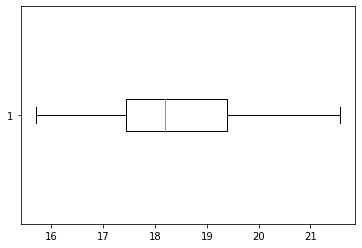

High:


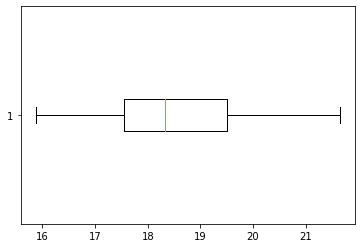

Low:


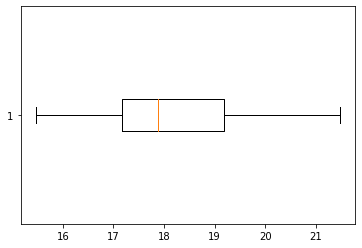

Close:


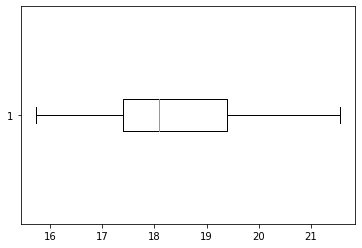

Volume:


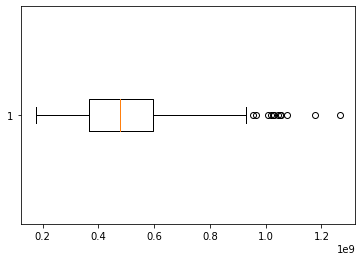

High - Low:


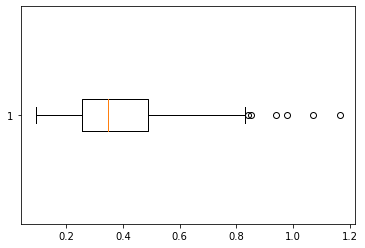

Close - Open:


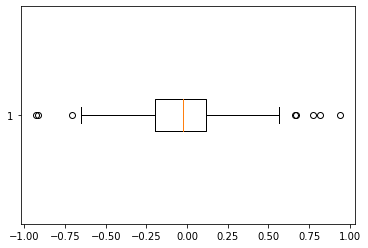

2013:
Open:


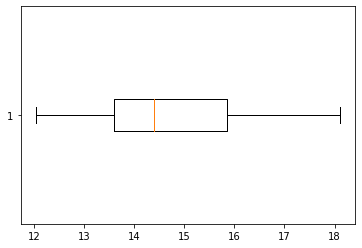

High:


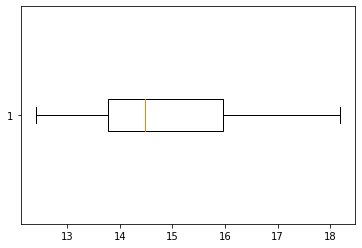

Low:


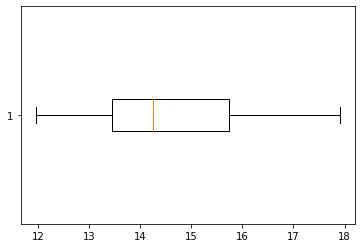

Close:


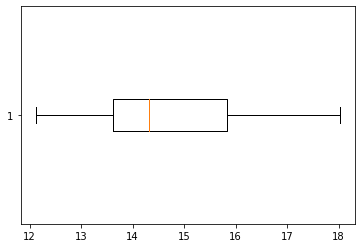

Volume:


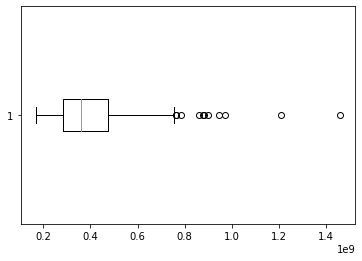

High - Low:


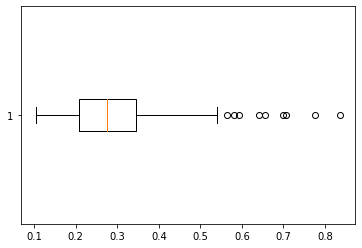

Close - Open:


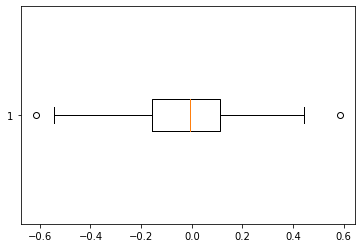

2014:
Open:


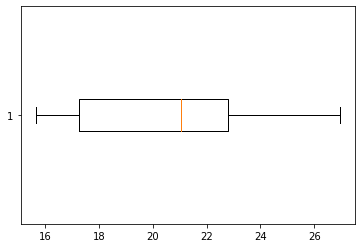

High:


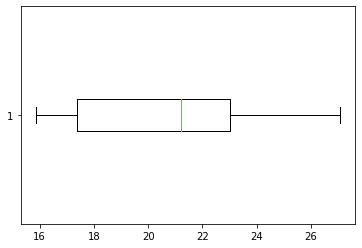

Low:


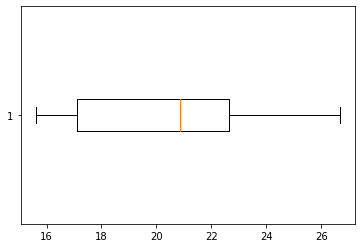

Close:


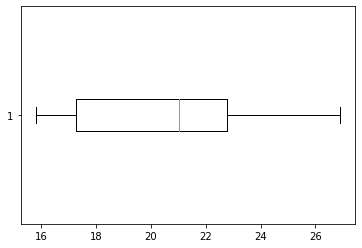

Volume:


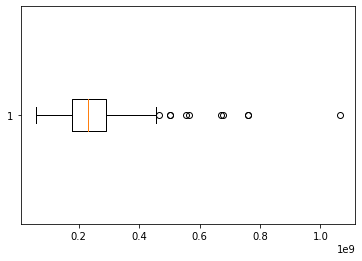

High - Low:


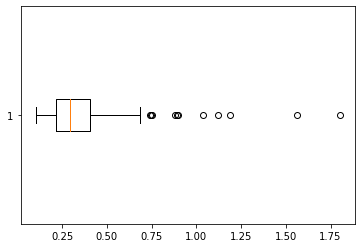

Close - Open:


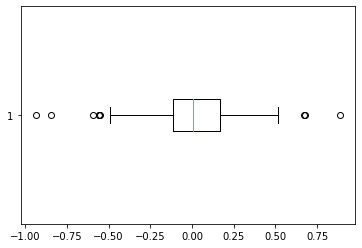

2015:
Open:


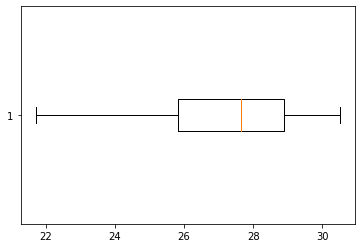

High:


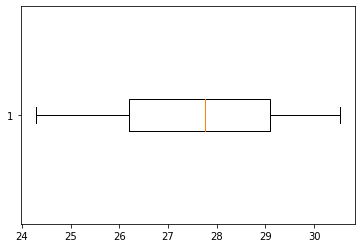

Low:


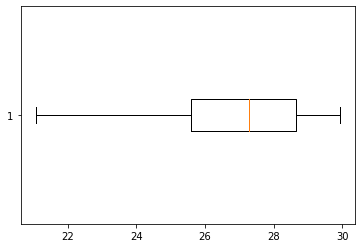

Close:


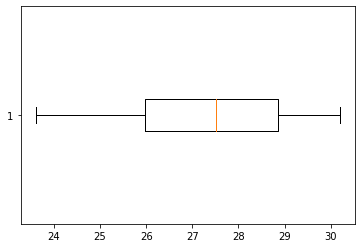

Volume:


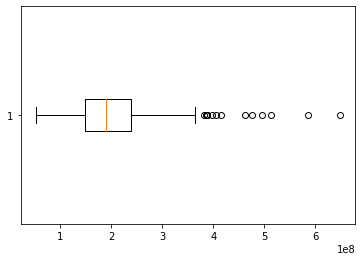

High - Low:


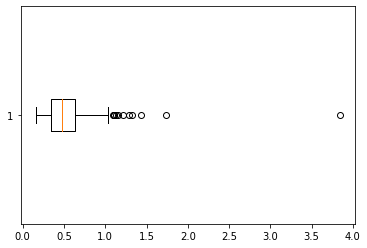

Close - Open:


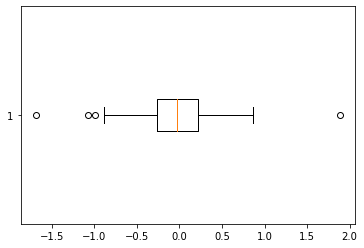

2016:
Open:


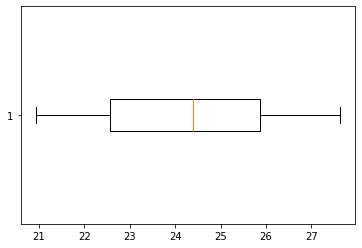

High:


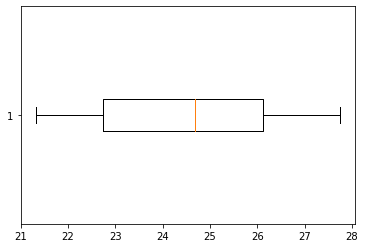

Low:


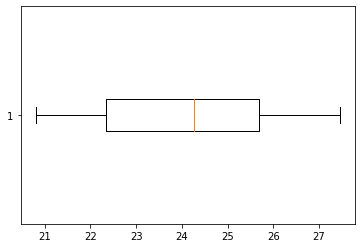

Close:


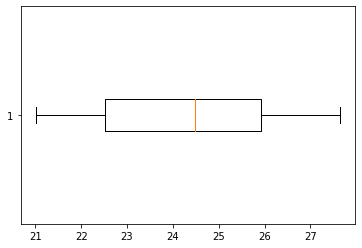

Volume:


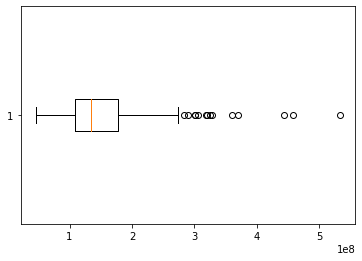

High - Low:


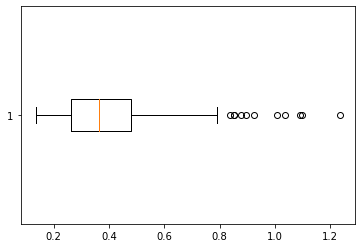

Close - Open:


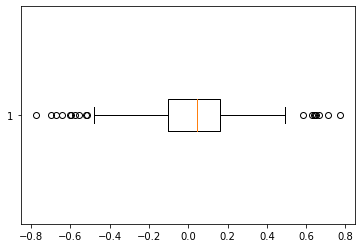

2017:
Open:


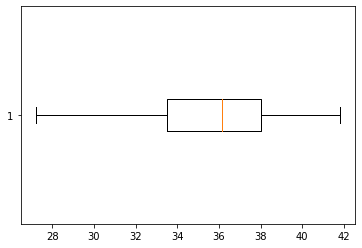

High:


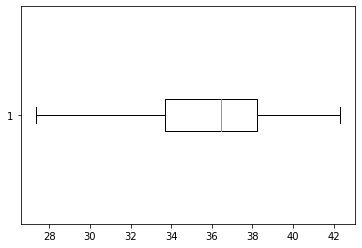

Low:


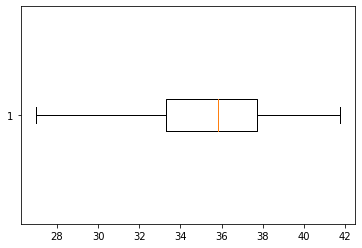

Close:


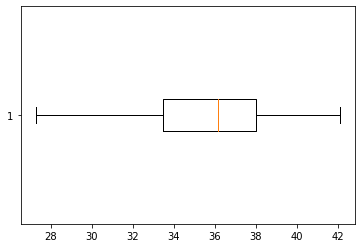

Volume:


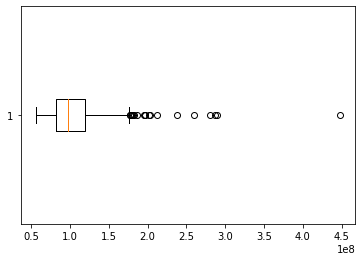

High - Low:


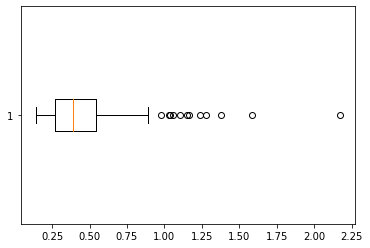

Close - Open:


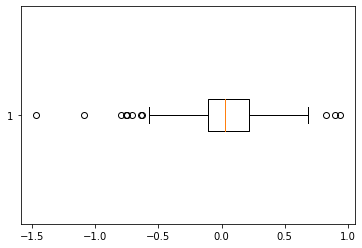

2018:
Open:


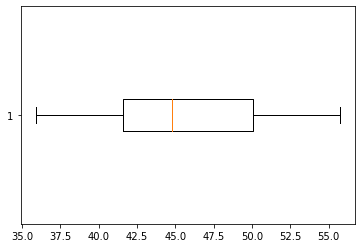

High:


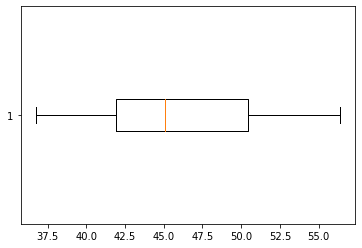

Low:


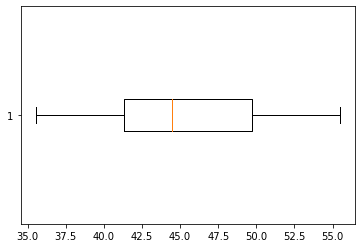

Close:


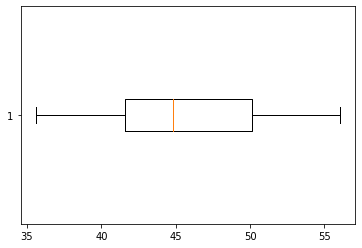

Volume:


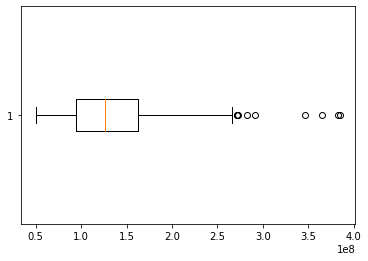

High - Low:


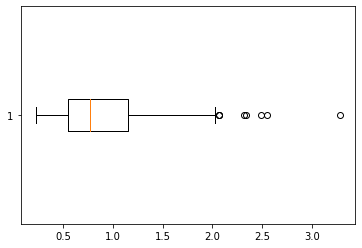

Close - Open:


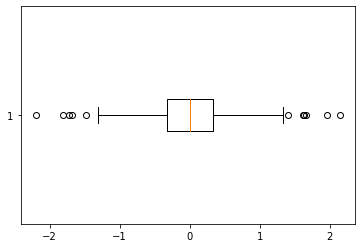

2019:
Open:


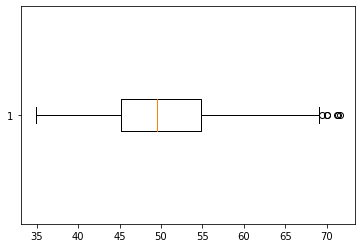

High:


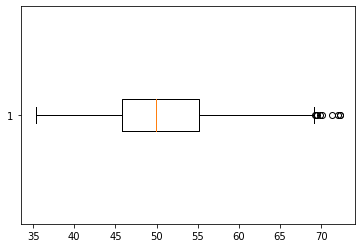

Low:


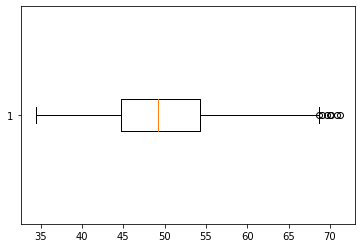

Close:


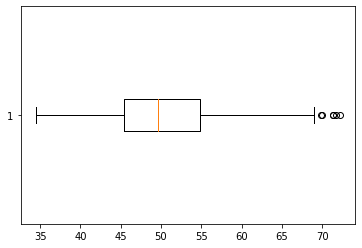

Volume:


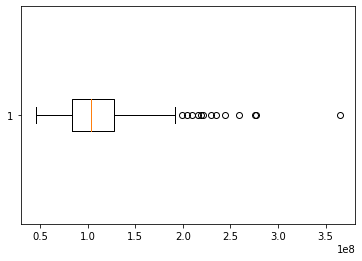

High - Low:


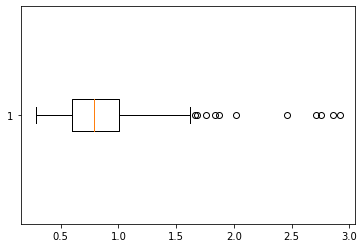

Close - Open:


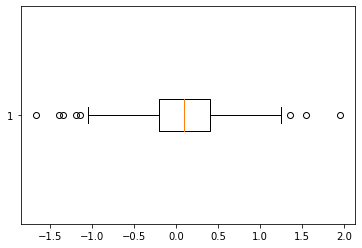

2020:
Open:


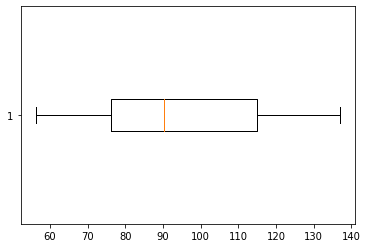

High:


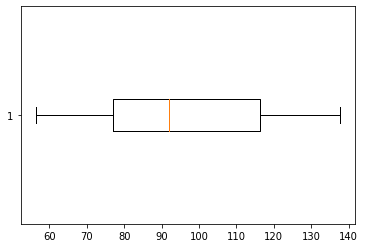

Low:


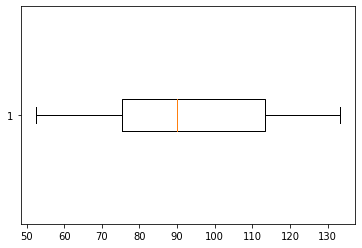

Close:


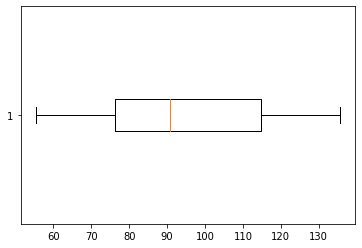

Volume:


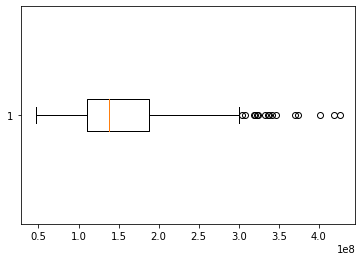

High - Low:


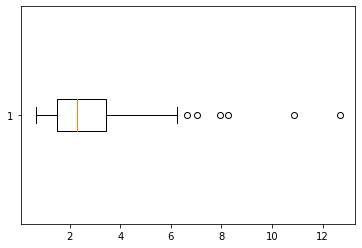

Close - Open:


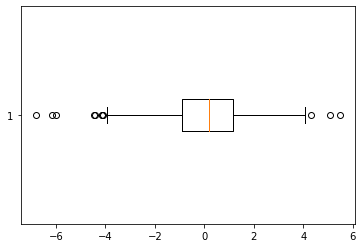

2021:
Open:


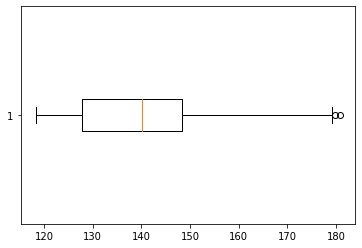

High:


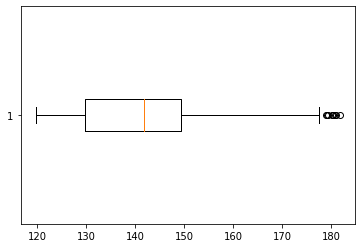

Low:


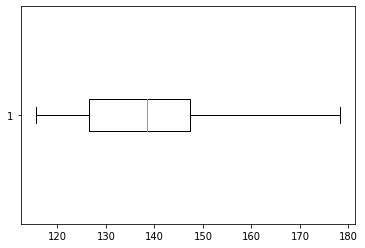

Close:


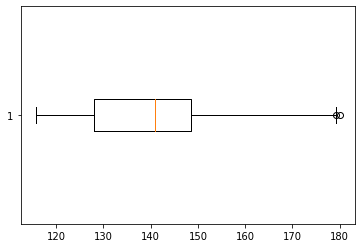

Volume:


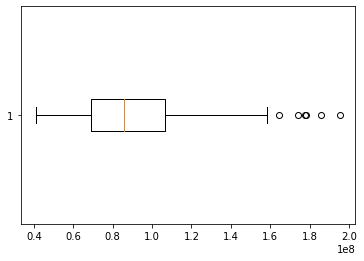

High - Low:


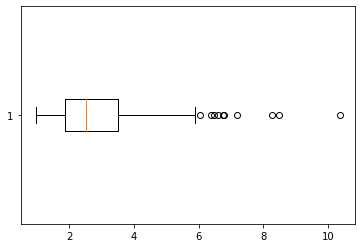

Close - Open:


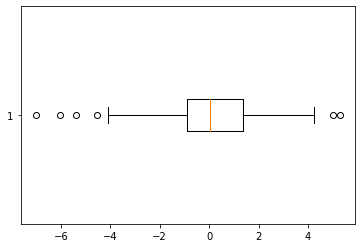

2022:
Open:


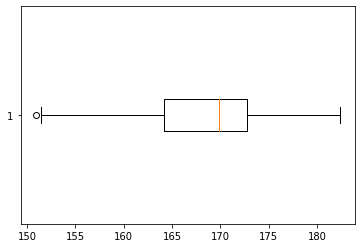

High:


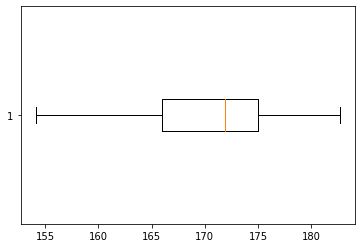

Low:


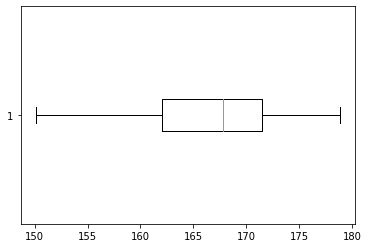

Close:


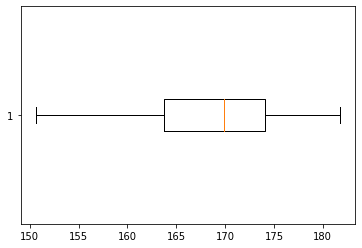

Volume:


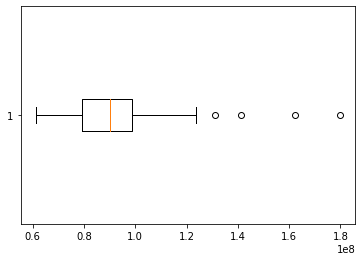

High - Low:


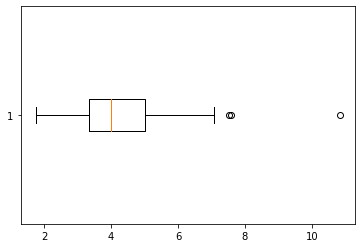

Close - Open:


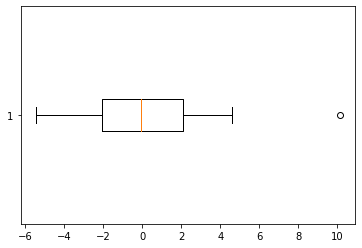

In [ ]:
for apple_year in apple_years.values():
  print(str(apple_year['Date'].max().year)+":")
  for column in apple_year.columns[1:]:
    print(column+":")
    plt.boxplot(x=apple_year[column], vert=False)
    plt.show()

#### Analysis (Microsoft)

/usr/local/lib/python3.7/dist-packages/pandas/plotting/_matplotlib/core.py:345: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


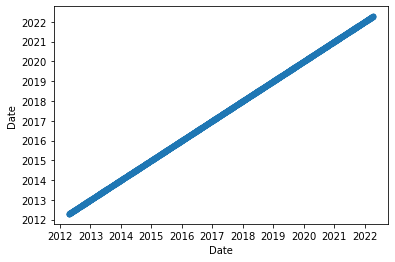

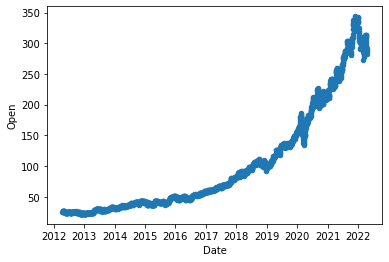

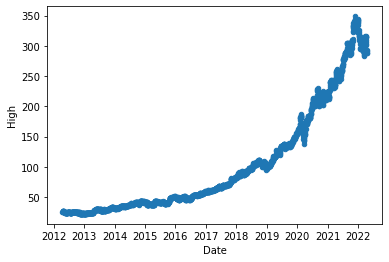

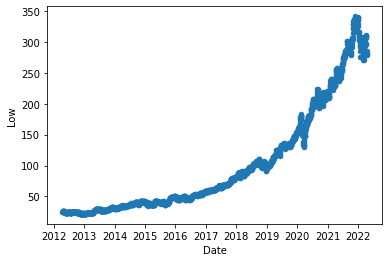

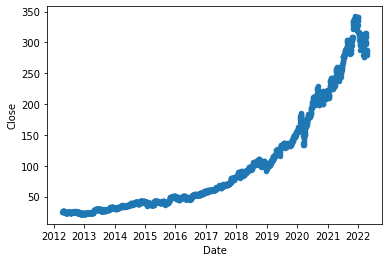

...

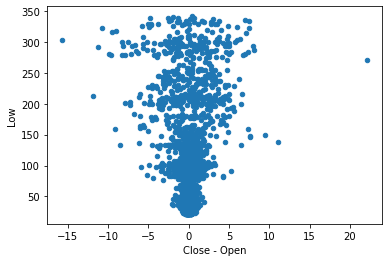

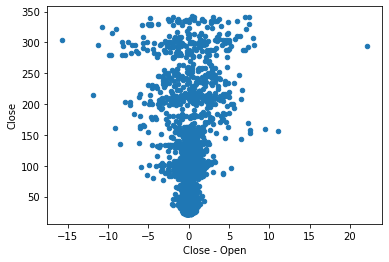

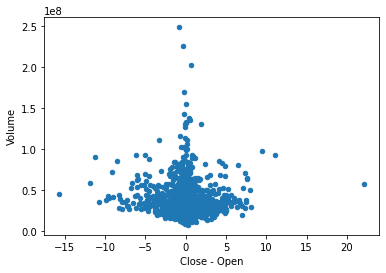

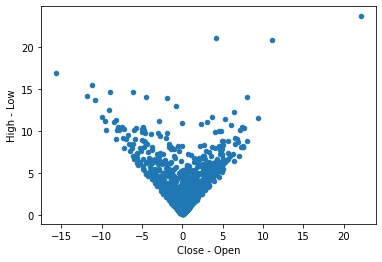

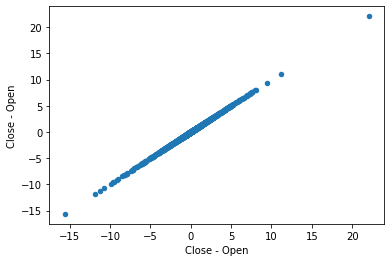

In [ ]:
msftscatterplots = {}
for i in range(len(msft_hist.columns)):
  for j in range(len(msft_hist.columns)):
    msftscatterplots[msft_hist.columns[i]+","+msft_hist.columns[j]] = msft_hist.plot.scatter(x=i,y=j)

Open:


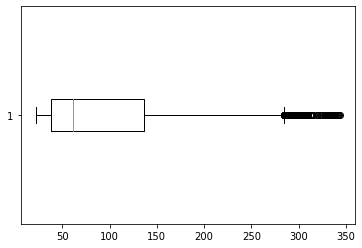

High:


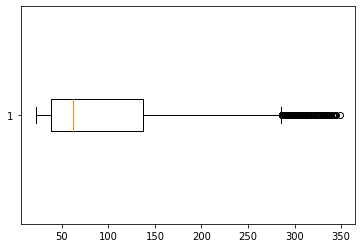

Low:


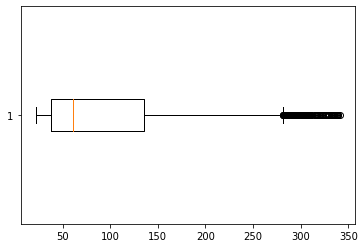

Close:


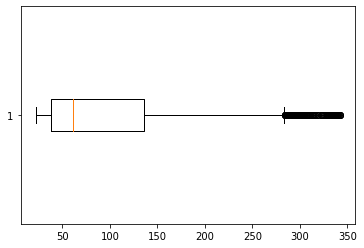

Volume:


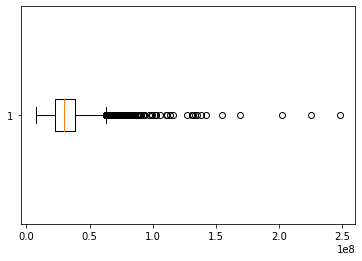

High - Low:


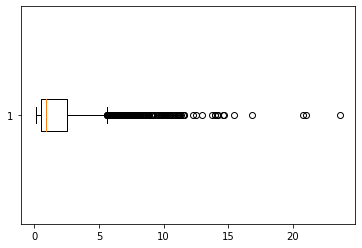

Close - Open:


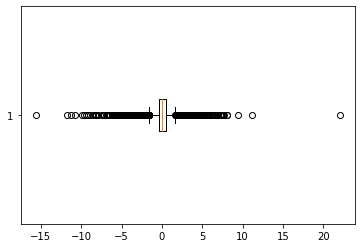

In [ ]:
msftboxplots = {}
for column in msft_hist.columns[1:]:
  print(column+":")
  msftboxplots[column] = plt.boxplot(x=msft_hist[column], vert=False)
  plt.show()

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fa94eaeb5d0>,
      dtype=object)

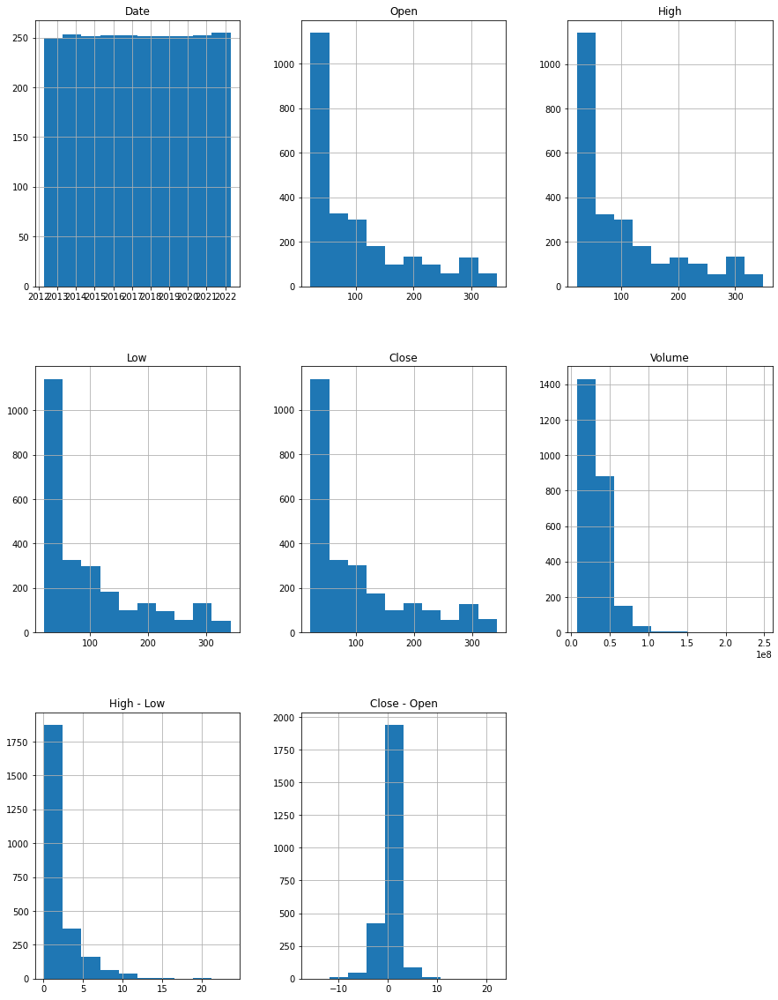

In [ ]:
msft_hist.hist(figsize=(15,20))

In [ ]:
msft_hist.corr()

,Open,High,Low,Close,Volume,High - Low,Close - Open
Open,1.000000,0.999901,0.999882,0.999771,-0.185007,0.757732,-0.008142
High,0.999901,1.000000,0.999836,0.999877,-0.181528,0.762949,0.001417
Low,0.999882,0.999836,1.000000,0.999885,-0.189551,0.751129,0.002731
Close,0.999771,0.999877,0.999885,1.000000,-0.186022,0.756708,0.013282
Volume,-0.185007,-0.181528,-0.189551,-0.186022,1.000000,0.149268,-0.047856
High - Low,0.757732,0.762949,0.751129,0.756708,0.149268,1.000000,-0.045853
Close - Open,-0.008142,0.001417,0.002731,0.013282,-0.047856,-0.045853,1.000000


In [ ]:
msft_hist.corr(method="spearman")

,Open,High,Low,Close,Volume,High - Low,Close - Open
Open,1.000000,0.999894,0.999874,0.999754,-0.345579,0.865023,0.031090
High,0.999894,1.000000,0.999864,0.999878,-0.342640,0.867742,0.039223
Low,0.999874,0.999864,1.000000,0.999895,-0.350252,0.861872,0.040142
Close,0.999754,0.999878,0.999895,1.000000,-0.347100,0.864677,0.048248
Volume,-0.345579,-0.342640,-0.350252,-0.347100,1.000000,0.006165,-0.076495
High - Low,0.865023,0.867742,0.861872,0.864677,0.006165,1.000000,0.031360
Close - Open,0.031090,0.039223,0.040142,0.048248,-0.076495,0.031360,1.000000


2012:
Open:


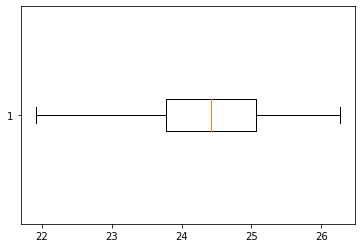

High:


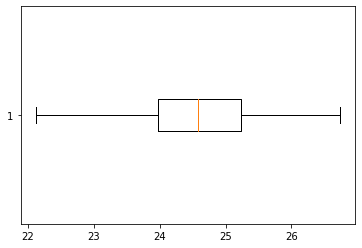

Low:


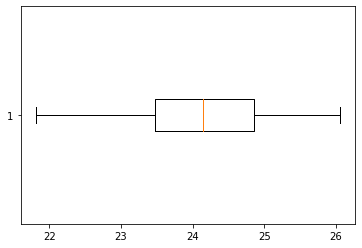

Close:


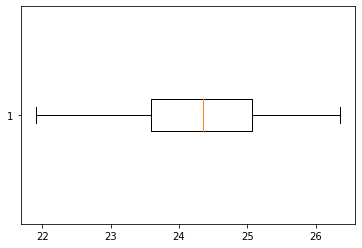

Volume:


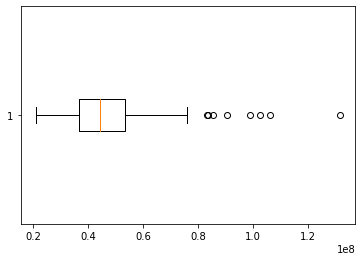

High - Low:


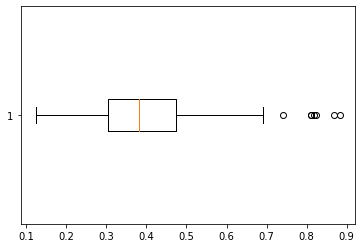

Close - Open:


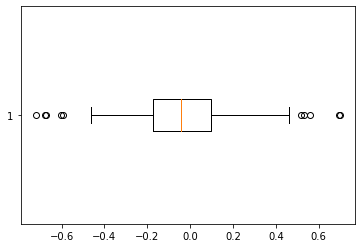

2013:
Open:


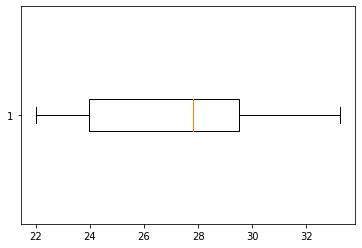

High:


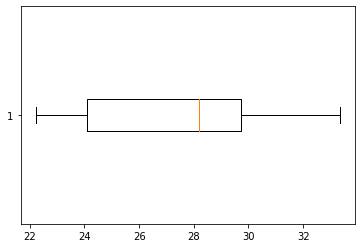

Low:


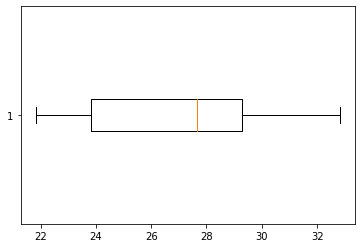

Close:


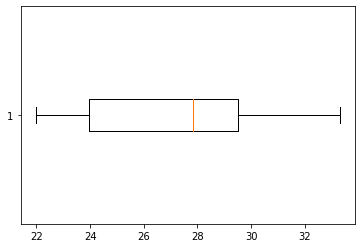

Volume:


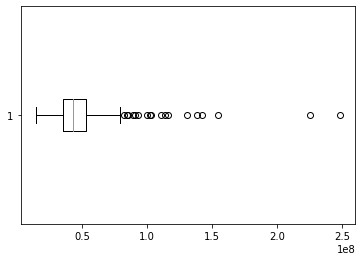

High - Low:


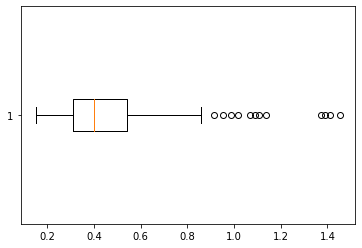

Close - Open:


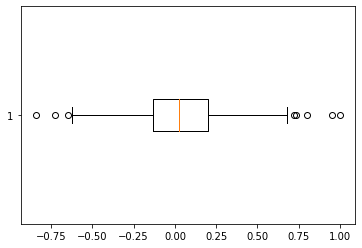

2014:
Open:


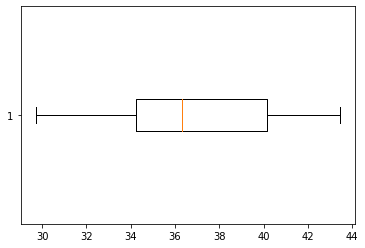

High:


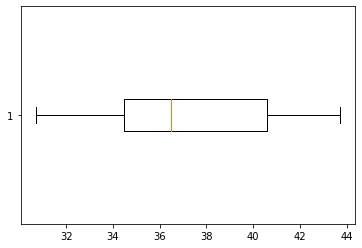

Low:


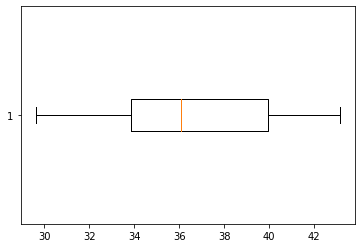

Close:


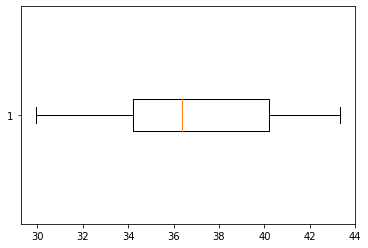

Volume:


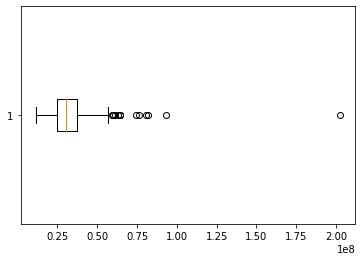

High - Low:


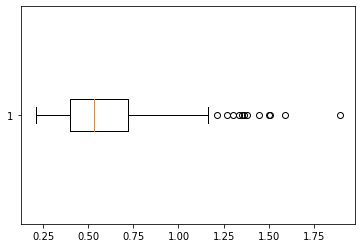

Close - Open:


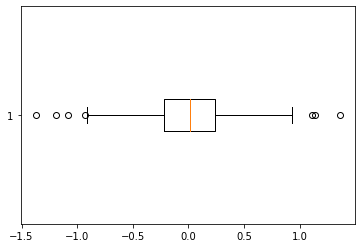

2015:
Open:


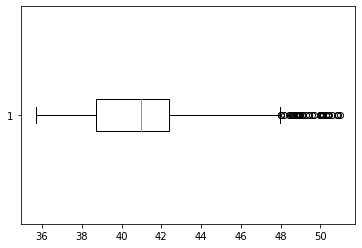

High:


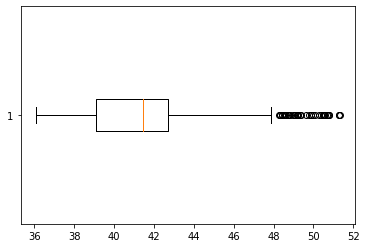

Low:


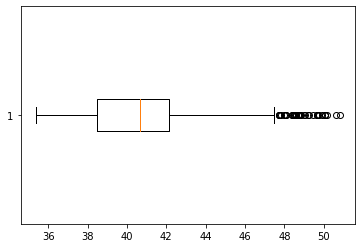

Close:


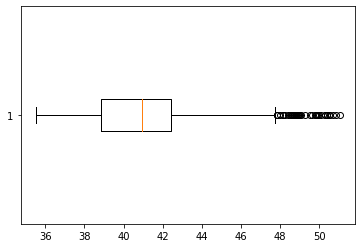

Volume:


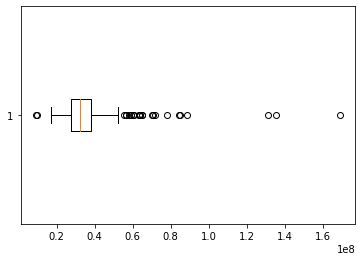

High - Low:


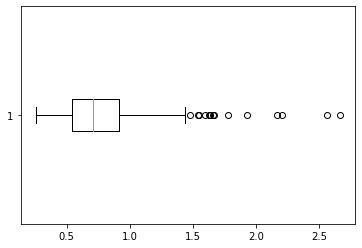

Close - Open:


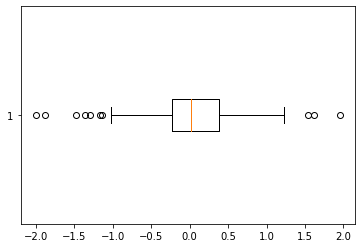

2016:
Open:


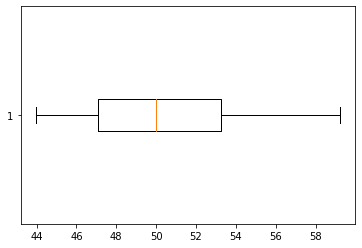

High:


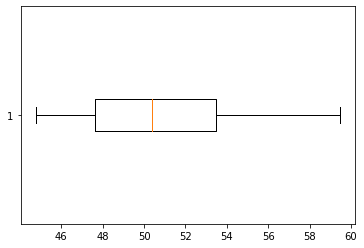

Low:


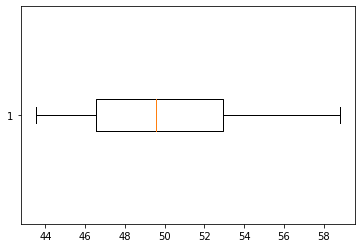

Close:


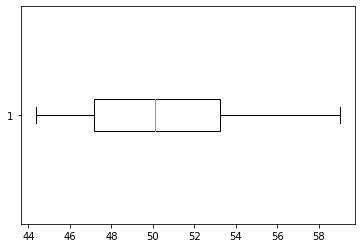

Volume:


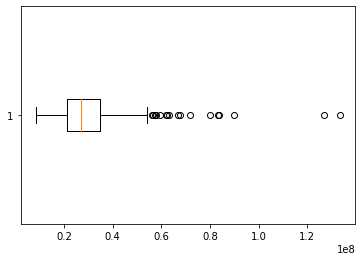

High - Low:


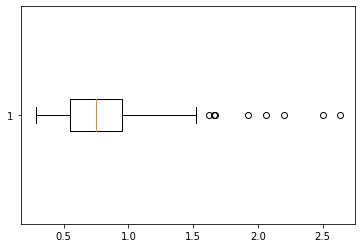

Close - Open:


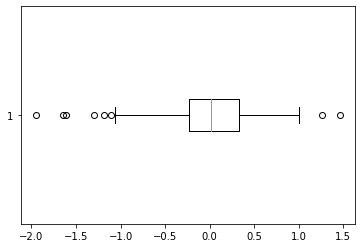

2017:
Open:


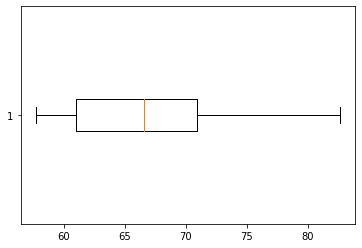

High:


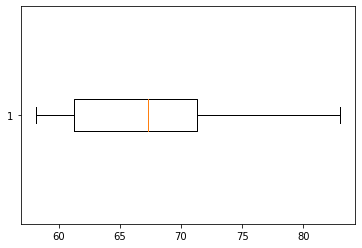

Low:


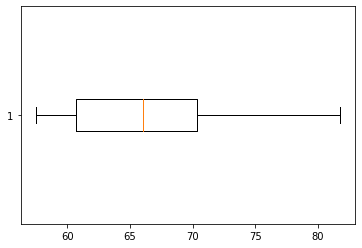

Close:


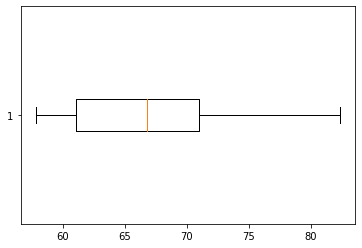

Volume:


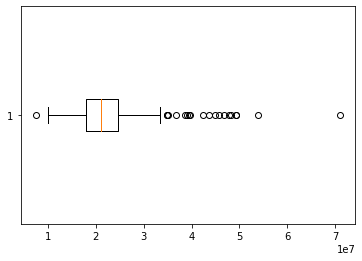

High - Low:


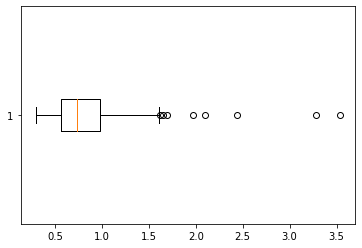

Close - Open:


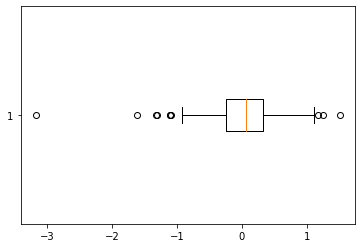

2018:
Open:


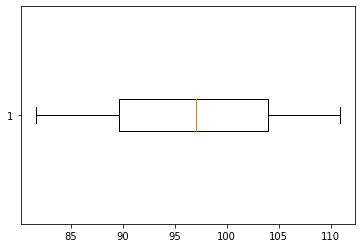

High:


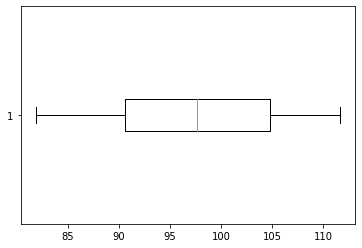

Low:


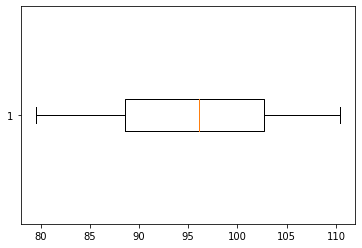

Close:


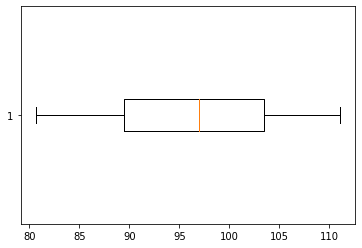

Volume:


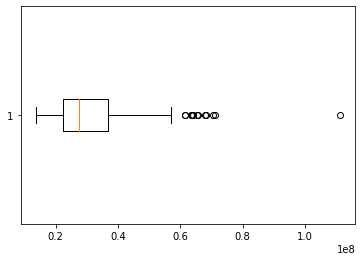

High - Low:


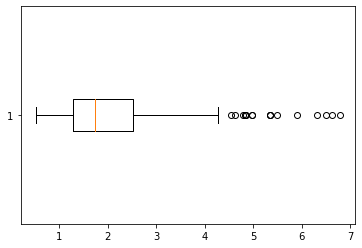

Close - Open:


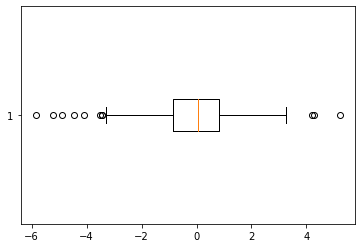

2019:
Open:


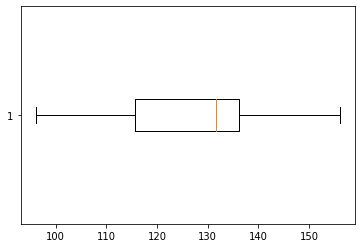

High:


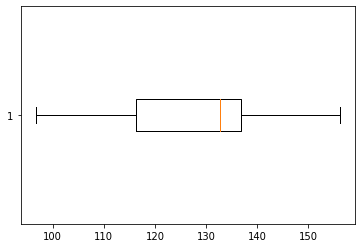

Low:


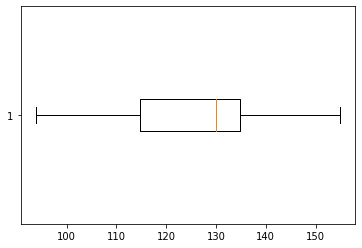

Close:


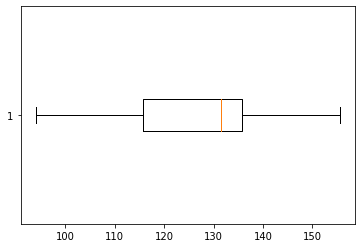

Volume:


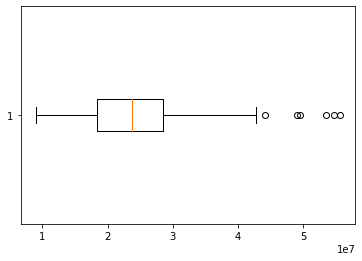

High - Low:


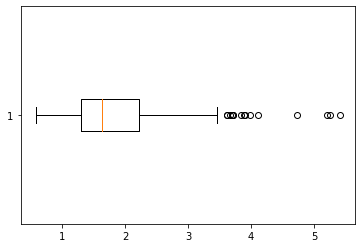

Close - Open:


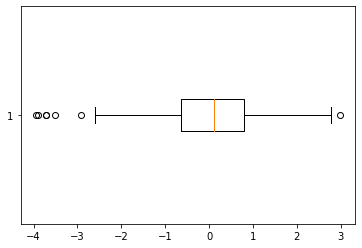

2020:
Open:


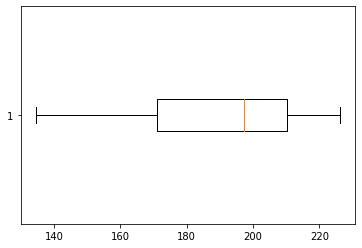

High:


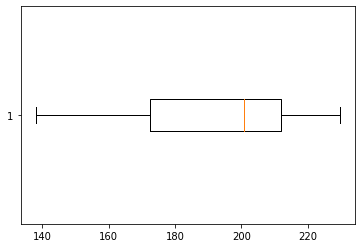

Low:


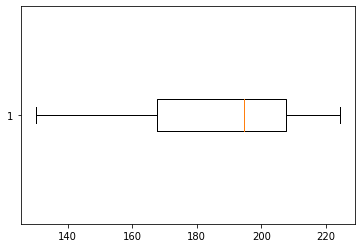

Close:


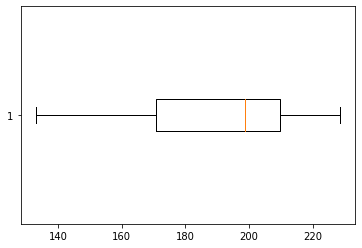

Volume:


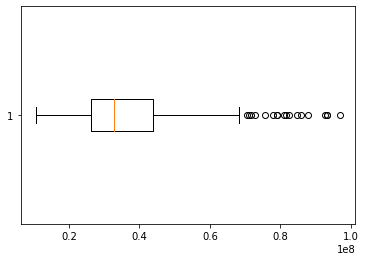

High - Low:


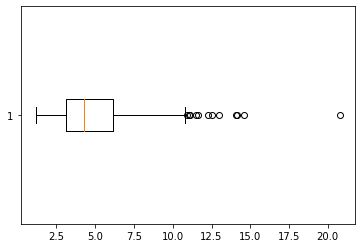

Close - Open:


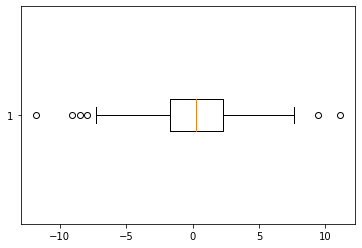

2021:
Open:


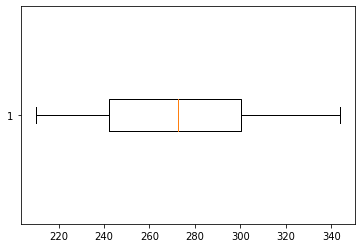

High:


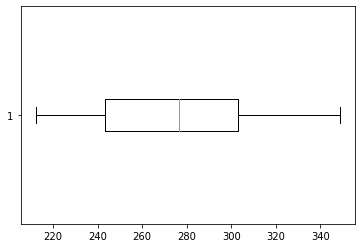

Low:


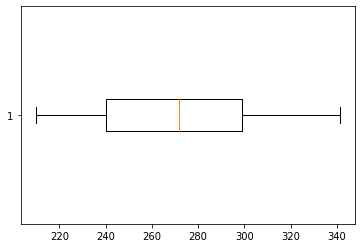

Close:


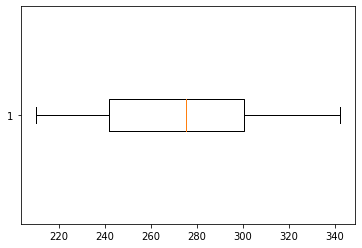

Volume:


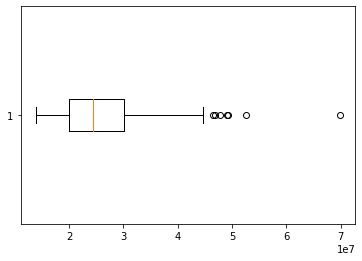

High - Low:


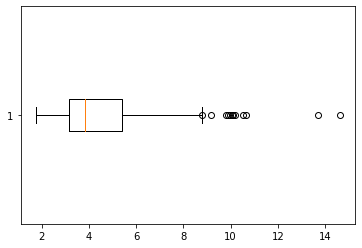

Close - Open:


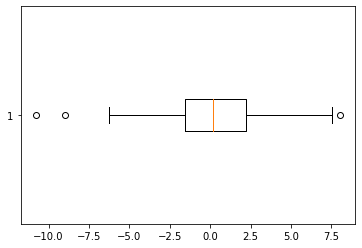

2022:
Open:


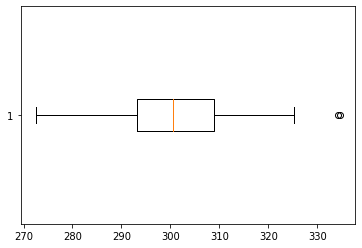

High:


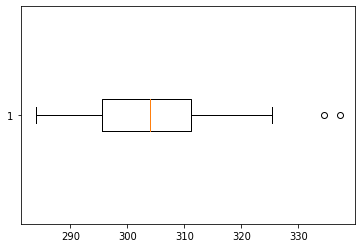

Low:


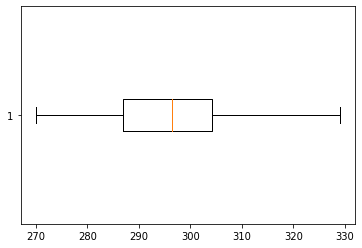

Close:


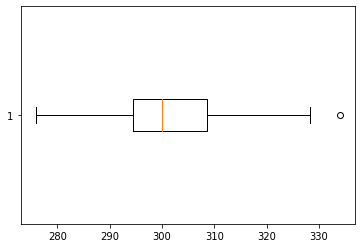

Volume:


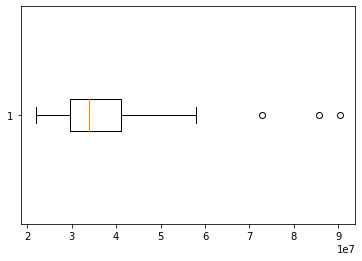

High - Low:


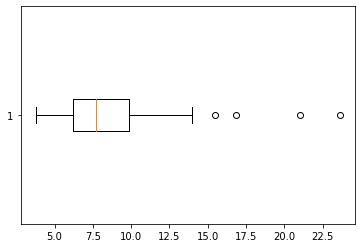

Close - Open:


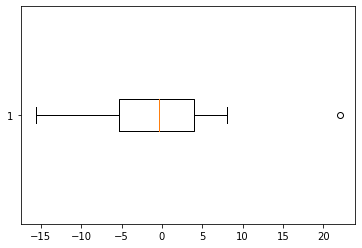

In [ ]:
for msft_year in msft_years.values():
  print(str(msft_year['Date'].max().year)+":")
  for column in msft_year.columns[1:]:
    print(column+":")
    plt.boxplot(x=msft_year[column], vert=False)
    plt.show()

#### Analysis (Amazon)

/usr/local/lib/python3.7/dist-packages/pandas/plotting/_matplotlib/core.py:345: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


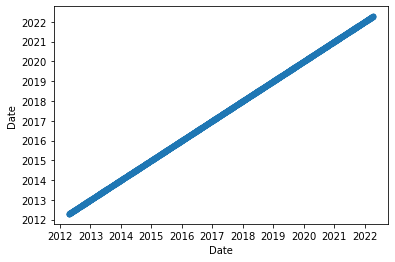

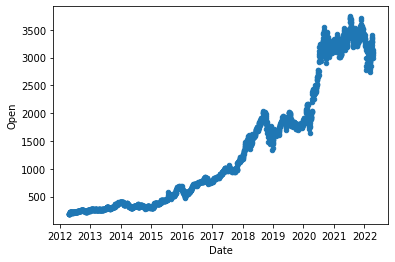

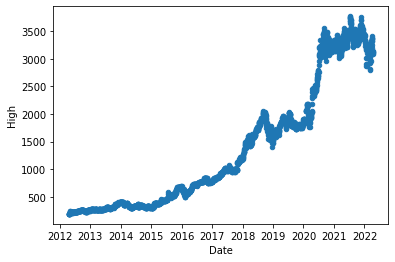

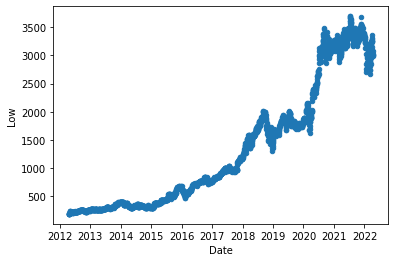

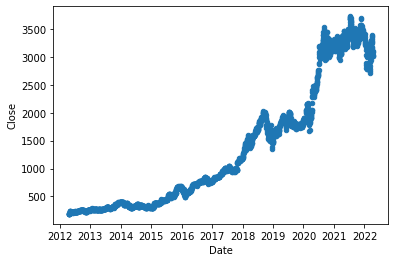

...

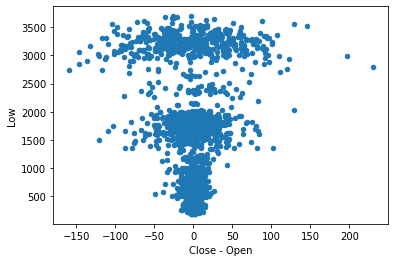

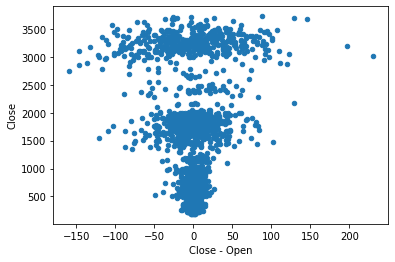

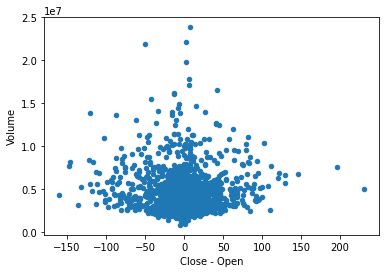

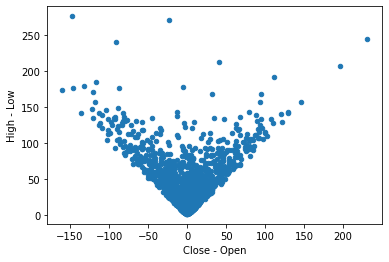

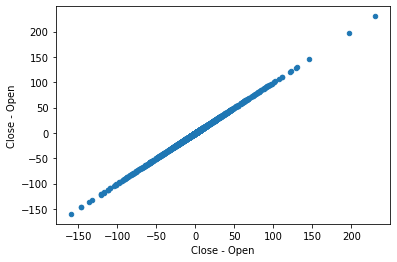

In [ ]:
amazonscatterplots = {}
for i in range(len(amazon_hist.columns)):
  for j in range(len(amazon_hist.columns)):
    amazonscatterplots[amazon_hist.columns[i]+","+amazon_hist.columns[j]] = amazon_hist.plot.scatter(x=i,y=j)

Open:


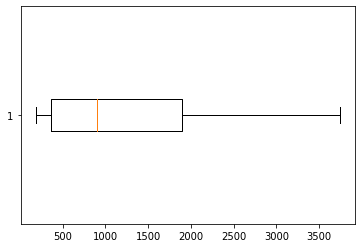

High:


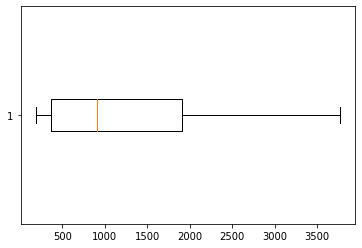

Low:


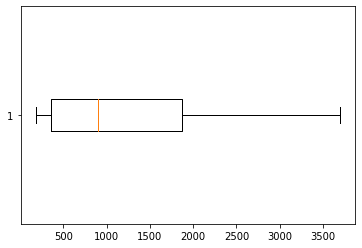

Close:


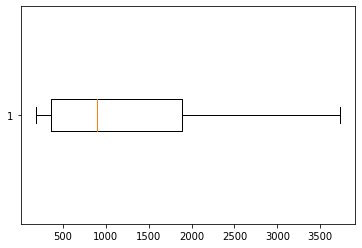

Volume:


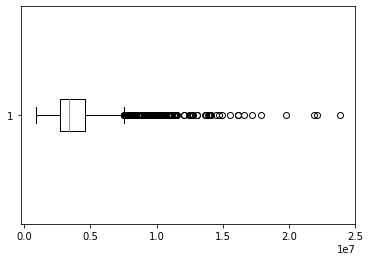

High - Low:


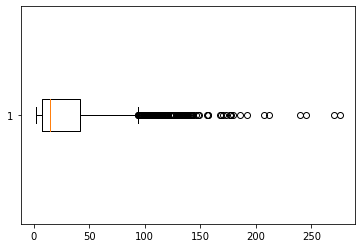

Close - Open:


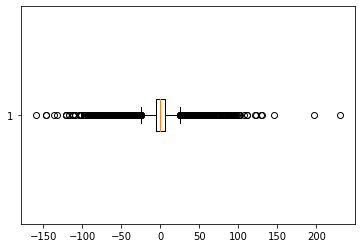

In [ ]:
amazonboxplots = {}
for column in amazon_hist.columns[1:]:
  print(column+":")
  amazonboxplots[column] = plt.boxplot(x=amazon_hist[column], vert=False)
  plt.show()

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fa94da69e50>,
      dtype=object)

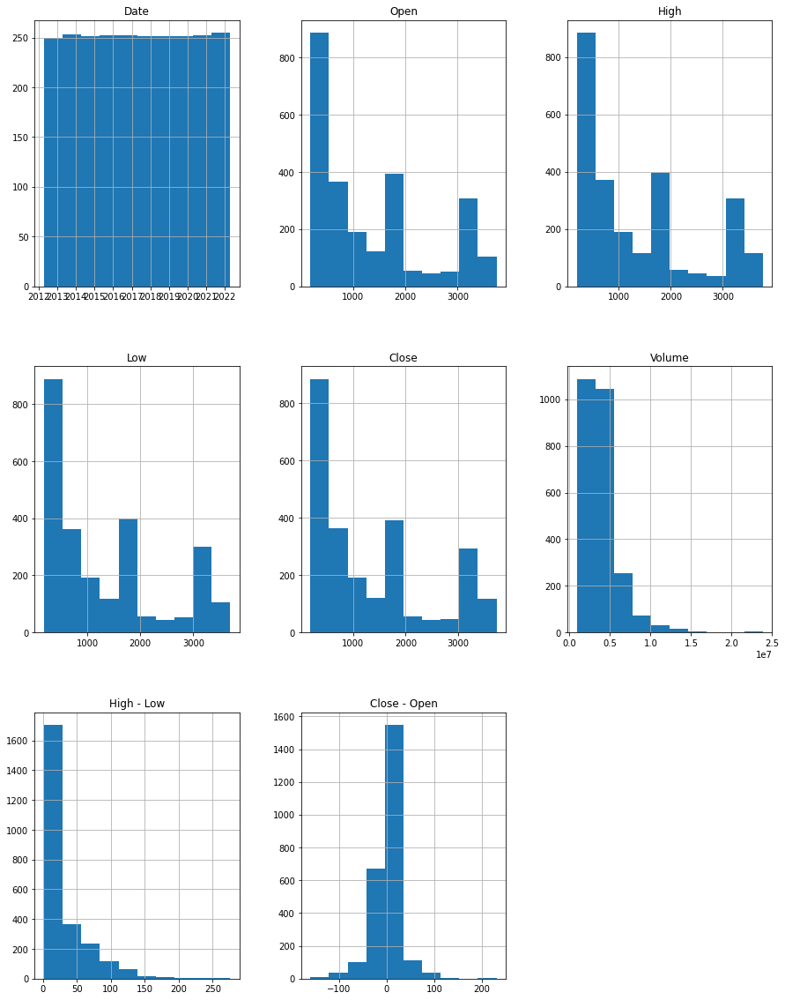

In [ ]:
amazon_hist.hist(figsize=(15,20))

In [ ]:
amazon_hist.corr()

,Open,High,Low,Close,Volume,High - Low,Close - Open
Open,1.000000,0.999869,0.999836,0.999674,0.067804,0.771298,-0.050498
High,0.999869,1.000000,0.999799,0.999849,0.072004,0.776686,-0.038526
Low,0.999836,0.999799,1.000000,0.999850,0.062033,0.763908,-0.037204
Close,0.999674,0.999849,0.999850,1.000000,0.066984,0.770223,-0.024997
Volume,0.067804,0.072004,0.062033,0.066984,1.000000,0.368898,-0.034655
High - Low,0.771298,0.776686,0.763908,0.770223,0.368898,1.000000,-0.071220
Close - Open,-0.050498,-0.038526,-0.037204,-0.024997,-0.034655,-0.071220,1.000000


In [ ]:
amazon_hist.corr(method="spearman")

,Open,High,Low,Close,Volume,High - Low,Close - Open
Open,1.000000,0.999774,0.999710,0.999450,0.180527,0.871524,-0.036977
High,0.999774,1.000000,0.999675,0.999741,0.186190,0.874820,-0.024170
Low,0.999710,0.999675,1.000000,0.999759,0.173508,0.867015,-0.023016
Close,0.999450,0.999741,0.999759,1.000000,0.179750,0.870807,-0.010632
Volume,0.180527,0.186190,0.173508,0.179750,1.000000,0.504429,-0.007861
High - Low,0.871524,0.874820,0.867015,0.870807,0.504429,1.000000,-0.033243
Close - Open,-0.036977,-0.024170,-0.023016,-0.010632,-0.007861,-0.033243,1.000000


2012:
Open:


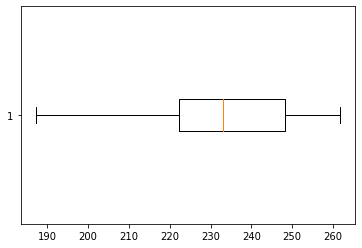

High:


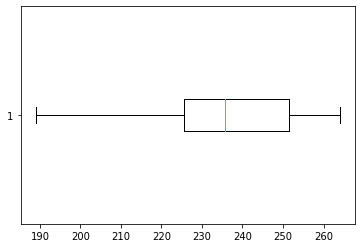

Low:


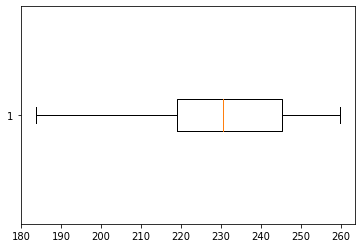

Close:


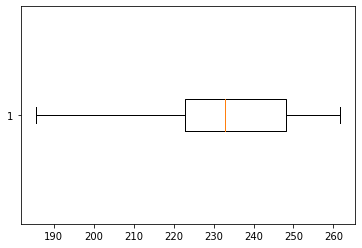

Volume:


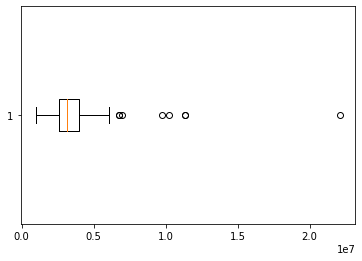

High - Low:


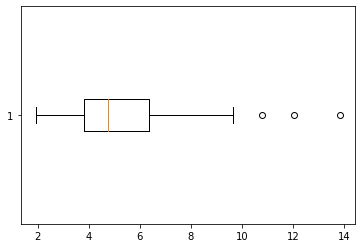

Close - Open:


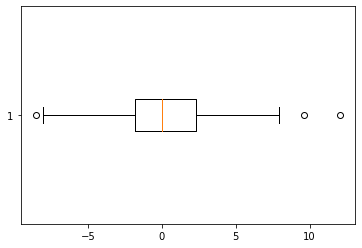

2013:
Open:


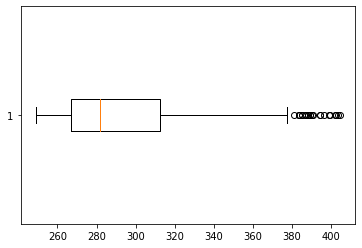

High:


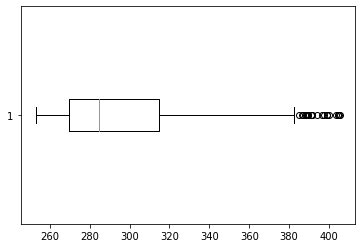

Low:


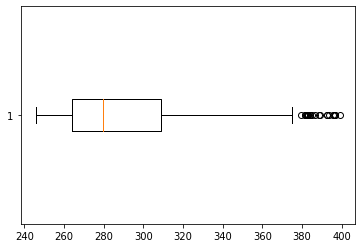

Close:


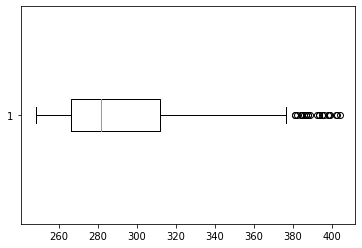

Volume:


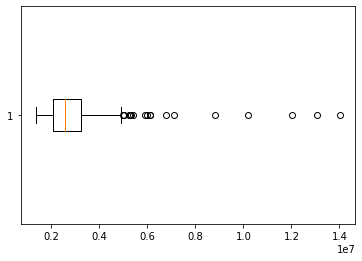

High - Low:


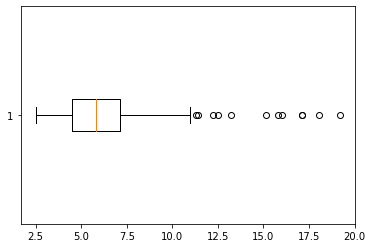

Close - Open:


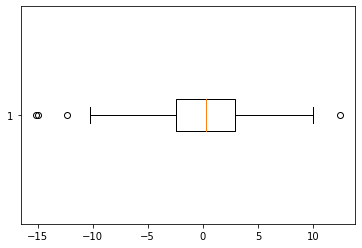

2014:
Open:


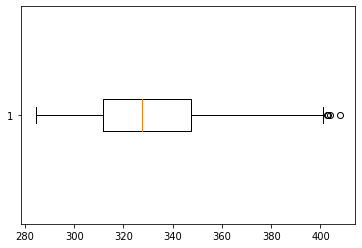

High:


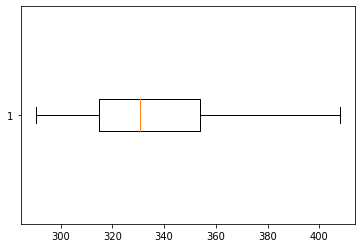

Low:


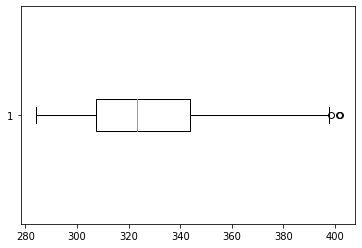

Close:


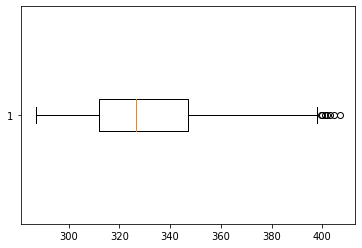

Volume:


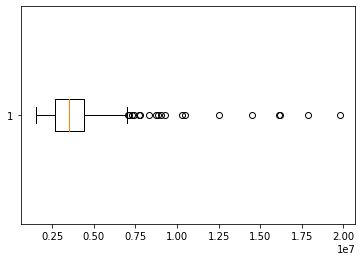

High - Low:


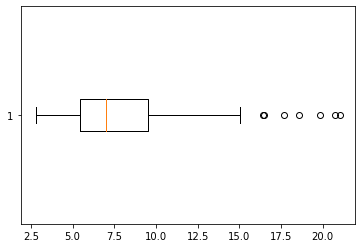

Close - Open:


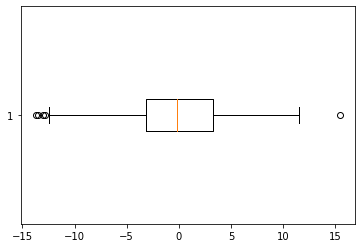

2015:
Open:


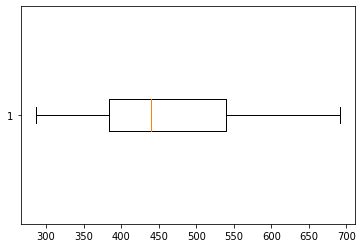

High:


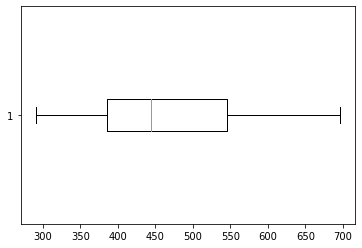

Low:


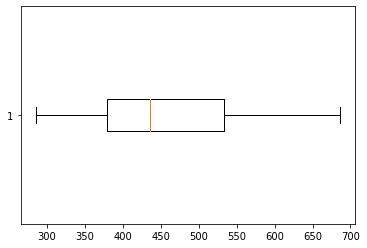

Close:


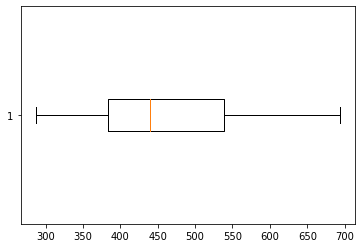

Volume:


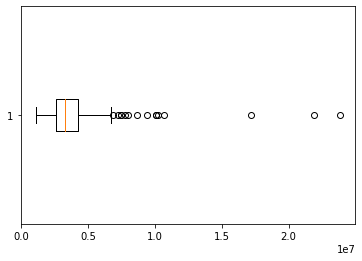

High - Low:


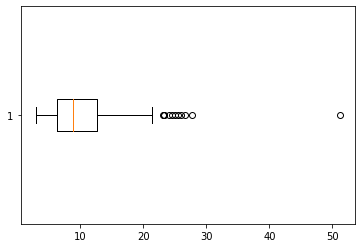

Close - Open:


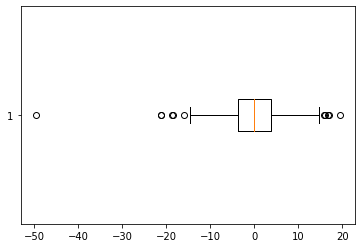

2016:
Open:


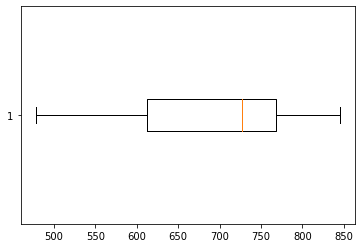

High:


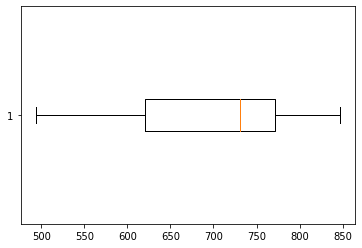

Low:


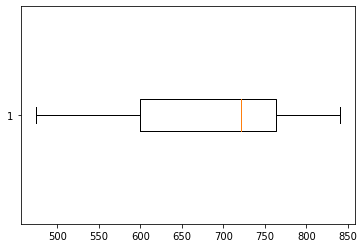

Close:


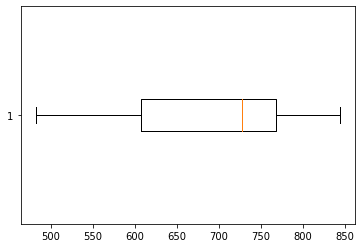

Volume:


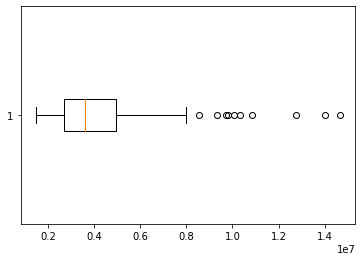

High - Low:


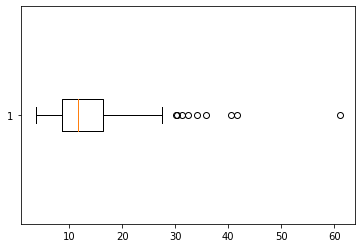

Close - Open:


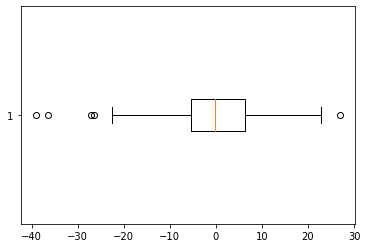

2017:
Open:


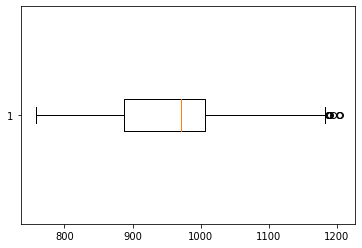

High:


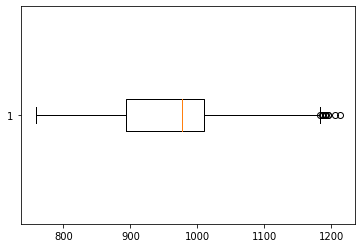

Low:


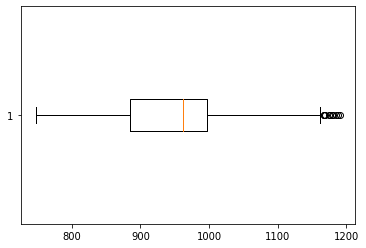

Close:


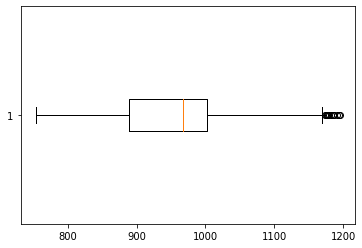

Volume:


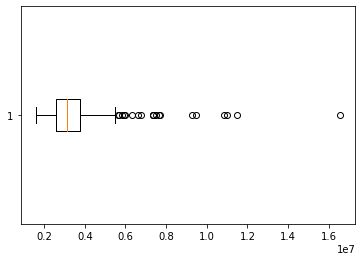

High - Low:


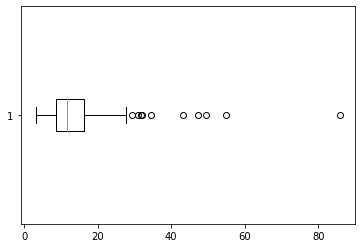

Close - Open:


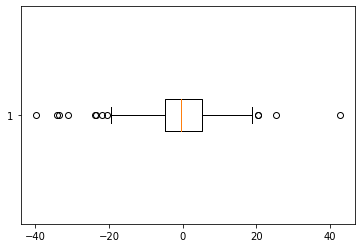

2018:
Open:


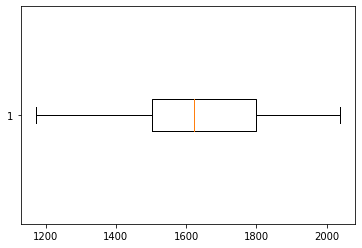

High:


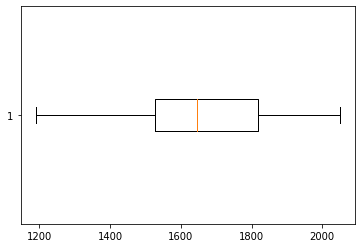

Low:


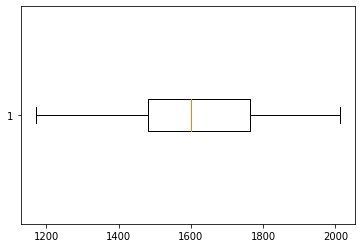

Close:


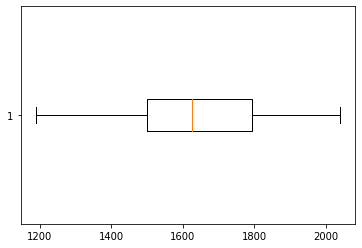

Volume:


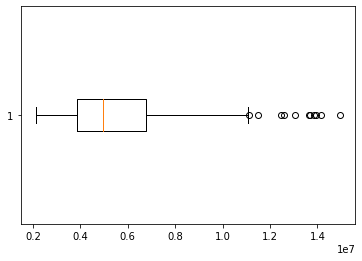

High - Low:


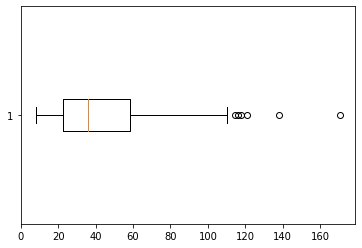

Close - Open:


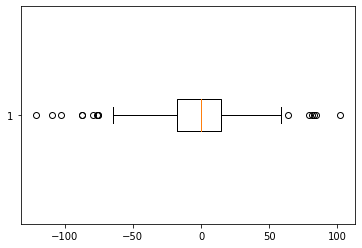

2019:
Open:


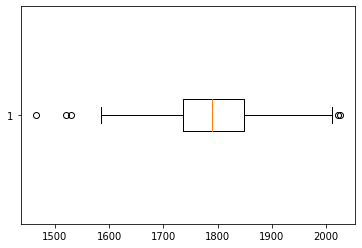

High:


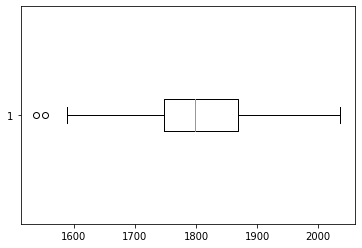

Low:


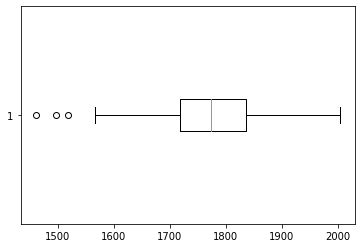

Close:


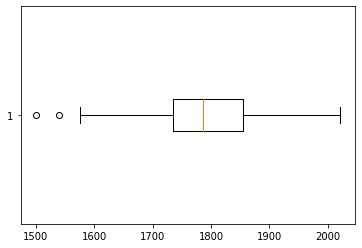

Volume:


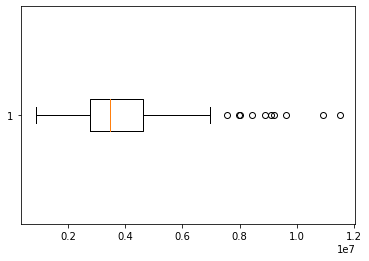

High - Low:


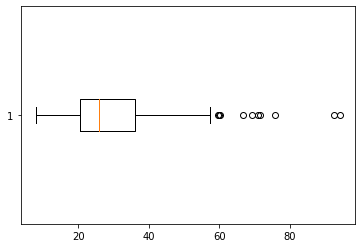

Close - Open:


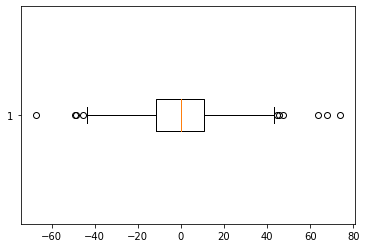

2020:
Open:


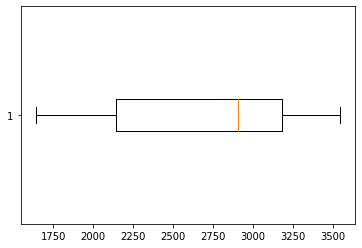

High:


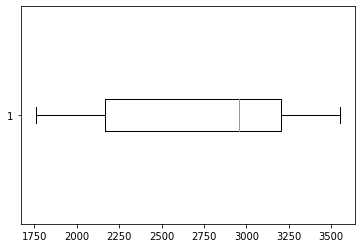

Low:


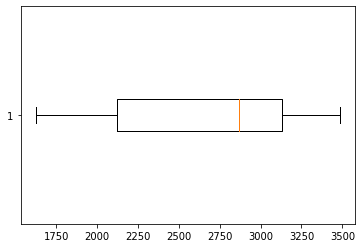

Close:


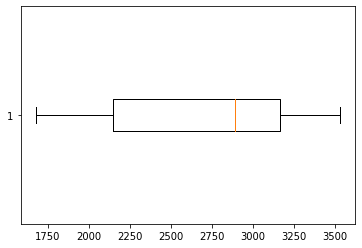

Volume:


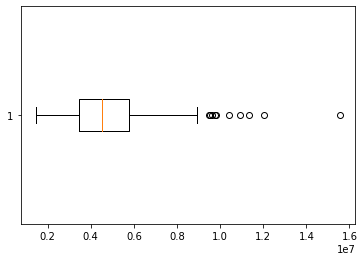

High - Low:


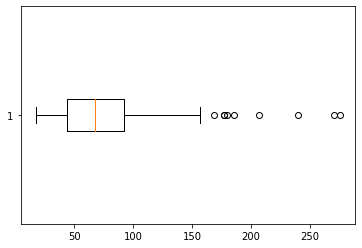

Close - Open:


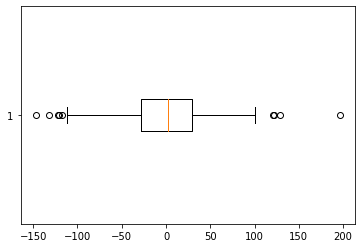

2021:
Open:


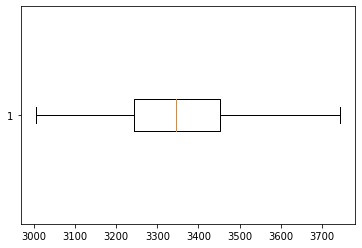

High:


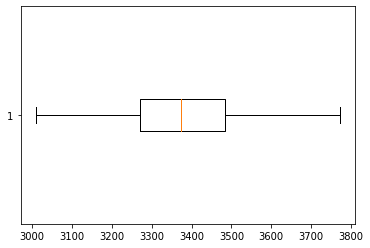

Low:


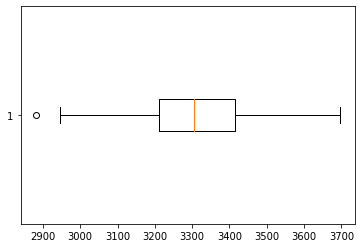

Close:


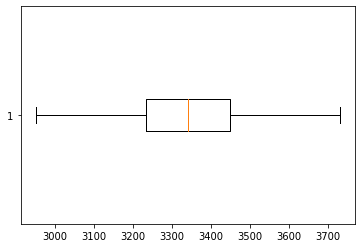

Volume:


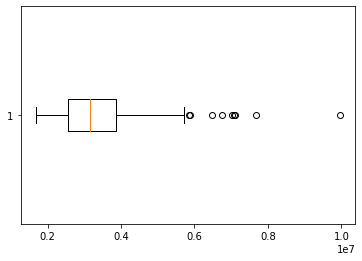

High - Low:


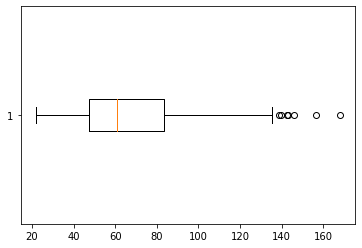

Close - Open:


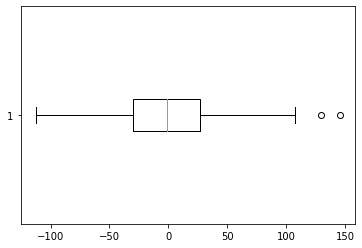

2022:
Open:


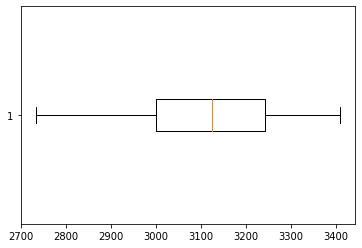

High:


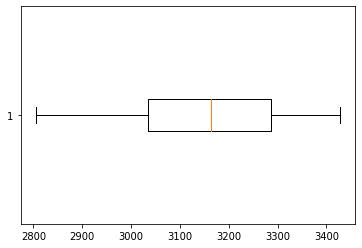

Low:


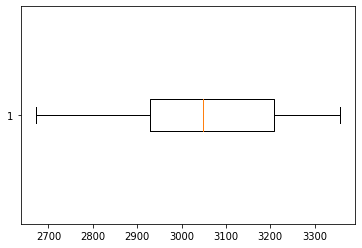

Close:


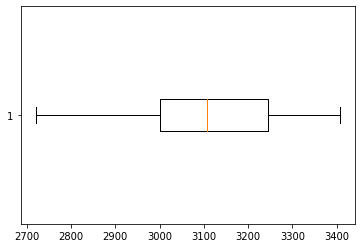

Volume:


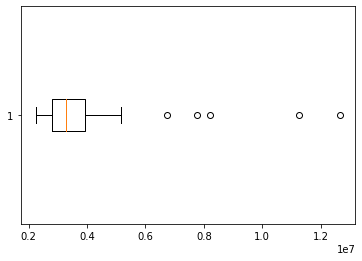

High - Low:


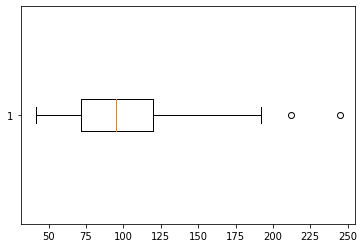

Close - Open:


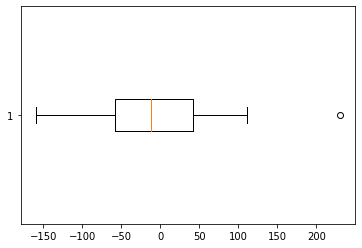

In [ ]:
for amazon_year in amazon_years.values():
  print(str(amazon_year['Date'].max().year)+":")
  for column in amazon_year.columns[1:]:
    print(column+":")
    plt.boxplot(x=amazon_year[column], vert=False)
    plt.show()

#### Analysis (Google)

/usr/local/lib/python3.7/dist-packages/pandas/plotting/_matplotlib/core.py:345: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


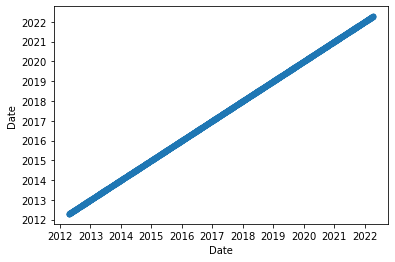

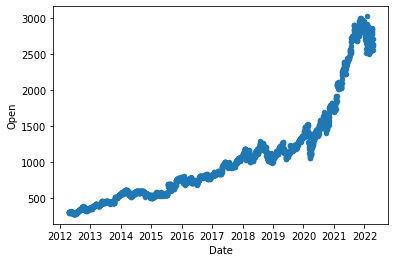

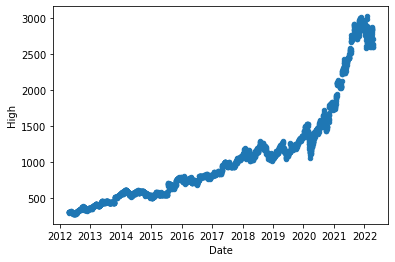

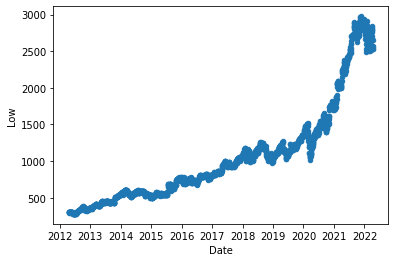

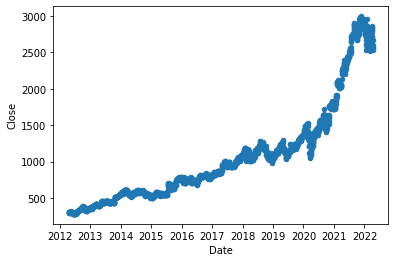

...

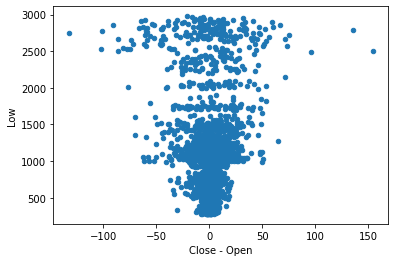

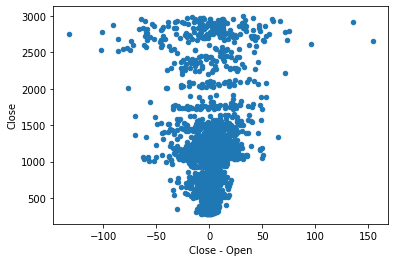

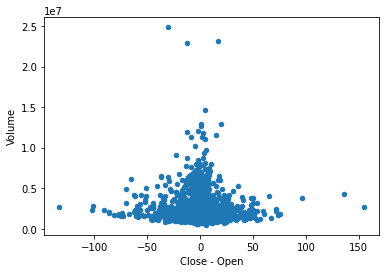

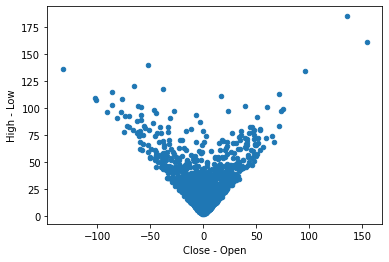

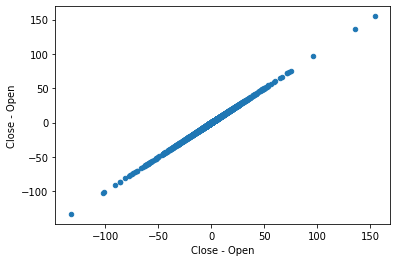

In [ ]:
googlescatterplots = {}
for i in range(len(google_hist.columns)):
  for j in range(len(google_hist.columns)):
    googlescatterplots[google_hist.columns[i]+","+google_hist.columns[j]] = google_hist.plot.scatter(x=i,y=j)

Open:


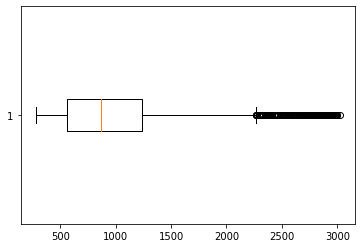

High:


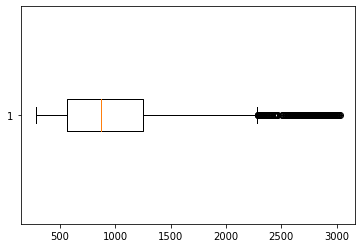

Low:


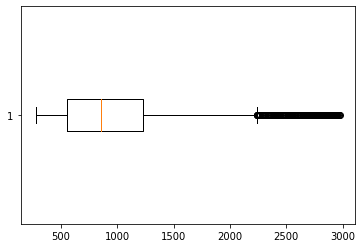

Close:


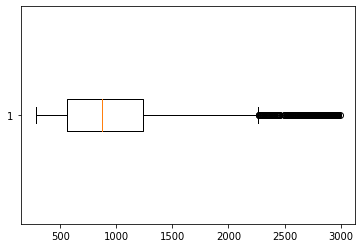

Volume:


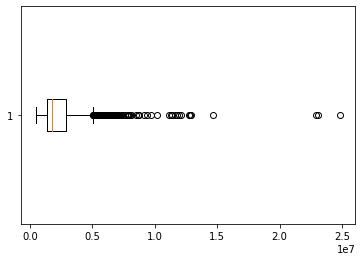

High - Low:


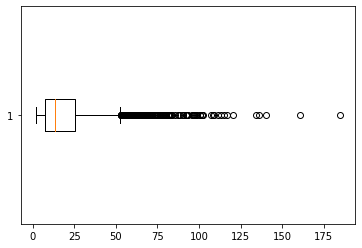

Close - Open:


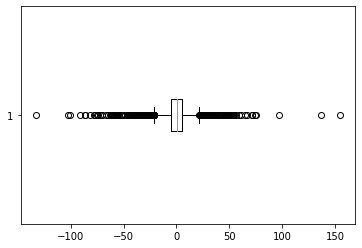

In [ ]:
googleboxplots = {}
for column in google_hist.columns[1:]:
  print(column+":")
  googleboxplots[column] = plt.boxplot(x=google_hist[column], vert=False)
  plt.show()

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fa94a737090>,
      dtype=object)

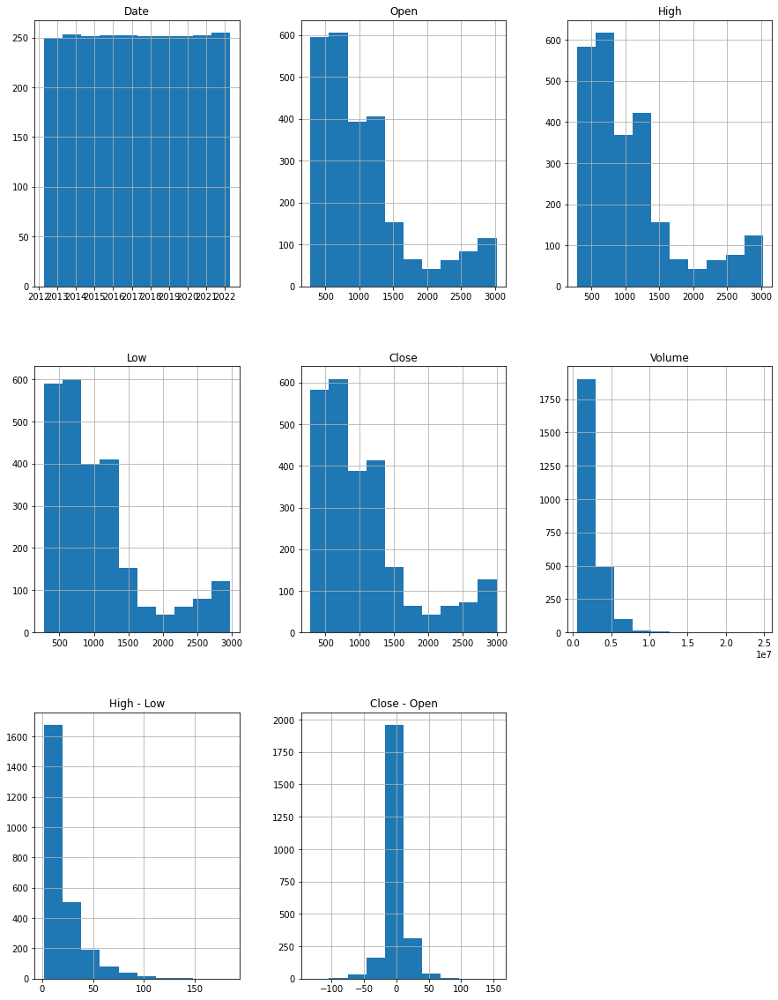

In [ ]:
google_hist.hist(figsize=(15,20))

In [ ]:
google_hist.corr()

,Open,High,Low,Close,Volume,High - Low,Close - Open
Open,1.000000,0.999865,0.999843,0.999687,-0.374000,0.733020,-0.031749
High,0.999865,1.000000,0.999807,0.999844,-0.371827,0.738992,-0.020078
Low,0.999843,0.999807,1.000000,0.999864,-0.377672,0.725631,-0.018410
Close,0.999687,0.999844,0.999864,1.000000,-0.375277,0.731571,-0.006732
Volume,-0.374000,-0.371827,-0.377672,-0.375277,1.000000,-0.071608,-0.043807
High - Low,0.733020,0.738992,0.725631,0.731571,-0.071608,1.000000,-0.071981
Close - Open,-0.031749,-0.020078,-0.018410,-0.006732,-0.043807,-0.071981,1.000000


In [ ]:
google_hist.corr(method="spearman")

,Open,High,Low,Close,Volume,High - Low,Close - Open
Open,1.000000,0.999790,0.999716,0.999499,-0.537230,0.808386,0.015550
High,0.999790,1.000000,0.999677,0.999737,-0.532984,0.812630,0.027386
Low,0.999716,0.999677,1.000000,0.999773,-0.543595,0.802030,0.028821
Close,0.999499,0.999737,0.999773,1.000000,-0.538933,0.807017,0.040361
Volume,-0.537230,-0.532984,-0.543595,-0.538933,1.000000,-0.148719,-0.053171
High - Low,0.808386,0.812630,0.802030,0.807017,-0.148719,1.000000,0.003190
Close - Open,0.015550,0.027386,0.028821,0.040361,-0.053171,0.003190,1.000000


2012:
Open:


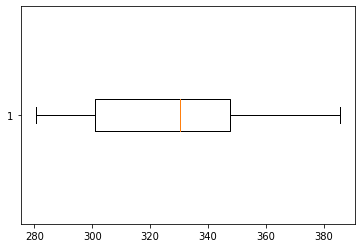

High:


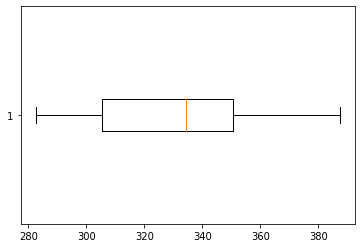

Low:


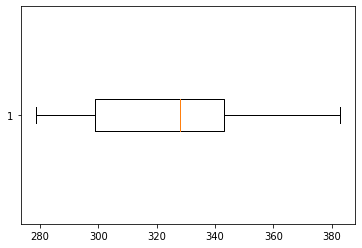

Close:


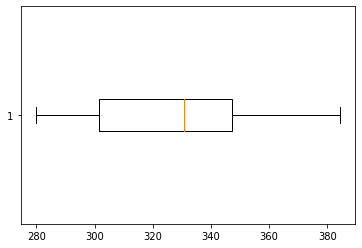

Volume:


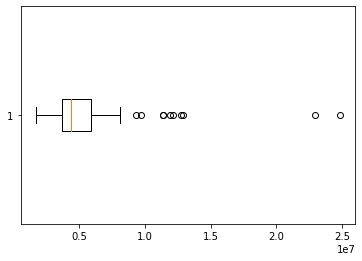

High - Low:


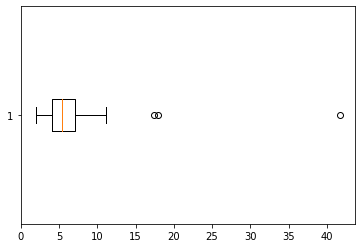

Close - Open:


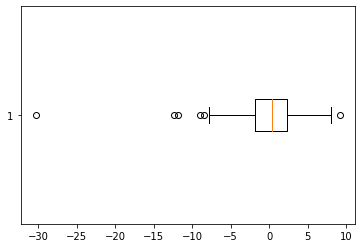

2013:
Open:


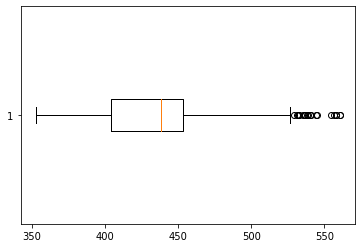

High:


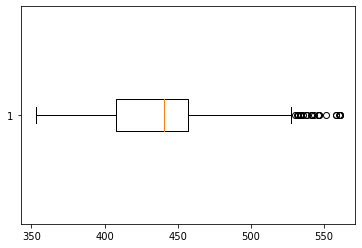

Low:


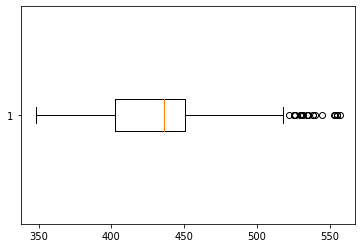

Close:


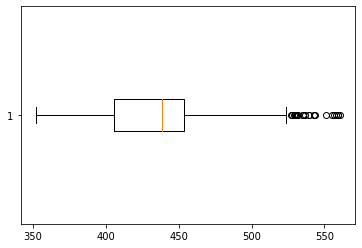

Volume:


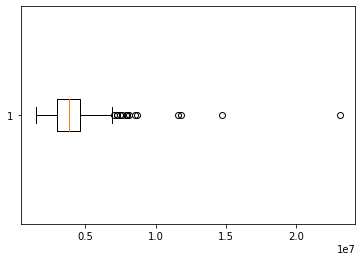

High - Low:


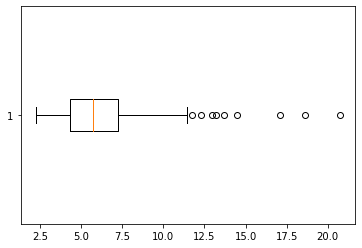

Close - Open:


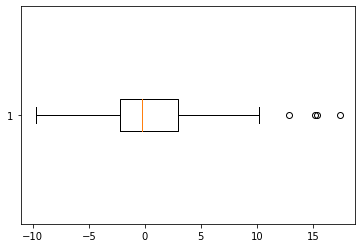

2014:
Open:


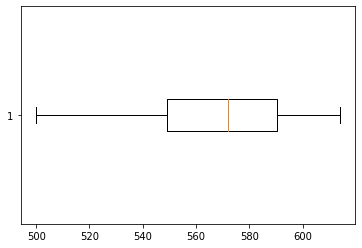

High:


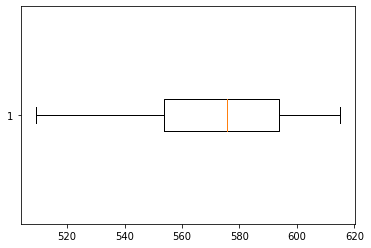

Low:


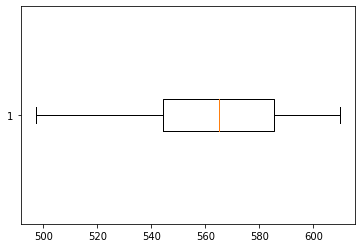

Close:


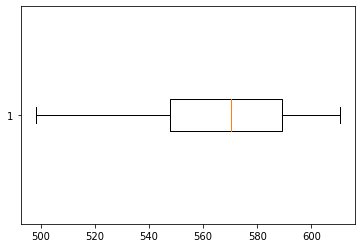

Volume:


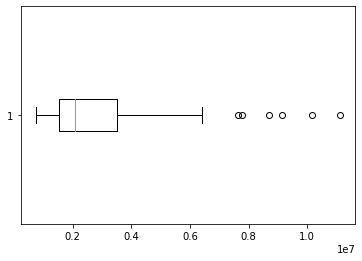

High - Low:


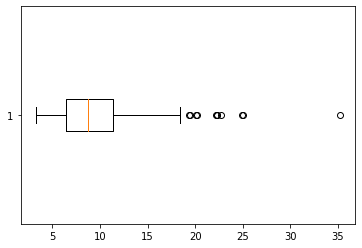

Close - Open:


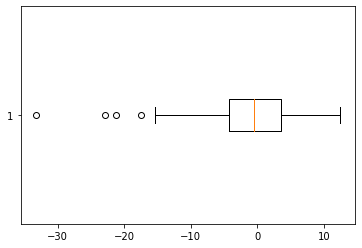

2015:
Open:


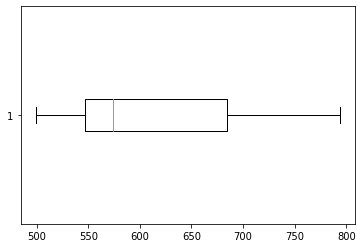

High:


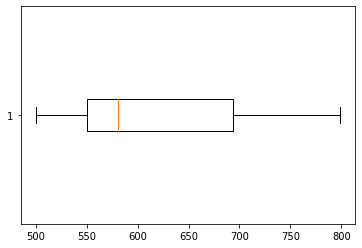

Low:


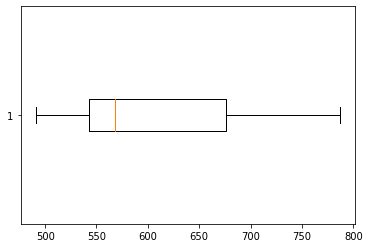

Close:


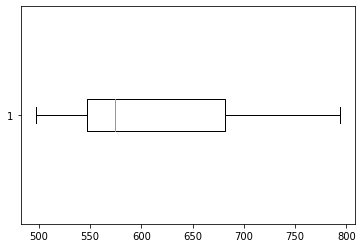

Volume:


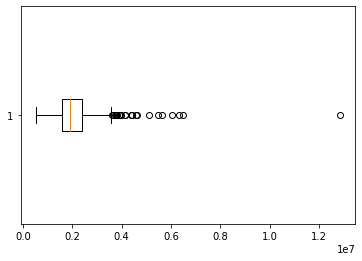

High - Low:


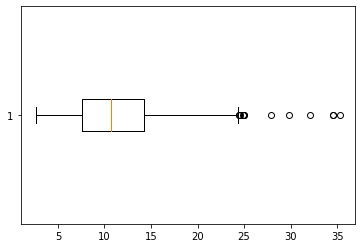

Close - Open:


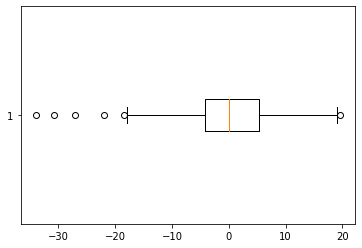

2016:
Open:


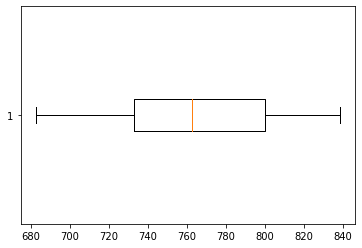

High:


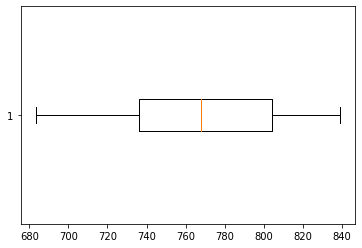

Low:


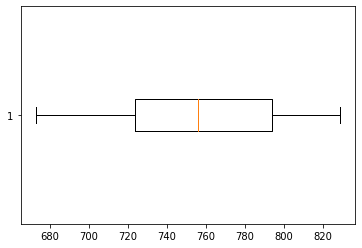

Close:


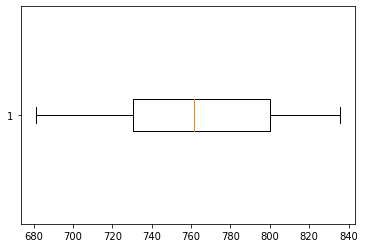

Volume:


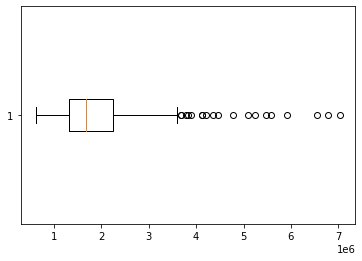

High - Low:


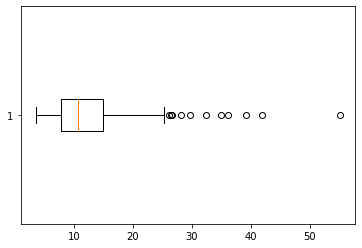

Close - Open:


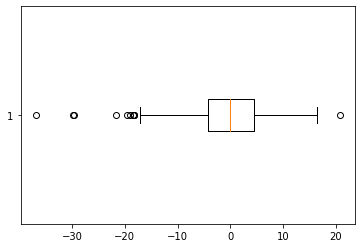

2017:
Open:


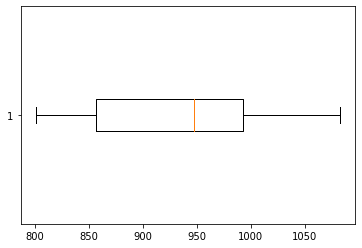

High:


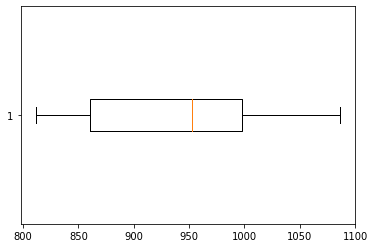

Low:


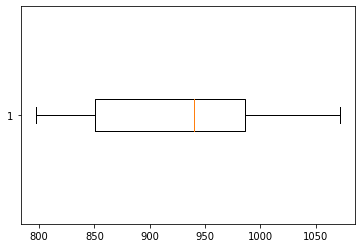

Close:


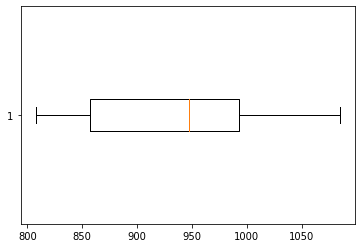

Volume:


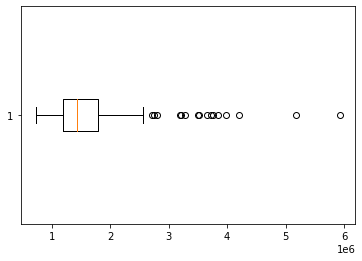

High - Low:


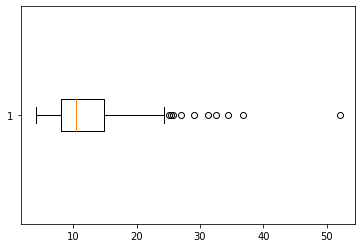

Close - Open:


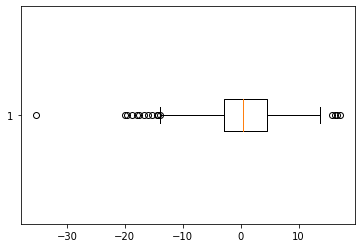

2018:
Open:


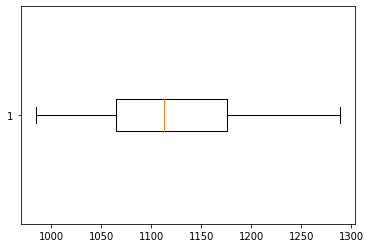

High:


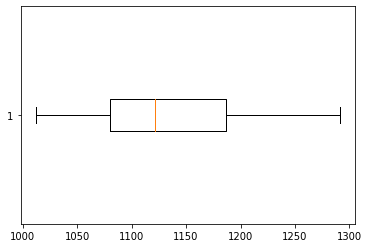

Low:


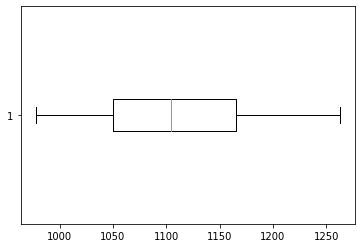

Close:


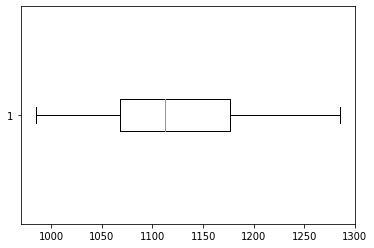

Volume:


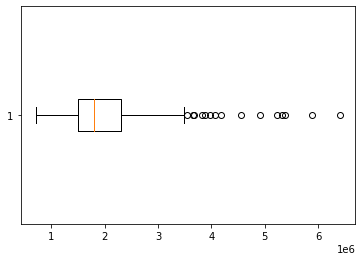

High - Low:


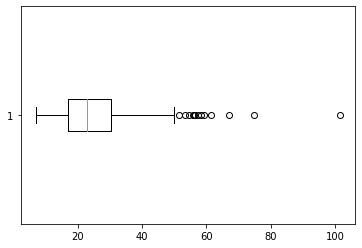

Close - Open:


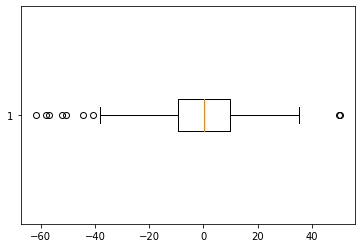

2019:
Open:


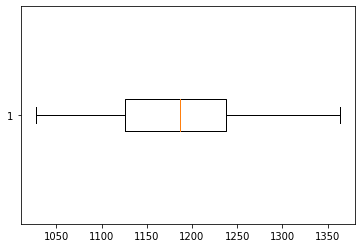

High:


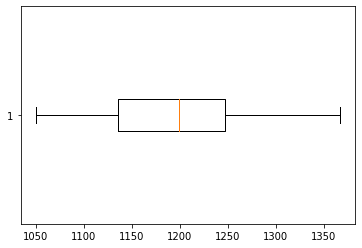

Low:


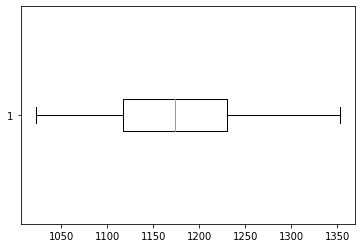

Close:


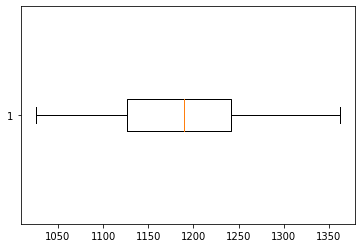

Volume:


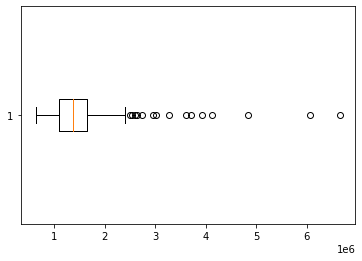

High - Low:


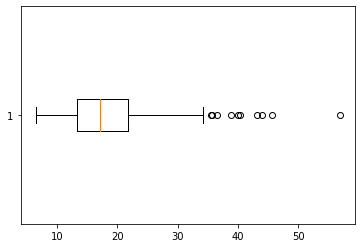

Close - Open:


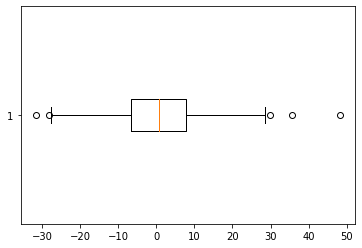

2020:
Open:


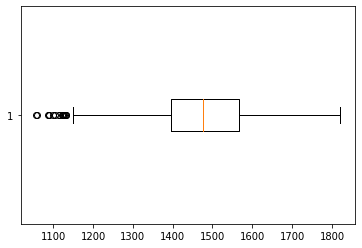

High:


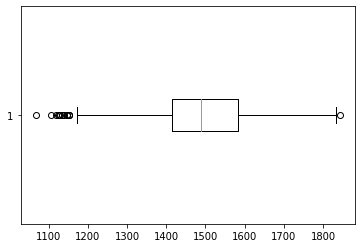

Low:


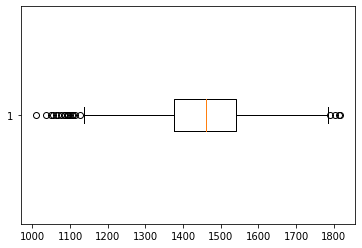

Close:


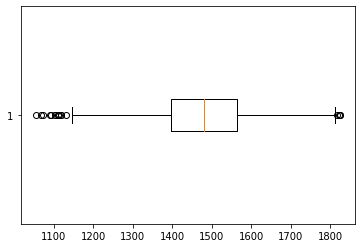

Volume:


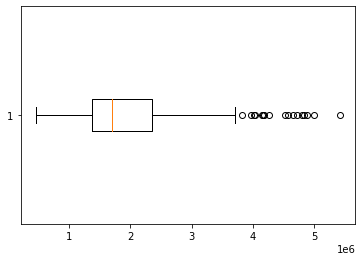

High - Low:


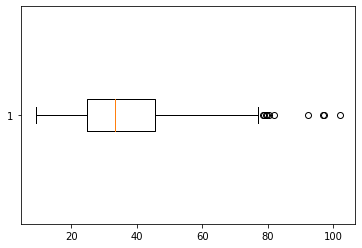

Close - Open:


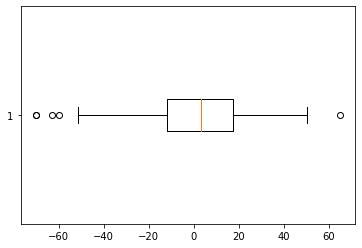

2021:
Open:


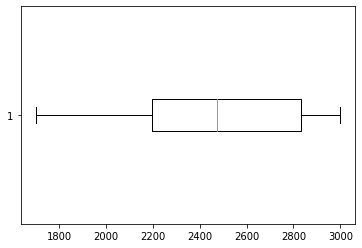

High:


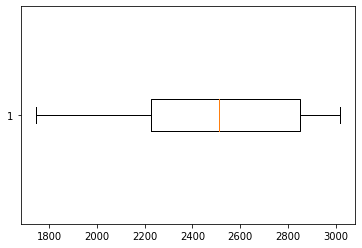

Low:


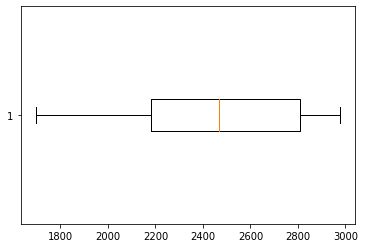

Close:


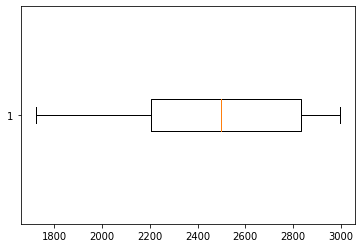

Volume:


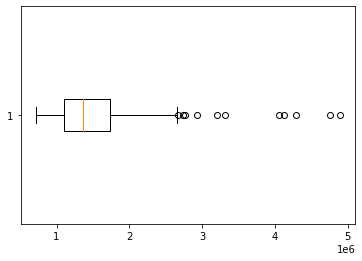

High - Low:


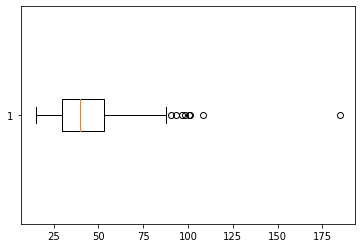

Close - Open:


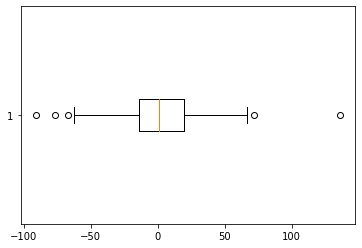

2022:
Open:


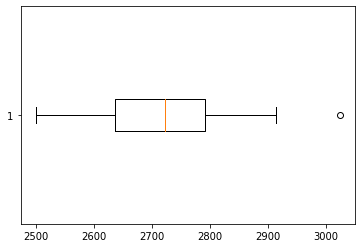

High:


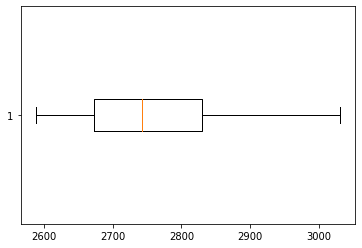

Low:


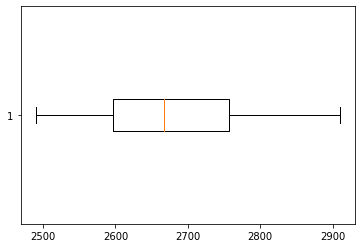

Close:


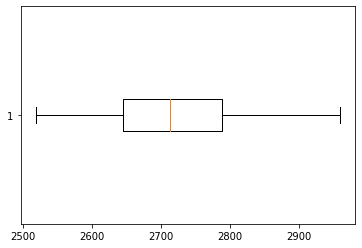

Volume:


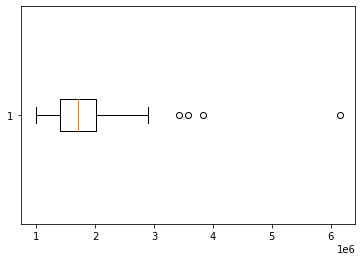

High - Low:


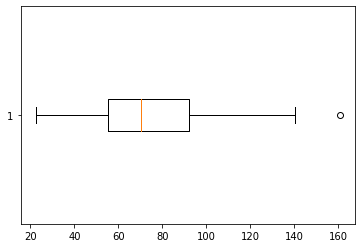

Close - Open:


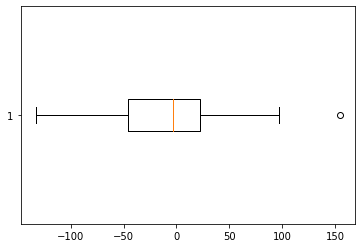

In [ ]:
for google_year in google_years.values():
  print(str(google_year['Date'].max().year)+":")
  for column in google_year.columns[1:]:
    print(column+":")
    plt.boxplot(x=google_year[column], vert=False)
    plt.show()

Analysis (Gold)

/usr/local/lib/python3.7/dist-packages/pandas/plotting/_matplotlib/core.py:345: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


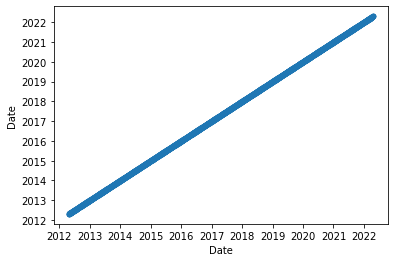

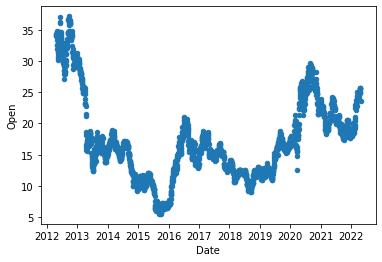

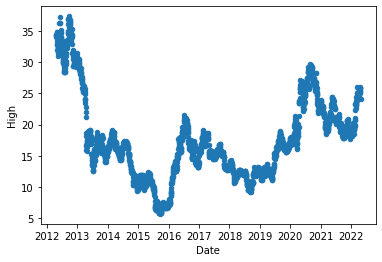

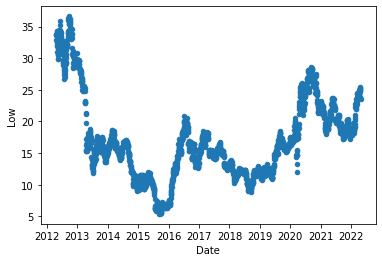

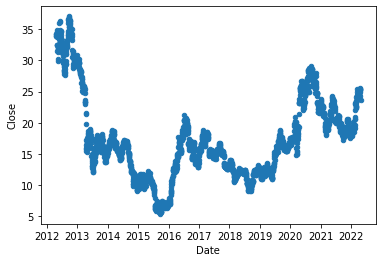

...

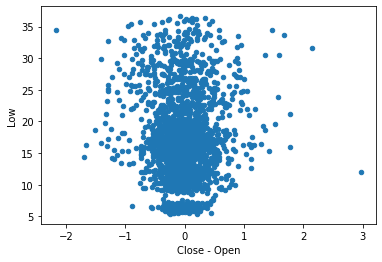

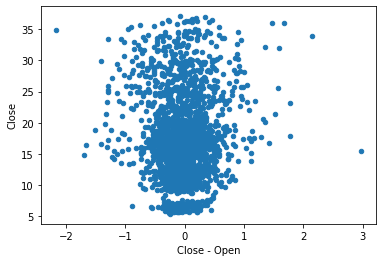

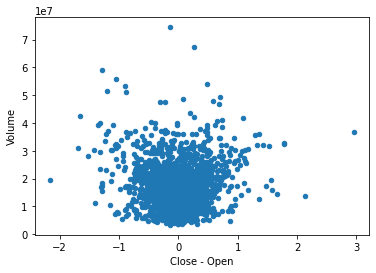

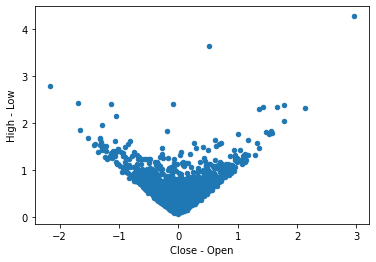

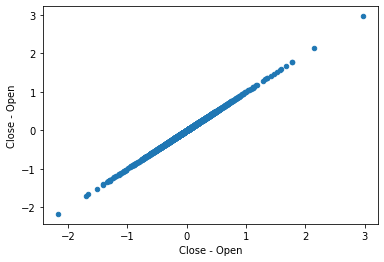

In [ ]:
goldscatterplots = {}
for i in range(len(gold_hist.columns)):
  for j in range(len(gold_hist.columns)):
    goldscatterplots[gold_hist.columns[i]+","+gold_hist.columns[j]] = gold_hist.plot.scatter(x=i,y=j)

Open:


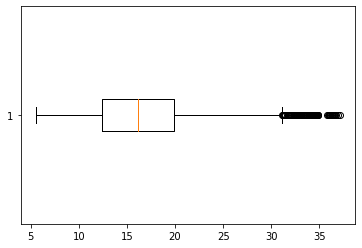

High:


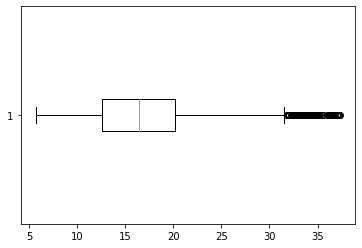

Low:


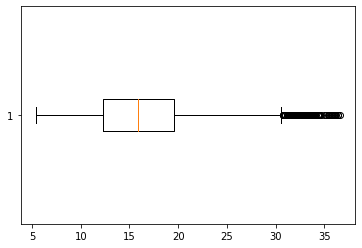

Close:


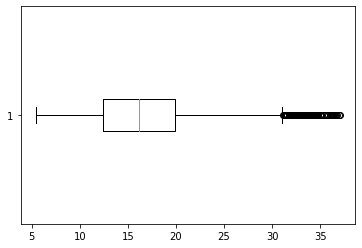

Volume:


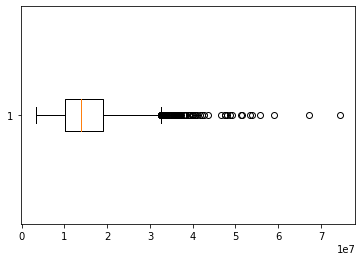

High - Low:


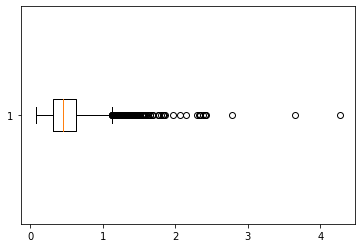

Close - Open:


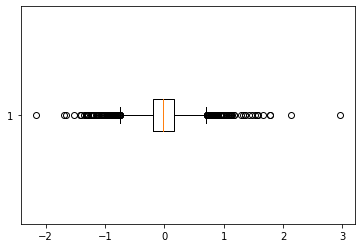

In [ ]:
goldboxplots = {}
for column in gold_hist.columns[1:]:
  print(column+":")
  goldboxplots[column] = plt.boxplot(x=gold_hist[column], vert=False)
  plt.show()

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f161705c5d0>,
      dtype=object)

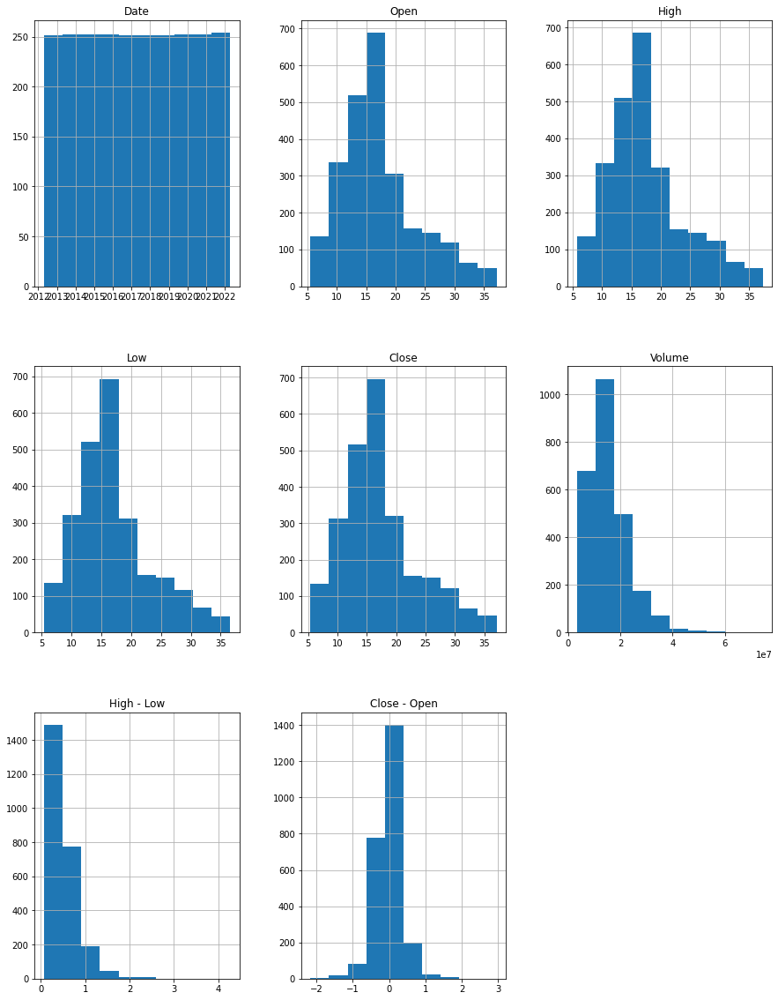

In [ ]:
gold_hist.hist(figsize=(15,20))

In [ ]:
gold_hist.corr()

,Open,High,Low,Close,Volume,High - Low,Close - Open
Open,1.000000,0.999211,0.999255,0.998362,-0.146217,0.460758,-0.075307
High,0.999211,1.000000,0.998965,0.999285,-0.133327,0.481896,-0.045445
Low,0.999255,0.998965,1.000000,0.999240,-0.159408,0.441545,-0.046987
Close,0.998362,0.999285,0.999240,1.000000,-0.146333,0.462494,-0.018141
Volume,-0.146217,-0.133327,-0.159408,-0.146333,1.000000,0.440867,0.004820
High - Low,0.460758,0.481896,0.441545,0.462494,0.440867,1.000000,0.008717
Close - Open,-0.075307,-0.045445,-0.046987,-0.018141,0.004820,0.008717,1.000000


In [ ]:
gold_hist.corr(method="spearman")

,Open,High,Low,Close,Volume,High - Low,Close - Open
Open,1.000000,0.998587,0.998686,0.997359,-0.085537,0.530735,-0.071690
High,0.998587,1.000000,0.997950,0.998679,-0.069491,0.550696,-0.042970
Low,0.998686,0.997950,1.000000,0.998783,-0.100553,0.510962,-0.041740
Close,0.997359,0.998679,0.998783,1.000000,-0.085301,0.529839,-0.014507
Volume,-0.085537,-0.069491,-0.100553,-0.085301,1.000000,0.459626,0.024927
High - Low,0.530735,0.550696,0.510962,0.529839,0.459626,1.000000,-0.037883
Close - Open,-0.071690,-0.042970,-0.041740,-0.014507,0.024927,-0.037883,1.000000


2012:
Open:


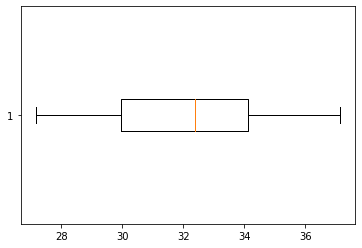

High:


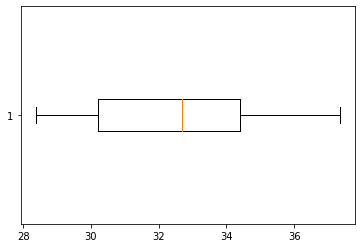

Low:


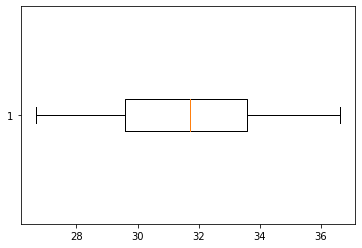

Close:


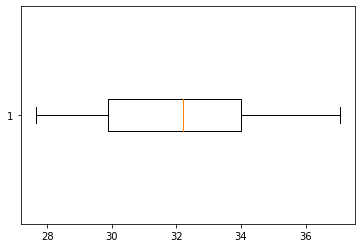

Volume:


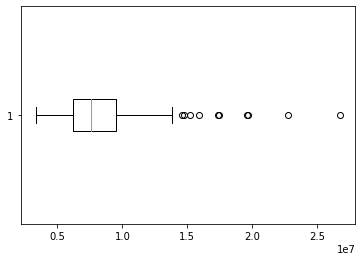

High - Low:


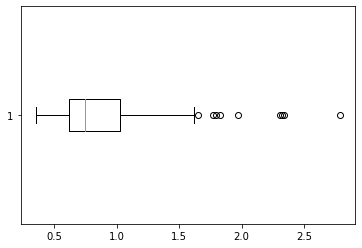

Close - Open:


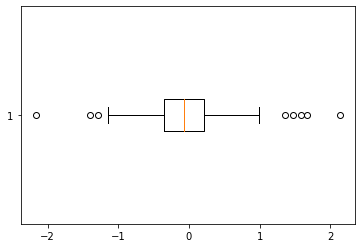

2013:
Open:


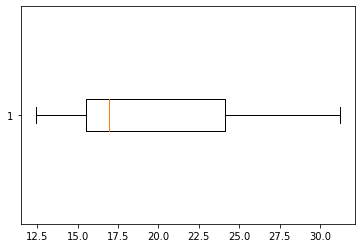

High:


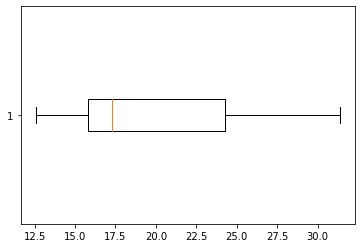

Low:


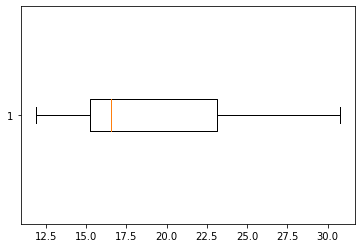

Close:


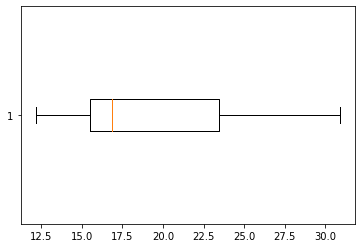

Volume:


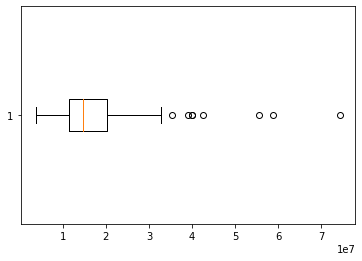

High - Low:


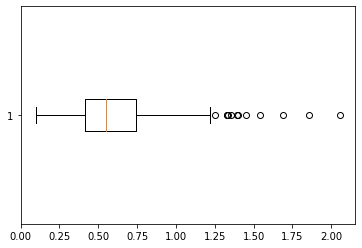

Close - Open:


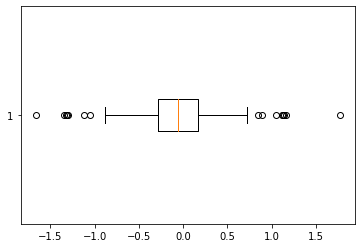

2014:
Open:


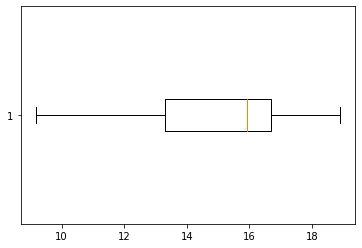

High:


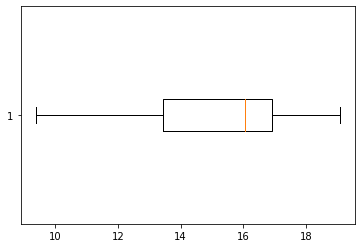

Low:


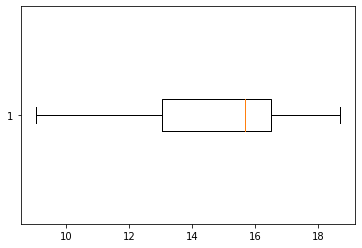

Close:


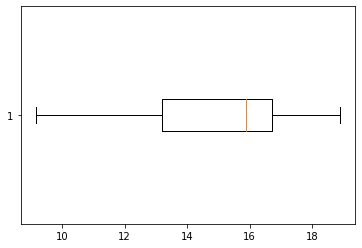

Volume:


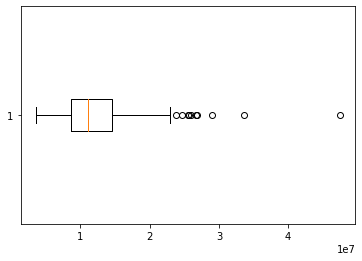

High - Low:


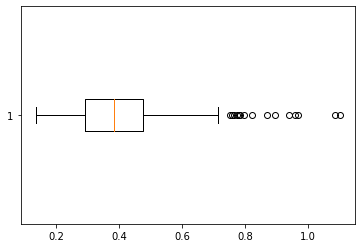

Close - Open:


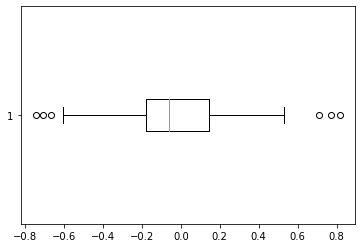

2015:
Open:


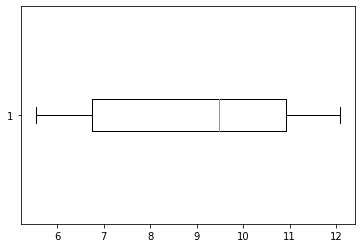

High:


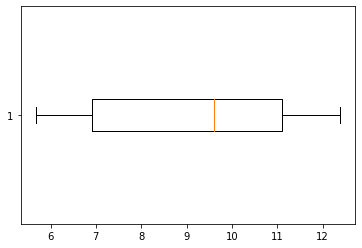

Low:


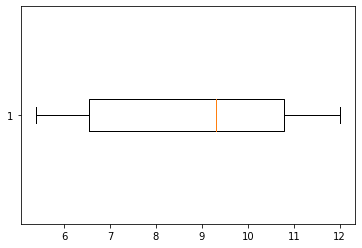

Close:


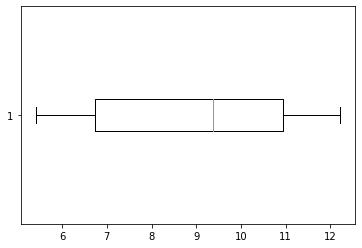

Volume:


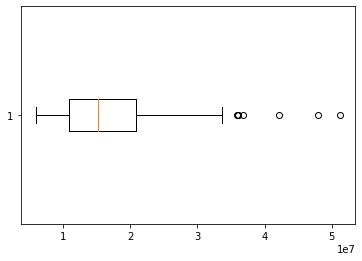

High - Low:


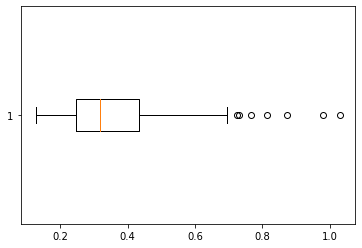

Close - Open:


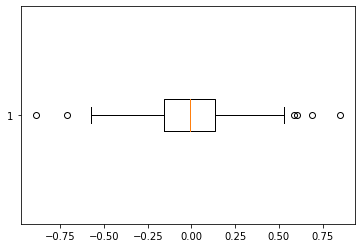

2016:
Open:


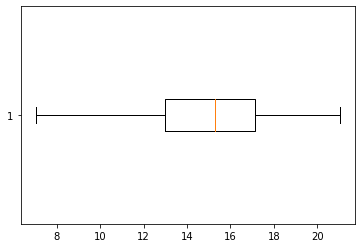

High:


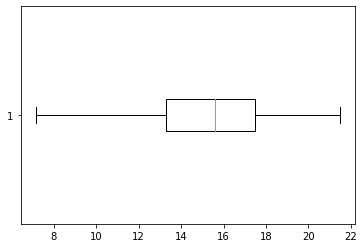

Low:


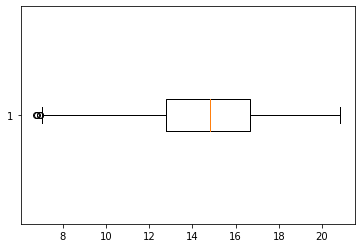

Close:


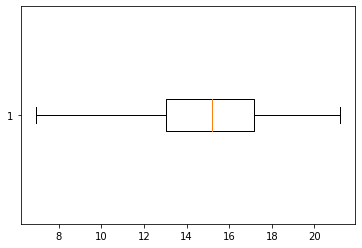

Volume:


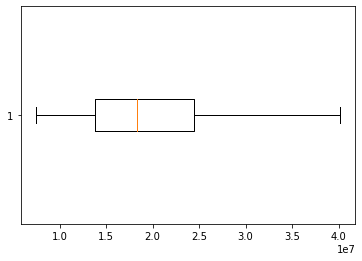

High - Low:


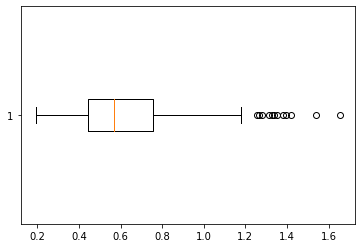

Close - Open:


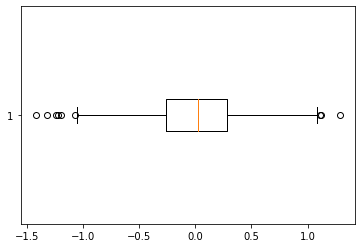

2017:
Open:


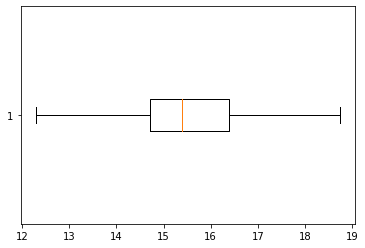

High:


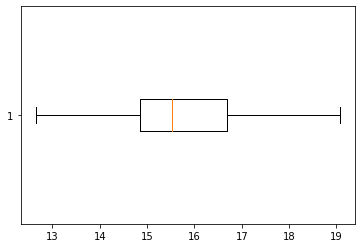

Low:


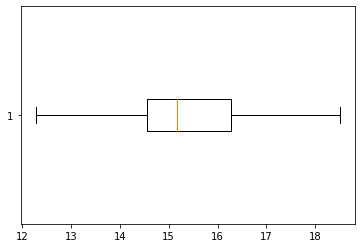

Close:


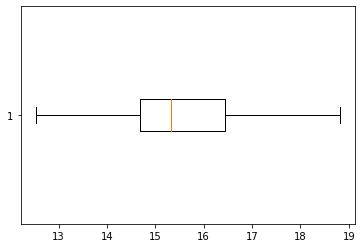

Volume:


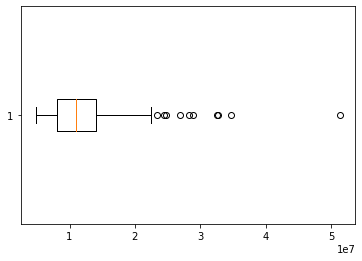

High - Low:


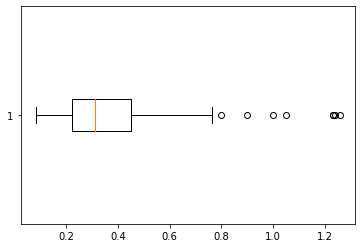

Close - Open:


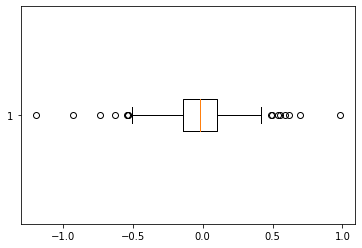

2018:
Open:


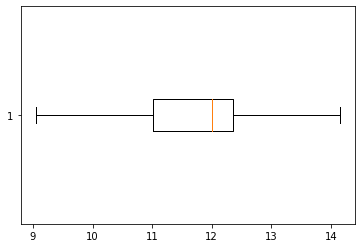

High:


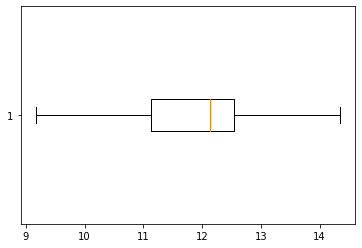

Low:


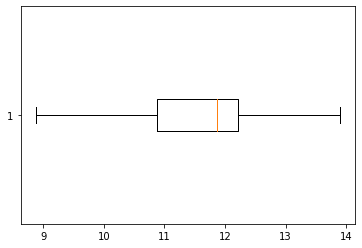

Close:


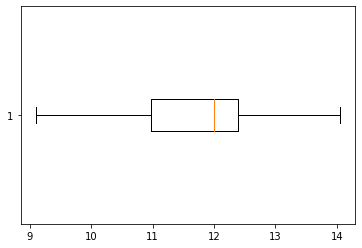

Volume:


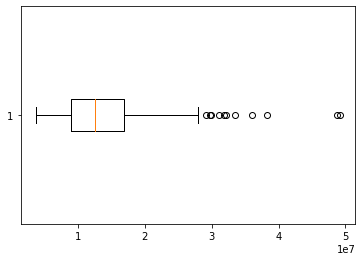

High - Low:


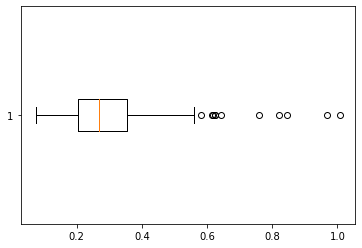

Close - Open:


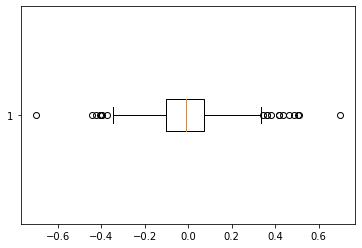

2019:
Open:


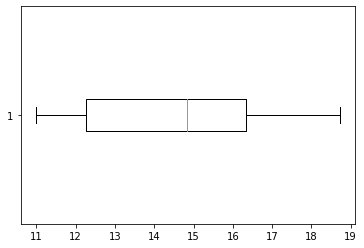

High:


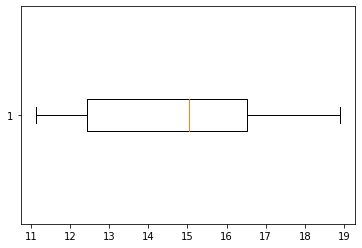

Low:


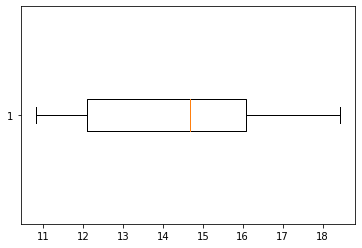

Close:


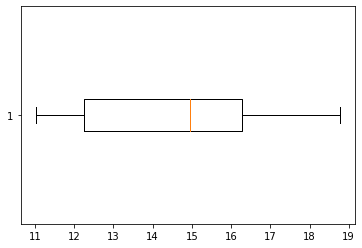

Volume:


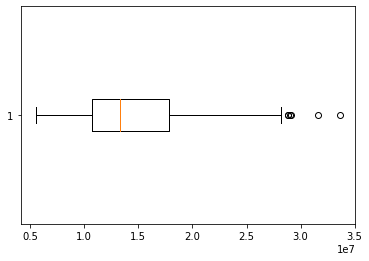

High - Low:


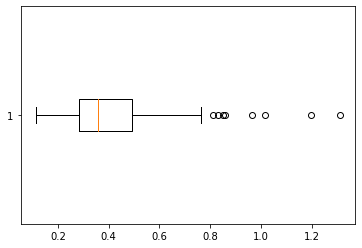

Close - Open:


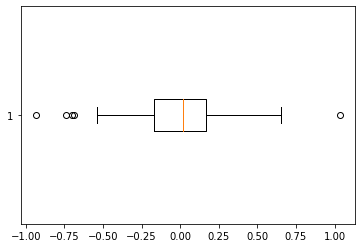

2020:
Open:


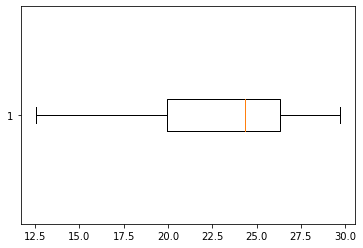

High:


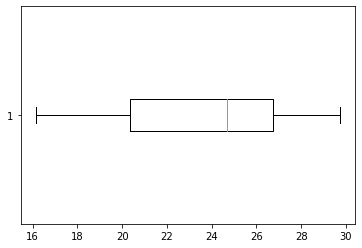

Low:


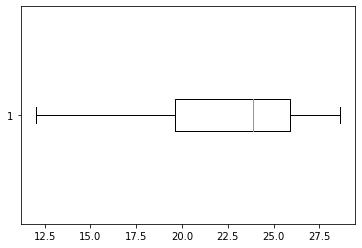

Close:


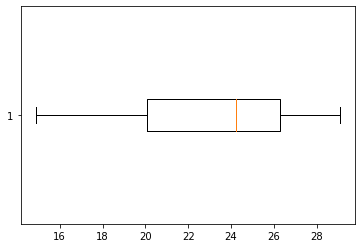

Volume:


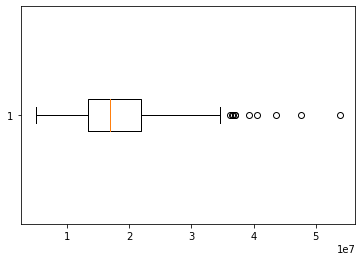

High - Low:


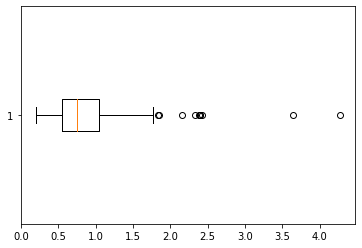

Close - Open:


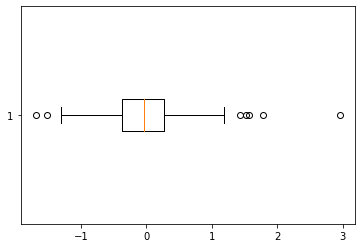

2021:
Open:


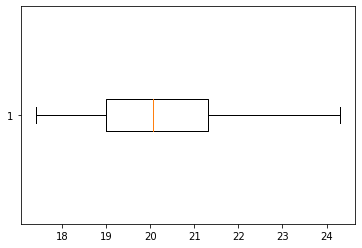

High:


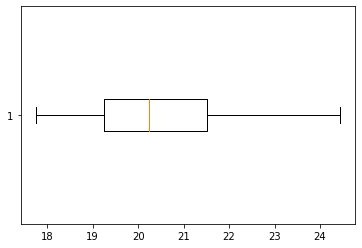

Low:


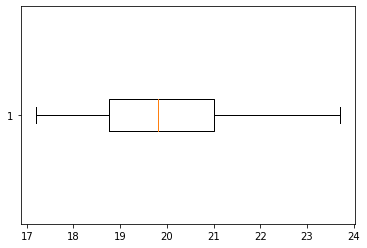

Close:


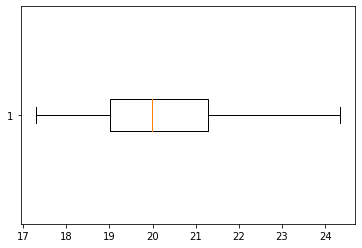

Volume:


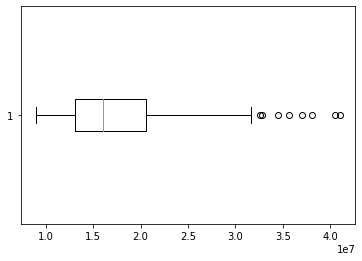

High - Low:


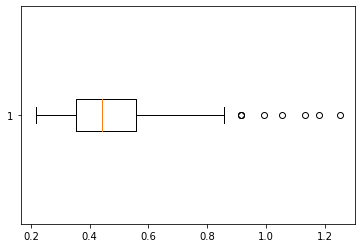

Close - Open:


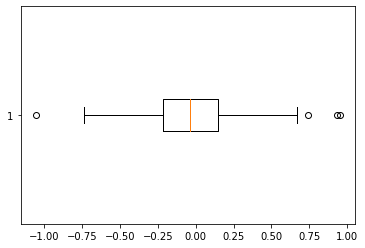

2022:
Open:


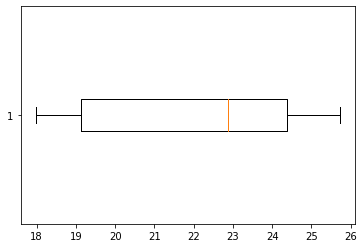

High:


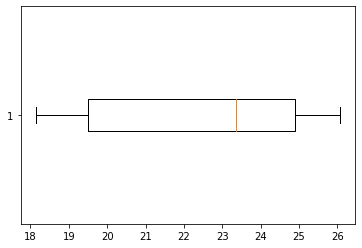

Low:


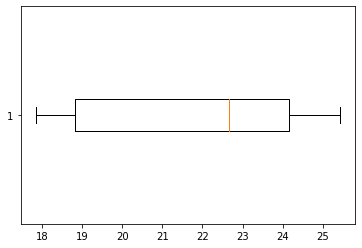

Close:


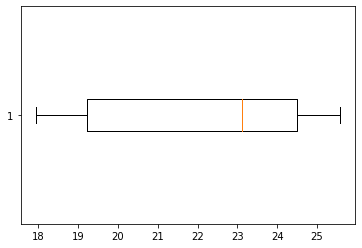

Volume:


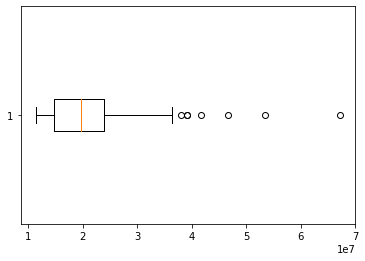

High - Low:


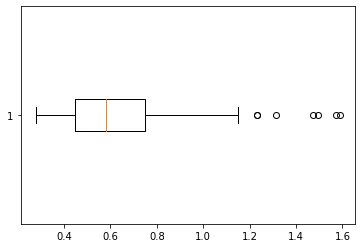

Close - Open:


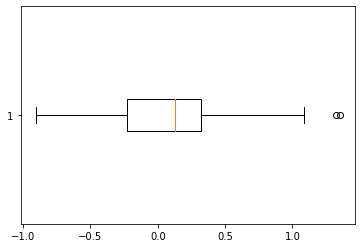

In [ ]:
for gold_year in gold_years.values():
  print(str(gold_year['Date'].max().year)+":")
  for column in gold_year.columns[1:]:
    print(column+":")
    plt.boxplot(x=gold_year[column], vert=False)
    plt.show()

#### Dates

In [ ]:
#top 5 US stocks
apple = yf.Ticker("AAPL")
msft = yf.Ticker("MSFT")
amazon = yf.Ticker("AMZN")
google = yf.Ticker("GOOGL")
tsla = yf.Ticker("TSLA")

#datasets
apple_hist = apple.history(period="20y")
msft_hist = msft.history(period="20y")
amazon_hist = amazon.history(period="20y")
google_hist = google.history(period="20y")
tsla_hist = tsla.history(period="20y")

In [ ]:
#earliest date
print(apple_hist_all.index.min())   #1980-12-12
print(msft_hist_all.index.min())    #1986-03-13
print(amazon_hist_all.index.min())  #1997-05-15
print(google_hist_all.index.min())  #2004-08-19
print(tsla_hist_all.index.min())    #2010-06-29

#latest date
print(apple_hist_all.index.max())   #2022-03-25 00:00:00
print(msft_hist_all.index.max())    #2022-03-25 00:00:00
print(amazon_hist_all.index.max())  #2022-03-25 00:00:00
print(google_hist_all.index.max())  #2022-03-25 00:00:00
print(tsla_hist_all.index.max())    #2022-03-25 00:00:00

#### Min Max Mean

In [ ]:
#all time min max mean
apple_hist_all.describe()
msft_hist_all.describe()
amazon_hist_all.describe()
google_hist_all.describe()
tsla_hist_all.describe()

#datasets for 10 years
apple_10y = apple.history(period="10y")
msft_10y = msft.history(period="10y")
amazon_10y = amazon.history(period="10y")
google_10y = google.history(period="10y")
tsla_10y = tsla.history(period="10y")

apple_10y.describe()
msft_10y.describe()
amazon_10y.describe()
google_10y.describe()
tsla_10y.describe()

#### Percent increase last 10 years

In [ ]:
apple_start = apple_hist_all[apple_hist_all.index == '2012-03-01 00:00:00']
apple_end = apple_hist_all[apple_hist_all.index == '2022-03-01 00:00:00']
apple_start_end = pd.concat([apple_start, apple_end])
apple_format = apple_start_end.pivot_table(values = 'Close', columns = 'Date')
apple_format
apple_format["percentincrease"] = (apple_format["2022-03-01"] - apple_format["2012-03-01"] )/ apple_format["2012-03-01"] *100
apple_format

msft_start = msft_hist_all[msft_hist_all.index == '2012-03-01 00:00:00']
msft_end = msft_hist_all[msft_hist_all.index == '2022-03-01 00:00:00']
msft_start_end = pd.concat([msft_start, msft_end])
msft_format = msft_start_end.pivot_table(values = 'Close', columns = 'Date')
msft_format
msft_format["percentincrease"] = (msft_format["2022-03-01"] - msft_format["2012-03-01"] )/ msft_format["2012-03-01"] *100
msft_format

google_start = google_hist_all[google_hist_all.index == '2012-03-01 00:00:00']
google_end = google_hist_all[google_hist_all.index == '2022-03-01 00:00:00']
google_start_end = pd.concat([google_start, google_end])
google_format = google_start_end.pivot_table(values = 'Close', columns = 'Date')
google_format
google_format["percentincrease"] = (google_format["2022-03-01"] - google_format["2012-03-01"] )/ google_format["2012-03-01"] *100
google_format

amazon_start = amazon_hist_all[amazon_hist_all.index == '2012-03-01 00:00:00']
amazon_end = amazon_hist_all[amazon_hist_all.index == '2022-03-01 00:00:00']
amazon_start_end = pd.concat([amazon_start, amazon_end])
amazon_format = amazon_start_end.pivot_table(values = 'Close', columns = 'Date')
amazon_format
amazon_format["percentincrease"] = (amazon_format["2022-03-01"] - amazon_format["2012-03-01"] )/ amazon_format["2012-03-01"] *100
amazon_format

tsla_start = tsla_hist_all[tsla_hist_all.index == '2012-03-01 00:00:00']
tsla_end = tsla_hist_all[tsla_hist_all.index == '2022-03-01 00:00:00']
tsla_start_end = pd.concat([tsla_start, tsla_end])
tsla_format = tsla_start_end.pivot_table(values = 'Close', columns = 'Date')
tsla_format
tsla_format["percentincrease"] = (tsla_format["2022-03-01"] - tsla_format["2012-03-01"] )/ tsla_format["2012-03-01"] *100
tsla_format

all5_format = pd.concat([apple_format, msft_format, google_format, amazon_format, tsla_format])
all5_format
#all5_format = all5_format.reset_index()
all5_format['new_col'] = range(1, len(all5_format) + 1)
#all5_format = all5_format.reindex(columns=['Date','percentincrease'])
all5_format

In [ ]:
import matplotlib.pyplot as plt
stockfig = all5_format.reindex(columns=['new_col','percentincrease'])
stockfig

plt.style.use('seaborn-darkgrid')
colors = ['blue', 'orange', 'purple', 'green', 'red']
values = ['Apple', 'Microsoft', 'Amazon', 'Google','Tesla'] 
plt.bar(stockfig.new_col, stockfig.percentincrease, width=0.25, color=colors)
plt.title('Company Stock Percentage Increase 2012 - 2022', fontsize=16)
#plt.xlabel('Company', fontsize=12)
plt.ylabel('Percentage Increase %', fontsize=12)
plt.xticks(stockfig.new_col,values)

#### visual explore tesla over time

In [ ]:
#joe
tsla = yf.Ticker("TSLA")
tsla_hist = tsla.history(period="20y")
tsla_hist.head()
import plotly.express as px
fig = px.line(tsla_hist, y="Close", title='TSLA Closing Stock Price Over Time')
fig.show()

In [ ]:
# get historical market data
msft_hist = msft.history(period="20y")
msft_hist.head()

,Open,High,Low,Close,Volume,Dividends,Stock Splits
Date,,,,,,,
2002-04-08,17.155902,18.106902,17.143263,18.078466,73389600,0.0,0.0
2002-04-09,18.113215,18.144809,17.313869,17.335985,63413000,0.0,0.0
2002-04-10,17.414975,18.043709,17.396019,17.787792,75636400,0.0,0.0
2002-04-11,17.658263,17.835194,17.219098,17.310722,58165800,0.0,0.0
2002-04-12,17.424459,17.775158,17.332834,17.670897,52297600,0.0,0.0


In [ ]:
df = yf.download('MSFT', start='2002-03-10',end_time='2022-03-11', threads=False)

[*********************100%***********************]  1 of 1 completed


In [ ]:
df

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2002-03-11,31.754999,32.500000,31.500000,32.169998,20.327999,43718200
2002-03-12,31.260000,31.400000,30.834999,31.270000,19.759304,66407200
2002-03-13,31.040001,31.510000,30.975000,31.049999,19.620275,44387400
2002-03-14,31.070000,31.120001,30.525000,30.610001,19.342257,51819600
2002-03-15,30.500000,31.254999,30.485001,31.245001,19.743502,69086800
...,...,...,...,...,...,...
2022-03-30,313.760010,315.950012,311.579987,313.859985,313.859985,28163600
2022-03-31,313.899994,315.140015,307.890015,308.309998,308.309998,33422100
2022-04-01,309.369995,310.130005,305.540009,309.420013,309.420013,27085100


In [ ]:
np.where(pd.isnull(df))

(array([], dtype=int64), array([], dtype=int64))

In [ ]:
msft_hist_close = msft_hist.loc[:,['Close']]
msft_hist_close.tail()

,Close
Date,
2022-03-30,313.859985
2022-03-31,308.309998
2022-04-01,309.420013
2022-04-04,314.970001
2022-04-05,310.880005


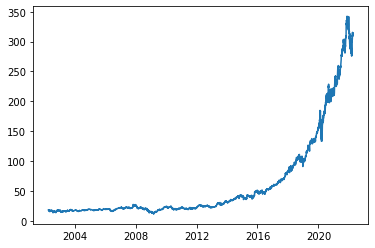

In [ ]:
import matplotlib.pyplot as plt

plt.plot(msft_hist['Close'])

In [ ]:
#plotly looks nicer
import plotly.express as px

fig = px.line(msft_hist, y="Close", title='MSFT Closing Stock Price Over Time')
fig.show()

In [ ]:
# show analysts recommendations
msft.recommendations

,Firm,To Grade,From Grade,Action
Date,,,,
2012-03-16 08:19:00,Argus Research,Buy,,up
2012-03-19 14:00:00,Hilliard Lyons,Long-Term Buy,,main
2012-03-22 07:03:00,Morgan Stanley,Overweight,,main
2012-04-03 11:53:00,UBS,Buy,,main
2012-04-20 06:18:00,Deutsche Bank,Buy,,main
...,...,...,...,...
2022-01-26 14:06:23,BMO Capital,Outperform,,main
2022-01-26 14:42:40,Oppenheimer,Outperform,,main
2022-01-26 15:03:00,Morgan Stanley,Overweight,,main


In [ ]:
# show sustainability
msft.sustainability

,Value
2022-2,
palmOil,False
controversialWeapons,False
gambling,False
socialScore,8.06
nuclear,False
furLeather,False
alcoholic,False
gmo,False
catholic,False


In [ ]:
# show earnings
msft.earnings
msft.quarterly_earnings

,Revenue,Earnings
Quarter,,
1Q2021,41706000000,15457000000
2Q2021,46152000000,16458000000
3Q2021,45317000000,20505000000
4Q2021,51728000000,18765000000


In [ ]:
# show balance sheet
msft.balance_sheet
msft.quarterly_balance_sheet


,2021-12-31,2021-09-30,2021-06-30,2021-03-31
Intangible Assets,7.462000e+09,7.794000e+09,7.800000e+09,8.127000e+09
Total Liab,1.803790e+11,1.834400e+11,1.917910e+11,1.743740e+11
Total Stockholder Equity,1.600100e+11,1.519780e+11,1.419880e+11,1.345050e+11
Other Current Liab,4.634600e+10,5.262200e+10,5.261200e+10,4.006900e+10
Total Assets,3.403890e+11,3.354180e+11,3.337790e+11,3.088790e+11
Common Stock,8.452800e+10,8.375100e+10,8.311100e+10,8.230800e+10
Other Current Assets,1.230100e+10,1.298200e+10,1.347100e+10,1.203400e+10
Retained Earnings,7.504500e+10,6.694400e+10,5.705500e+10,5.073500e+10
Other Liab,3.058400e+10,3.015700e+10,3.168100e+10,3.160100e+10
Good Will,5.092100e+10,5.045500e+10,4.971100e+10,4.969800e+10


In [ ]:
# show institutional holders
msft.institutional_holders

,Holder,Shares,Date Reported,% Out,Value
0,"Vanguard Group, Inc. (The)",615950062,2021-12-30,0.0822,207156324851
1,Blackrock Inc.,519035634,2021-12-30,0.0692,174562064426
2,State Street Corporation,302541869,2021-12-30,0.0404,101750881382
3,"FMR, LLC",215377233,2021-12-30,0.0287,72435671002
4,Price (T.Rowe) Associates Inc,204196901,2021-12-30,0.0272,68675501744
5,"Geode Capital Management, LLC",129107118,2021-12-30,0.0172,43421305925
6,Capital World Investors,107717797,2021-12-30,0.0144,36227649487
7,Capital Research Global Investors,92868182,2021-12-30,0.0124,31233426970
8,Capital International Investors,90985531,2021-12-30,0.0121,30600253785
9,Northern Trust Corporation,88410999,2021-12-30,0.0118,29734387183


# Preprocessing

In [ ]:
# set seed, so we can get the same results after rerunning several times
np.random.seed(314)
random.seed(314)
torch.random.manual_seed(314)
def load_finance(path):
    file_type = os.path.splitext(path)[1]
    assert file_type in [".csv",".xlsx"]
    
    if "csv" in file_type:    
        finance_file = pd.read_csv(path,index_col=0)
    elif "xlsx" in file_type:
        finance_file = pd.read_excel(path,index_col=0)
    return finance_file

class FinanceDataset(Dataset):
    def __init__(self,ticker, start_time="2022-03-10",end_time="2022-03-11",n_in=50,n_out=1, 
                scale=True, shuffle=True,split_by_date=True,train=True,test_size=0.2):
        
        self.feature =['Adj Close', 'Volume', 'Open', 'High', 'Low']
        self.scale = scale
        self.n_out = n_out
        self.n_in = n_in
        self.train = train
        self.split_by_date = split_by_date
        self.shuffle = shuffle
        self.test_size = test_size
        
        # see if ticker is already a loaded stock from yahoo finance
        if isinstance(ticker, str):
            # load it from yfinance library
            assert isinstance(start_time,str) and isinstance(end_time,str)
            df = yf.download(ticker, start=start_time, end=end_time, threads=False)
        elif isinstance(ticker, pd.DataFrame):
            # already loaded, use it directly
            df = ticker
        else:
            raise TypeError("ticker can be either a str or a `pd.DataFrame` instances")        
                
        # make sure that the passed feature_columns exist in the dataframe
        for col in self.feature:
            assert col in df.columns, f"'{col}' does not exist in the dataframe."

        # add date as a column
        if "Date" not in df.columns:
            df["Date"] = df.index
        df = self.preprocess(df)
        self.X,self.y=self.sequence2supervised(df)
        self.len = self.X.shape[0]
    def __getitem__(self, index):
        return self.X[index,:,:],self.y[index,:]
    
    def __len__(self):
        return self.len
        
    def preprocess(self,df):
        if self.scale:
            column_scaler = {}
            # scale the data (prices) from 0 to 1
            for column in self.feature:
                scaler = preprocessing.MinMaxScaler()
                df[column] = scaler.fit_transform(np.expand_dims(df[column].values, axis=1))
                column_scaler[column] = scaler
        # add the target column (label) by shifting by `lookup_step`
        df['future'] = df['Adj Close'].shift(-self.n_out)
        
        # drop NaNs
        df.dropna(inplace=True)
        return df

    def sequence2supervised(self,df):
        sequence_data = []
        sequences = deque(maxlen=self.n_in)

        # pair historical sequence and forcast value
        for entry, target in zip(df[self.feature].values, df['future'].values):
            sequences.append(entry)
            if len(sequences) == self.n_in:
                sequence_data.append([np.array(sequences), target])
        # construct the X's and y's
        X, y = [], []
        for seq, target in sequence_data:
            X.append(seq)
            y.append(target)
        
        # # convert to numpy arrays
        X = torch.from_numpy(np.array(X))
        y = torch.from_numpy(np.array(y)).unsqueeze(-1)
        return X,y

def data_split(data,split_by_date=True,test_size=0.2):
    train_samples = int((1 - test_size) * len(data))
    if split_by_date:
        train_data = Subset(data,range(train_samples))
        test_data = Subset(data,range(train_samples,len(data)))
    else:
        train_data, test_data = torch.utils.data.random_split(data, [train_samples,len(data)- train_samples],\
                                        generator=torch.Generator())
    return train_data,test_data

finance_path = "./Tesla dataset.xlsx"

ticker = load_finance(finance_path)
finance_data = FinanceDataset(ticker=ticker)
train_data,test_data = data_split(finance_data)

train_loader = DataLoader(train_data,batch_size=128,shuffle=True)
test_loader = DataLoader(test_data,batch_size=128,shuffle=True)


'''
stk_prd = pd.read_excel("Tesla dataset.xlsx")
#Preprocessing code Kundan
#Dealing with missing values
print("Null values:", stk_prd.isnull().values.sum())
print("NA values:", stk_prd.isna().values.any())

# convert date field from string to Date format 
stk_prd['Date'] = pd.to_datetime(stk_prd.Date)
stk_prd.head()
stk_prd.info()

#splitting training & test set
dataset_train = np.array(stk_prd[:int(stk_prd.shape[0]*0.8)])
dataset_test = np.array(stk_prd[int(stk_prd.shape[0]*0.8):])
dataset_test

#Min max scaler
scaler = MinMaxScaler(feature_range=(0,1))
dataset_train = scaler.fit_transform(dataset_train)
dataset_test = scaler.transform(dataset_test)

#Create dataset
def create_dataset(stk_prd):
    x = []
    y = []
    for i in range(50, stk_prd.shape[0]):
        x.append(stk_prd[i-50:i, 0])  # for feature x, we will always append the last 50 price 
        y.append(stk_prd[i, 0]) # label y, we will append the next price
    x = np.array(x) # use numpy to convert it in array
    y = np.array(y)
    return x,y

 #create training & test data
x_train, y_train = create_dataset(dataset_train)
x_test, y_test = create_dataset(dataset_test)   
'''

'\nstk_prd = pd.read_excel("Tesla dataset.xlsx")\n#Preprocessing code Kundan\n#Dealing with missing values\nprint("Null values:", stk_prd.isnull().values.sum())\nprint("NA values:", stk_prd.isna().values.any())\n\n# convert date field from string to Date format \nstk_prd[\'Date\'] = pd.to_datetime(stk_prd.Date)\nstk_prd.head()\nstk_prd.info()\n\n#splitting training & test set\ndataset_train = np.array(stk_prd[:int(stk_prd.shape[0]*0.8)])\ndataset_test = np.array(stk_prd[int(stk_prd.shape[0]*0.8):])\ndataset_test\n\n#Min max scaler\nscaler = MinMaxScaler(feature_range=(0,1))\ndataset_train = scaler.fit_transform(dataset_train)\ndataset_test = scaler.transform(dataset_test)\n\n#Create dataset\ndef create_dataset(stk_prd):\n    x = []\n    y = []\n    for i in range(50, stk_prd.shape[0]):\n        x.append(stk_prd[i-50:i, 0])  # for feature x, we will always append the last 50 price \n        y.append(stk_prd[i, 0]) # label y, we will append the next price\n    x = np.array(x) # use numpy

# Implementation + Results



In [ ]:
#get stock data
d_stock = yf.download('GOLD', start='2018-03-10', end_time='2022-03-11', threads=False) #make end time today
#drop adjusted price
d_stock = d_stock.drop('Adj Close', axis=1)
#split into target and predictors 
x_stock = d_stock.loc[:, d_stock.columns != 'Close']
y_stock = d_stock['Close']

#make np array
x_stock = np.array(x_stock)
y_stock = np.array(y_stock)

#see type and shape
print('x_stock type: ', type(x_stock), '\ny_stock type: ', type(y_stock))
print('\nx_stock shape: ', x_stock.shape, '\ny_stock shape: ', y_stock.shape)

[*********************100%***********************]  1 of 1 completed
x_stock type:  <class 'numpy.ndarray'> 
y_stock type:  <class 'numpy.ndarray'>

x_stock shape:  (1038, 4) 
y_stock shape:  (1038,)


In [ ]:
#split into a train and test set 
X_train, X_test, y_train, y_test = train_test_split(
                                                     x_stock, 
                                                     y_stock, 
                                                     test_size=0.3, 
                                                     shuffle = False                                           
                                                    )

#scale and fit to X-train and transform both 
scaler = MinMaxScaler()
scaler.fit(X_train)
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [ ]:
#make batches of (length) days of predictors for one closing value
d_train = TimeseriesGenerator(
    X_train_scaled,
    y_train,
    length = 12, 
    sampling_rate=1,
    batch_size=1
)

#divide into x and y 
dx_train = []
dy_train = []

for i in range(len(d_train)):
  dx_train.append(d_train[i][0])
  dy_train.append(d_train[i][1])

dx_train = np.array(dx_train)
dy_train = np.array(dy_train)

#reshape
dx_train = dx_train.reshape(dx_train.shape[0], dx_train.shape[2], dx_train.shape[3])

#flatten so its just (x) blocks of (length) rows (not separated by columns) 

dx_train_flat = []

for i in range(len(dx_train)):
  dx_train_flat.append(dx_train[i].flatten())

dx_train_flat = np.array(dx_train_flat)
dx_train_flat.shape

dx_train_flat = dx_train_flat.reshape(dx_train_flat.shape[0], dx_train_flat.shape[1], 1)

#see type and shape
print('dx_train_flat type: ', type(dx_train_flat), '\ndy_train_flat type: ', type(dy_train))
print('\ndx_train_flat shape: ', dx_train_flat.shape, '\ndy_train shape: ', dy_train.shape)

dx_train_flat type:  <class 'numpy.ndarray'> 
dy_train_flat type:  <class 'numpy.ndarray'>

dx_train_flat shape:  (714, 48, 1) 
dy_train shape:  (714, 1)


In [ ]:
dx_train[0]

array([[0.10051186, 0.11085126, 0.11252447, 0.28877022],
       [0.11586783, 0.11646398, 0.12671234, 0.12360058],
       [0.11772916, 0.11739945, 0.13013698, 0.13495117],
       [0.12005583, 0.11739945, 0.13013698, 0.10997311],
       [0.11865985, 0.11739945, 0.12818004, 0.31417221],
       [0.12098652, 0.11973805, 0.13062623, 0.19671165],
       [0.11586783, 0.11459307, 0.11154602, 0.29134764],
       [0.11214517, 0.12254443, 0.12426615, 0.22615392],
       [0.12098652, 0.11880262, 0.12769083, 0.09545797],
       [0.12843184, 0.13143122, 0.14041096, 0.21948249],
       [0.13448117, 0.13797942, 0.14628184, 0.17912949],
       [0.13494646, 0.13376987, 0.1433464 , 0.13502481]])

In [ ]:
d_test = TimeseriesGenerator(
    X_test_scaled,
    y_test,
    length = 12,
    sampling_rate=1,
    batch_size=1
)

dx_test = []
dy_test = []

for i in range(len(d_test)):
  dx_test.append(d_test[i][0])
  dy_test.append(d_test[i][1])

dx_test = np.array(dx_test)
dy_test = np.array(dy_test)

dx_test = dx_test.reshape(dx_test.shape[0], dx_test.shape[2], dx_test.shape[3])

##flatten so its just x blocks of length rows (not separated by columns) 

dx_test_flat = []

for i in range(len(dx_test)):
  dx_test_flat.append(dx_test[i].flatten())

dx_test_flat = np.array(dx_test_flat)
dx_test_flat.shape

dx_test_flat = dx_test_flat.reshape(dx_test_flat.shape[0], dx_test_flat.shape[1], 1)

#see type and shape
print('dx_test_flat type: ', type(dx_test_flat), '\ndy_test type: ', type(dy_test))
print('\ndx_test shape: ', dx_test_flat.shape, '\ndy_test shape: ', dy_test.shape)


dx_test_flat type:  <class 'numpy.ndarray'> 
dy_test type:  <class 'numpy.ndarray'>

dx_test shape:  (300, 48, 1) 
dy_test shape:  (300, 1)


In [ ]:
def scheduler(epoch):
    # With every 10 epochs, the learning rate decreases to 1/2 of its original value
    if epoch % 10 == 0 and epoch != 0:
        lr = K.get_value(model.optimizer.lr)
        K.set_value(model.optimizer.lr, lr * 0.5)
        print("lr changed to {}".format(lr * 0.5))
    return K.get_value(model.optimizer.lr)
reduce_lr = LearningRateScheduler(scheduler)

In [ ]:
model = Sequential()
model.add(Bidirectional(LSTM(64, input_shape=(dx_train_flat.shape[1], dx_train_flat.shape[2])))) # 双向LSTM
model.add(Dropout(0.3))
model.add(Dense(1,activation='relu'))
model.compile(loss='mae', optimizer='adam')

In [ ]:
model.fit(dx_train_flat, dy_train, epochs=50, batch_size=1, callbacks=[reduce_lr])

Epoch 1/50
714/714 [==============================] - 22s 23ms/step - loss: 5.7325 - lr: 0.0010
Epoch 2/50
714/714 [==============================] - 9s 12ms/step - loss: 4.8852 - lr: 0.0010
Epoch 3/50
714/714 [==============================] - 12s 17ms/step - loss: 4.3651 - lr: 0.0010
Epoch 4/50
714/714 [==============================] - 11s 16ms/step - loss: 3.9360 - lr: 0.0010
Epoch 5/50
714/714 [==============================] - 9s 12ms/step - loss: 2.1224 - lr: 0.0010
Epoch 6/50
714/714 [==============================] - 9s 12ms/step - loss: 1.8497 - lr: 0.0010
Epoch 7/50
714/714 [==============================] - 9s 12ms/step - loss: 1.6302 - lr: 0.0010
Epoch 8/50
714/714 [==============================] - 10s 13ms/step - loss: 1.6224 - lr: 0.0010
Epoch 9/50
714/714 [==============================] - 9s 12ms/step - loss: 1.6263 - lr: 0.0010
Epoch 10/50
714/714 [==============================] - 9s 13ms/step - loss: 1.5715 - lr: 0.0010
lr changed to 0.0005000000237487257
Epoch 11/

In [ ]:
predictions = model.predict(dx_test_flat)
MSE = mean_squared_error(dy_test, predictions)
leadz = [np.nan] * (len(X_test)-len(predictions))
for value in predictions:
  leadz.append(value)
predictions = leadz
print(predictions)
MSE

[nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, array([21.800701], dtype=float32), array([22.026058], dtype=float32), array([22.060925], dtype=float32), array([21.700163], dtype=float32), array([21.60216], dtype=float32), array([21.332056], dtype=float32), array([21.2615], dtype=float32), array([21.18487], dtype=float32), array([21.10394], dtype=float32), array([21.053677], dtype=float32), array([20.83467], dtype=float32), array([20.870642], dtype=float32), array([20.645674], dtype=float32), array([20.704157], dtype=float32), array([20.442972], dtype=float32), array([20.0561], dtype=float32), array([20.21307], dtype=float32), array([20.373953], dtype=float32), array([20.193426], dtype=float32), array([19.991888], dtype=float32), array([20.038599], dtype=float32), array([20.139305], dtype=float32), array([20.336658], dtype=float32), array([20.47065], dtype=float32), array([20.547827], dtype=float32), array([20.580423], dtype=float32), array([20.077314], dtype=float32), arra

0.7807036797847225

In [ ]:
real1 = d_stock[:len(X_train)]
real2 = d_stock[len(X_train):]
print(len(real2))
print(len(predictions))

312
312


In [ ]:
d_stock[int(len(d_stock)//(10/7))-1:int(len(d_stock)//(10/7))+1] #barrier of train/test

,Open,High,Low,Close,Volume
Date,,,,,
2021-01-27,23.090000,23.110001,21.879999,21.990000,32615300
2021-01-28,22.440001,22.549999,22.090000,22.360001,23204400


In [ ]:
real2['Predictions'] = predictions

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


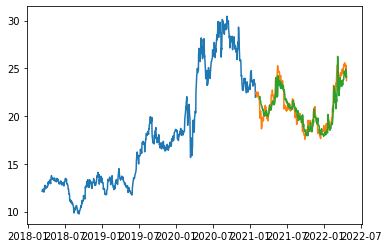

<Figure size 36000x18000 with 0 Axes>

In [ ]:
plt.plot(real1['Close'])
plt.plot(real2[['Close', 'Predictions']])
plt.figure(figsize=(500,250))
#figure.xticks(rotation=45)
plt.show();

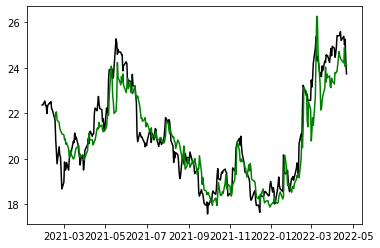

In [ ]:
plt.plot(real2['Close'], color='Black')
plt.plot(real2['Predictions'], color='Green')
plt.show()